In [1]:
import re
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import json
import statsmodels.api as sm
from scipy.stats import pearsonr
from sklearn.linear_model import LinearRegression
# Statistics functions
from scipy import stats
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')

In [2]:
data = pd.read_csv('Handling_Missing_Values_final.csv')
df = data.copy()

In [3]:
df.T


,0,1,2,3,4,5,6,7,8,9,...,26849,26850,26851,26852,26853,26854,26855,26856,26857,26858
make_model,Renault Clio,Fiat 500 Abarth,Nissan Micra,Dacia,Dacia,Dacia,Dacia Break,Dacia Dokker,Dacia Duster,Dacia Duster,...,Fiat,Ford V8,Ford V8,Ford V8,Ford Roadster,Peugeot,Ford M,Ford,Ford Bronco,Hyundai IONIQ
price,16990.0,17995.0,3250.0,22299.0,22479.0,21799.0,20500.0,16900.0,21000.0,21000.0,...,159000.0,40000.0,54990.0,49900.0,40000.0,8950.0,20000.0,14490.0,57480.0,26991.0
body_type,Sedan,Compact,Convertible,Compact,Compact,Station wagon,Station wagon,Station wagon,Off-Road/Pick-up,Off-Road/Pick-up,...,Convertible,Convertible,Convertible,Convertible,Convertible,Coupe,Convertible,Convertible,Off-Road/Pick-up,Sedan
type,Used,Used,Used,Pre-registered,Pre-registered,Demonstration,Demonstration,Used,Pre-registered,Pre-registered,...,Used,Used,Used,Used,Used,Used,Used,Used,Used,Used
doors,5.0,3.0,2.0,5.0,5.0,5.0,4.0,6.0,5.0,5.0,...,4.0,2.0,2.0,2.0,2.0,2.0,4.0,2.0,5.0,5.0
warranty,No,No,No,No,No,No,Yes,Yes,Yes,Yes,...,No,No,No,No,No,No,No,No,No,No
mileage,20926.0,59629.0,147985.0,110.0,110.0,2000.0,999.0,90.0,1000.0,1000.0,...,999999.0,15000.0,25600.0,3500.0,60000.0,1233.0,65515.0,5000.0,10.0,29961.0
gearbox,Manual,Manual,Manual,Automatic,Automatic,Manual,Manual,Manual,Manual,Manual,...,Manual,Manual,Automatic,Automatic,Manual,Manual,Manual,Automatic,Automatic,Automatic
fuel_type,LPG,Benzine,Benzine,Electric,Electric,Benzine,Benzine,LPG,Diesel,Diesel,...,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Electric
colour,Grey,Grey,Blue,Black,Black,Grey,Brown,White,Orange,Orange,...,Brown,Black,Red,Black,Black,White,Green,Red,Silver,Grey


In [986]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 26859 entries, 0 to 26858
Data columns (total 36 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   make_model                   26859 non-null  object 
 1   price                        26859 non-null  float64
 2   body_type                    26859 non-null  object 
 3   type                         26859 non-null  object 
 4   doors                        26859 non-null  float64
 5   warranty                     26859 non-null  object 
 6   mileage                      26859 non-null  float64
 7   gearbox                      26859 non-null  object 
 8   fuel_type                    26859 non-null  object 
 9   colour                       26859 non-null  object 
 10  paint                        26859 non-null  object 
 11  seller                       26859 non-null  object 
 12  seats                        26859 non-null  float64
 13  engine_size     

In [987]:
df[df['age']< 0][['age']]

df[df['age']< 0][['age']].index

df = df.drop([0,1,2])

df.reset_index(drop=True, inplace = True)

In [988]:
df.drop_duplicates(inplace=True)

In [989]:
df.describe()

,price,doors,mileage,seats,engine_size,gears,co2_emissions,cylinders,empty_weight,power_kW,fuel_consumption_comb,age,num_of_extras
count,2.582700e+04,25827.000000,2.582700e+04,25827.000000,25827.000000,25827.000000,25827.000000,25827.000000,25827.000000,25827.000000,25827.000000,25827.000000,25827.000000
mean,2.361011e+04,4.134665,7.074945e+04,4.698145,1738.171177,5.840167,133.070314,4.022806,1409.461261,118.927495,5.881759,6.802842,4.571108
std,2.604732e+04,1.207498,6.713669e+04,0.790508,1076.231807,1.524932,127.690895,1.066509,314.006106,68.747941,2.453268,8.750392,3.639096
min,4.900000e+02,1.000000,0.000000e+00,0.000000,0.000000,1.000000,0.000000,0.000000,75.000000,1.000000,0.500000,0.000000,1.000000
25%,1.197000e+04,3.000000,1.947350e+04,4.000000,1248.000000,5.000000,106.000000,4.000000,1205.000000,79.525000,4.500000,2.000000,1.000000
50%,1.820000e+04,5.000000,5.500000e+04,5.000000,1595.000000,6.000000,125.000000,4.000000,1373.000000,100.000000,5.400000,4.000000,4.000000
75%,2.799000e+04,5.000000,1.038000e+05,5.000000,1984.000000,6.000000,157.000000,4.000000,1580.000000,135.000000,6.700000,8.000000,7.000000
max,1.346900e+06,6.000000,1.440000e+06,17.000000,99900.000000,10.000000,15168.000000,26.000000,15590.000000,665.000000,99.900000,122.000000,26.000000


In [ ]:
num_features = len(df.select_dtypes('number').columns)
num_rows = (num_features * 2 + 1) // 2  # Her bir feature için iki subplot, çift sayıya yuvarlanmış hali
plt.figure(figsize=(20, num_rows * 5))
index = 0
for feature in df.select_dtypes('number').columns:
    index += 1
    plt.subplot(num_rows, 2, index)
    sns.boxplot(x=feature, data=df, whis=1.5)
    index += 1
    plt.subplot(num_rows, 2, index)
    sns.histplot(x=feature, data=df)
plt.tight_layout()
plt.show()

In [991]:
def box_plot_with_price(df, column):
    plt.figure(figsize=(7, 4))
    sns.boxplot(data=df, x=column, y='price')
    plt.title(f'Box plot of Price vs {column}')
    plt.xlabel(column)
    plt.ylabel('Price')
    plt.show()    

In [1521]:
def barplot_column_by_price(df, column):

    # Ensure the DataFrame contains the necessary columns
    if 'price' not in df.columns or column not in df.columns:
        raise ValueError(f"The DataFrame must contain 'price' and '{column}' columns")

    # Group by the specified column and calculate the mean price for each group
    mean_prices = df.groupby(column)['price'].mean().sort_values(ascending=False)

    # Create the bar plot
    plt.figure(figsize=(7, 4))
    mean_prices.plot(kind='bar')
    plt.ylabel('Mean Price (€)')
    plt.title(f'Mean Price by {column}')
    plt.xticks(rotation=45, ha='right')
    plt.show()


In [1398]:
# Function to create a histogram of the price column grouped by another column
def histogram_price_grouped_by_column(df, column):
    plt.figure(figsize=(7, 4))
    if pd.api.types.is_numeric_dtype(df[column]):
        sns.histplot(df, x='price', hue=column, bins=10, kde=False, element="step", stat="density", common_norm=False)
    else:
        sns.histplot(df, x='price', hue=column, multiple="dodge", bins=10)
    plt.title(f'Histogram of Price grouped by {column}')
    plt.xlabel('Price')
    plt.ylabel('Frequency')
    plt.show()


In [993]:
# Function to create a scatter plot with the price column
def scatter_plot_with_price(df, column):
    plt.figure(figsize=(7, 4))
    sns.scatterplot(data=df, x=column, y='price')
    plt.title(f'Scatter plot of Price vs {column}')
    plt.xlabel(column)
    plt.ylabel('Price')
    plt.show()

In [994]:
def correlation_with_price(df, column):
    if pd.api.types.is_numeric_dtype(df[column]):
        correlation = df['price'].corr(df[column])
        print(f'Correlation between Price and {column}: {correlation:.2f}')
    else:
        print(f'Column {column} is not numeric, correlation cannot be calculated.')

In [995]:
def compare_with_price(df, column):
    if column not in df.columns:
        print(f"Column '{column}' not found in the DataFrame.")
        return
    
    scatter_plot_with_price(df, column)
    box_plot_with_price(df, column)
    histogram_of_price(df)
    histogram_price_grouped_by_column(df, column)
    correlation_with_price(df, column)

In [1391]:
def barplot_column(df, x_col, y_col, hue_col=None, title='', xlabel='', ylabel='', figsize=(10, 6), xlim=None):

    plt.figure(figsize=figsize)
    if hue_col:
        sns.barplot(x=x_col, y=y_col, hue=hue_col, data=df, ci=None)
    else:
        sns.barplot(x=x_col, y=y_col, data=df, ci=None)
    
    plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    
    if xlim:
        plt.xlim(xlim)
    
    plt.show()

In [1525]:
def box_plot_column(df, column):
    
    plt.figure(figsize=(7, 4))
    sns.boxplot(data=df[column])
    # Calculate whisker bounds
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_whisker = Q1 - 1.5 * IQR
    upper_whisker = Q3 + 1.5 * IQR
    
    # Annotate the plot with whisker bounds
    plt.text(0.5, lower_whisker, f'Lower Whisker: {lower_whisker:.2f}', horizontalalignment='center', verticalalignment='bottom', fontsize=10, color='blue')
    plt.text(0.5, upper_whisker, f'Upper Whisker: {upper_whisker:.2f}', horizontalalignment='center', verticalalignment='top', fontsize=10, color='blue')
    plt.title(f'Box plot of {column}')
    plt.xlabel(column)
    plt.show()

In [1526]:
def hist_plot_column(df, column, bins=50, kde=False):
    
    plt.figure(figsize=(7, 4))
    sns.histplot(df[column], bins=bins, kde=kde)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

In [1527]:
def kde_plot_column(df,column):
    # Your Code is Here

    plt.figure(figsize=(7,4))
    sns.kdeplot(data=df, x=column ,fill=True);

In [1528]:
def kde_plot_with_price(df,column):
    plt.figure(figsize=(7,4))
    sns.kdeplot(data=df, x= column ,hue="price",fill=True);

In [1529]:
def count_plot_column(df,column):
    # Your Code is Here
    plt.figure(figsize=(7,4))
    sns.countplot(data=df, x=column, palette="Set2")
    plt.xticks(rotation=90);

In [1535]:
def count_plot_with_price(df, column):
    
    plt.figure(figsize=(7, 4))
    ax = sns.countplot(data=df, x=column, palette='viridis')

    # Calculate mean price for each category
    mean_prices = df.groupby(column)['price'].mean()

  

    plt.title(f'Count Plot of {column} with Mean Price')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

# Example usage:
# count_plot_with_price(df, 'type')

In [1456]:
def pie_chart_column(df,column):

    # Calculate value counts for the specified column
    value_counts = df[column].value_counts()
    
    # Plot pie chart
    plt.figure(figsize=(7, 4))
    plt.pie(value_counts, labels=value_counts.index, autopct='%1.1f%%', startangle=140)
    plt.title(f'Pie chart of {column}')
    plt.axis('equal')  # Equal aspect ratio ensures the pie chart is drawn as a circle.
    plt.show()

In [1443]:
def pie_chart_with_price(df, column):
  
    # Group by the specified column and sum the prices
    price_sum = df.groupby(column)['price'].sum()
    
    # Plot pie chart
    plt.figure(figsize=(7, 4))
    plt.pie(price_sum, labels=price_sum.index, autopct='%1.1f%%', startangle=140)
    plt.title(f'Pie chart of {column} weighted by Price')
    plt.axis('equal')  # Equal aspect ratio ensures the pie chart is drawn as a circle.
    plt.show()


In [1444]:

def grouped_column(df,grouped_column):
    return df.groupby(grouped_column)['price'].value_counts()

In [1479]:
def plot_column_by_price(df, column):

    # Ensure the DataFrame contains the necessary columns
    if 'price' not in df.columns or column not in df.columns:
        raise ValueError(f"The DataFrame must contain 'price' and '{column}' columns")

    # Group by the specified column and calculate the mean price for each group
    mean_prices = df.groupby(column)['price'].mean().sort_values(ascending=False)

    # Create the bar plot
    plt.figure(figsize=(7, 4))
    mean_prices.plot(kind='bar', color='skyblue')
    plt.ylabel('Mean Price (€)')
    plt.title(f'Mean Price by {column}')
    plt.xticks(rotation=45, ha='right')
    plt.show()


In [1407]:

def grouped_by_price(df,value_column):
    return df.groupby('price')[value_column].value_counts(ascending=True)

In [1408]:
def grouped_by_column(df,grouped_column, value_column):
    return df.groupby(grouped_column)[value_column].value_counts()

In [1409]:
def grouped_average(df,group_column, value_column):
    return df.groupby(group_column)[value_column].mean()

In [1410]:
def calculate_z_score(df,column):
# Step 1: Calculate Z-scores for the relevant columns
    df['z_score_fuel_cons'] =  stats.zscore(df[column])

    # Step 2: Filter out rows where the z-score is greater than 3 or less than -3
    df_no_outliers = df[(df['z_score_fuel_cons'].abs() <= 3) ]


    # Step 3: Drop the z-score column as it's no longer needed
    df_no_outliers = df_no_outliers.drop(columns=['z_score_fuel_cons'])
    return_df = df_no_outliers.sort_values(by=column)
    # Print the resulting DataFrame
    return return_df 

In [1411]:
# Calculate the 25th and 75th percentiles (Q1 and Q3)
def upper_lower_whisker(df,column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)

    # Calculate the Interquartile Range (IQR)
    IQR = Q3 - Q1
    IQR
    upper_whisker=Q3 + (1.5 * IQR)
    lower_whisker=Q1 - (1.5 * IQR)
    return upper_whisker,lower_whisker

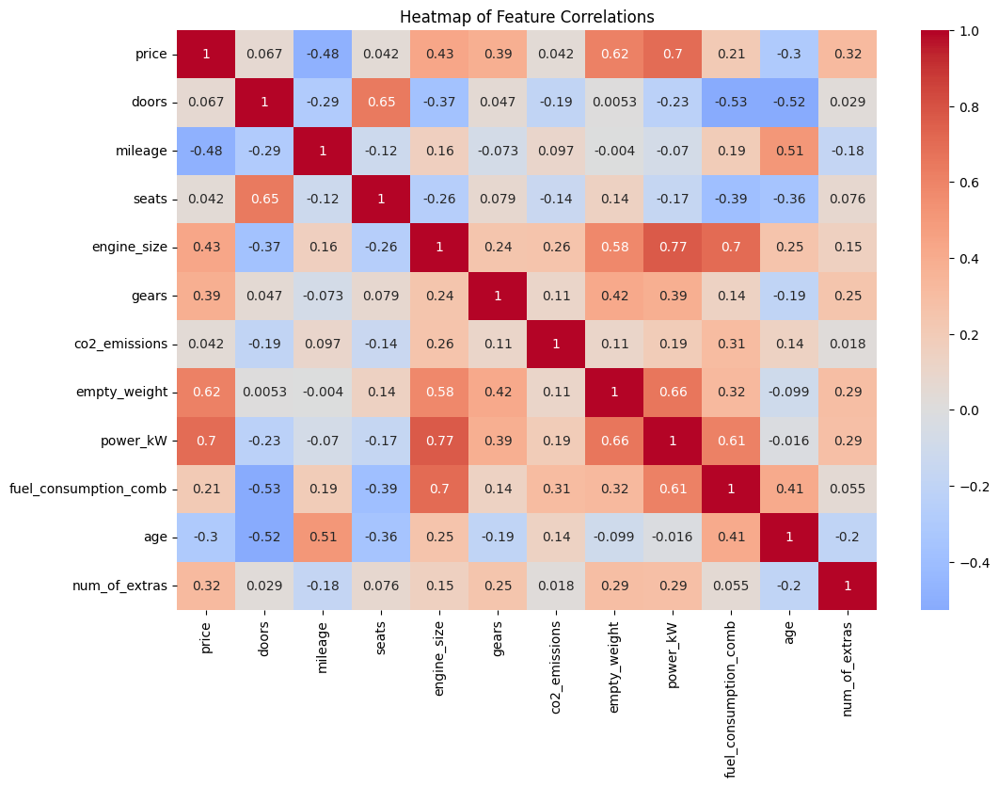

In [1412]:
# Ensure the DataFrame contains only numeric data for correlation
numeric_df = df.select_dtypes(include=[np.number])

# Heatmap to understand correlations between features
plt.figure(figsize=(12, 8))
sns.heatmap(numeric_df.corr(), annot=True, cmap='coolwarm', center=0)
plt.title('Heatmap of Feature Correlations')
plt.show()

# 1: Price

** 1   price                       
 2   type                         
 3   doors                      
 4   mileage                      
 5   gearbox                    
 6  seats                        
 7  engine_size                  
 8  gears                        
 9  co2_emissions                
 10  cylinders                    
 11  empty_weight                 
 12  power_kW                     
 13  fuel_consumption_comb   
 14  age                          
 15  num_of_extras **               

# 2. Doors

# 6. Seats

In [1011]:
df['seats'].describe()

count    25827.000000
mean         4.698145
std          0.790508
min          0.000000
25%          4.000000
50%          5.000000
75%          5.000000
max         17.000000
Name: seats, dtype: float64

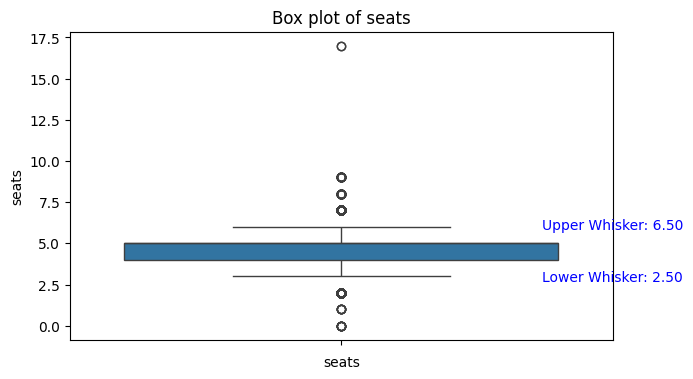

In [1012]:
box_plot_column(df,'seats')

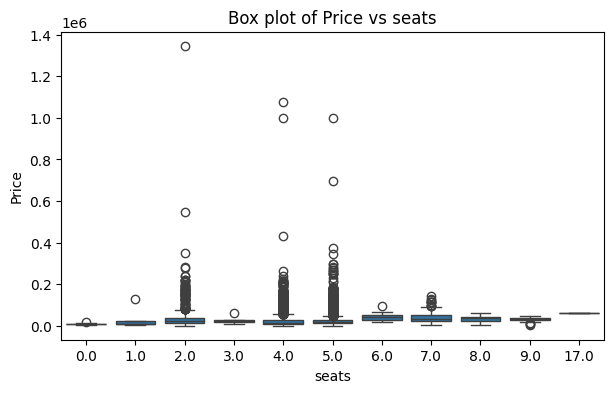

In [1013]:
box_plot_with_price(df, 'seats')

In [1014]:
upper_lower_whisker(df,'seats')

(6.5, 2.5)

In [1015]:
df.groupby('price')['seats'].value_counts().sort_values()

price    seats
490.0    4.0        1
32555.0  5.0        1
32544.0  5.0        1
32499.0  5.0        1
32498.0  5.0        1
                 ... 
12990.0  5.0      130
16990.0  5.0      135
19990.0  5.0      135
18990.0  5.0      136
14990.0  5.0      156
Name: count, Length: 7022, dtype: int64

In [1016]:
df.groupby('price')['seats'].value_counts().sort_values().head(20)

price    seats
490.0    4.0      1
32555.0  5.0      1
32544.0  5.0      1
32499.0  5.0      1
32498.0  5.0      1
32490.0  4.0      1
32488.0  5.0      1
32481.0  5.0      1
32480.0  4.0      1
32470.0  5.0      1
32449.0  2.0      1
32440.0  5.0      1
32400.0  4.0      1
32399.0  5.0      1
32390.0  5.0      1
         7.0      1
32360.0  4.0      1
32350.0  5.0      1
32580.0  5.0      1
32340.0  5.0      1
Name: count, dtype: int64

In [1017]:
df[(df['seats'] < upper_lower_whisker(df,'seats')[1]) | (df['seats'] > upper_lower_whisker(df,'seats')[0]) ][['make_model','seats']]

,make_model,seats
2,Dacia,7.0
61,Dacia Jogger,7.0
63,Dacia Jogger,7.0
64,Dacia Jogger,7.0
71,Dacia Jogger,7.0
...,...,...
26847,Ford V8,2.0
26848,Ford V8,2.0
26850,Ford Roadster,2.0
26851,Peugeot,2.0


In [1018]:
df[(df['seats'] < upper_lower_whisker(df,'seats')[1])][['make_model','seats']]

,make_model,seats
518,Fiat Strada,2.0
1173,Mercedes-Benz AMG GT,2.0
1178,Mercedes-Benz AMG GT Roadster,2.0
1179,Mercedes-Benz AMG GT Roadster,2.0
1180,Mercedes-Benz AMG GT Roadster,2.0
...,...,...
26847,Ford V8,2.0
26848,Ford V8,2.0
26850,Ford Roadster,2.0
26851,Peugeot,2.0


In [1019]:
df[(df['seats'] > upper_lower_whisker(df,'seats')[0])][['make_model','seats']]

,make_model,seats
2,Dacia,7.0
61,Dacia Jogger,7.0
63,Dacia Jogger,7.0
64,Dacia Jogger,7.0
71,Dacia Jogger,7.0
73,Dacia Jogger,7.0
74,Dacia Jogger,7.0
77,Dacia Jogger,7.0
78,Dacia Jogger,7.0
80,Dacia Jogger,7.0


In [1020]:
df[(df['seats'] == 17) | (df['seats'] == 1) | (df['seats'] == 0)][['make_model','seats']]

,make_model,seats
1804,Opel Movano,17.0
1805,Opel Movano,17.0
7560,SEAT Ibiza,0.0
13531,Renault,1.0
13837,SEAT Ibiza,0.0
18138,Renault Twizy,1.0
18175,SEAT Ibiza,0.0
19378,Renault Twingo,0.0
19386,Renault Twizy,1.0
19398,SEAT Ibiza,0.0


In [1021]:
df[df['seats'] == 0]

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,power_kW,fuel_consumption_comb,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras
7560,SEAT Ibiza,18950.0,Sedan,Used,4.0,Yes,11400.0,Manual,Benzine,Grey,...,70.0,4.600000,Germany,2.0,no,Inefficient,Advanced,Advanced,Advanced,6
13837,SEAT Ibiza,14700.0,Compact,Used,5.0,No,66510.0,Manual,Benzine,Blue,...,85.0,4.700000,Germany,4.0,no,Efficient,Advanced,Enhanced,Advanced,3
18175,SEAT Ibiza,10900.0,Coupe,Used,2.0,Yes,43231.0,Manual,Benzine,Silver,...,66.0,5.790769,Germany,6.0,no,Efficient,Advanced,Advanced,Advanced,3
19378,Renault Twingo,7750.0,Compact,Used,5.0,No,53335.0,Manual,Benzine,Black,...,52.0,4.700000,Germany,7.0,no,Inefficient,Advanced,Enhanced,Advanced,1
19398,SEAT Ibiza,9900.0,Compact,Used,5.0,No,132390.0,Manual,Benzine,White,...,103.0,4.700000,Germany,7.0,no,Efficient,Enhanced,Advanced,Advanced,5
19835,Hyundai i30,8900.0,Station wagon,Used,5.0,No,114730.0,Manual,Diesel,White,...,66.0,4.400000,Germany,8.0,no,Efficient,Advanced,Enhanced,Advanced,2
20382,SEAT Toledo,7650.0,Sedan,Used,5.0,No,124800.0,Manual,Benzine,Silver,...,63.0,5.100000,Germany,8.0,no,Inefficient,Advanced,Enhanced,Advanced,4
23220,Skoda Fabia,2900.0,Sedan,Used,5.0,No,197000.0,Manual,Benzine,Grey,...,77.0,6.900000,Germany,13.0,no,Inefficient,Enhanced,Basic,Advanced,2
23576,Skoda Fabia,2950.0,Sedan,Used,5.0,No,139877.0,Manual,Benzine,Red,...,63.0,6.500000,Germany,14.0,no,Efficient,Advanced,Basic,Advanced,2


In [1022]:
df[df['make_model'] == 'Renault Twizy']

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,power_kW,fuel_consumption_comb,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras
2229,Renault Twizy,14990.0,Compact,Used,2.0,No,4500.0,Automatic,Electric,Black,...,9.000000,3.447727,Germany,0.0,no,Efficient,Basic,Enhanced,Basic,1
4897,Renault Twizy,10390.0,Compact,Pre-registered,5.0,Yes,10.0,Automatic,Electric,Black,...,13.000000,3.447727,Spain,1.0,no,Efficient,Basic,Advanced,Basic,1
7431,Renault Twizy,8500.0,Coupe,Used,2.0,No,10300.0,Automatic,Electric,Blue,...,4.000000,3.447727,Germany,2.0,no,Efficient,Basic,Advanced,Enhanced,4
10534,Renault Twizy,11999.0,Coupe,Used,2.0,Yes,30254.0,Automatic,Electric,Black,...,16.818182,3.447727,Netherlands,3.0,yes,Efficient,Basic,Advanced,Basic,1
16531,Renault Twizy,5900.0,Convertible,Used,2.0,Yes,7200.0,Automatic,Electric,White,...,1.000000,3.447727,Italy,5.0,no,Efficient,Basic,Advanced,Basic,1
18137,Renault Twizy,6490.0,Compact,Used,3.0,Yes,1000.0,Automatic,Electric,White,...,59.000000,3.447727,Italy,6.0,no,Efficient,Basic,Advanced,Basic,1
18138,Renault Twizy,7950.0,Off-Road/Pick-up,Used,2.0,Yes,35784.0,Automatic,Electric,Orange,...,59.000000,3.447727,Netherlands,6.0,no,Efficient,Basic,Advanced,Basic,1
19386,Renault Twizy,3999.0,Coupe,Used,2.0,No,91900.0,Automatic,Electric,White,...,8.000000,3.447727,Germany,7.0,no,Efficient,Basic,Advanced,Basic,1
20302,Renault Twizy,5995.0,Coupe,Used,2.0,No,15770.0,Automatic,Electric,White,...,8.000000,3.447727,Austria,8.0,no,Efficient,Basic,Advanced,Basic,1
21656,Renault Twizy,8990.0,Compact,Used,2.0,No,25000.0,Automatic,Electric,White,...,12.000000,3.447727,Germany,10.0,yes,Efficient,Basic,Advanced,Basic,2


In [1023]:
mean_by_make_model = df.groupby(['make_model'])['seats'].mean()

# Fill the rows with values of 0 or 1 in the 'seats' column with the mean value
for index, row in data.iterrows():
    if row['seats'] == 0 or row['seats'] == 1:
        make_model = row['make_model']
        mean_seats = mean_by_make_model[make_model]
        data.at[index, 'seats'] = mean_seats

# 11. Empty Weight

In [1024]:
df['empty_weight'].describe()

count    25827.000000
mean      1409.461261
std        314.006106
min         75.000000
25%       1205.000000
50%       1373.000000
75%       1580.000000
max      15590.000000
Name: empty_weight, dtype: float64

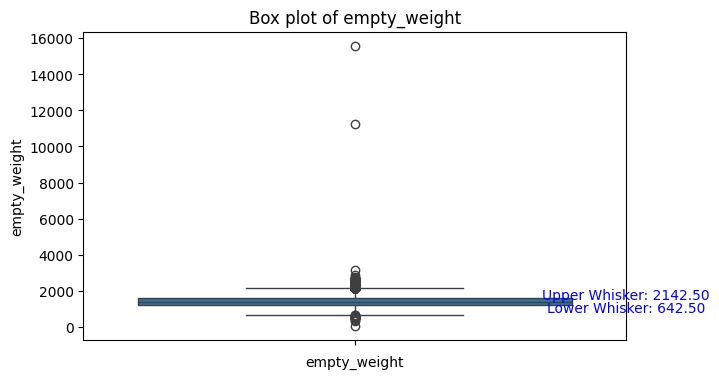

In [1025]:
box_plot_column(df,'empty_weight')

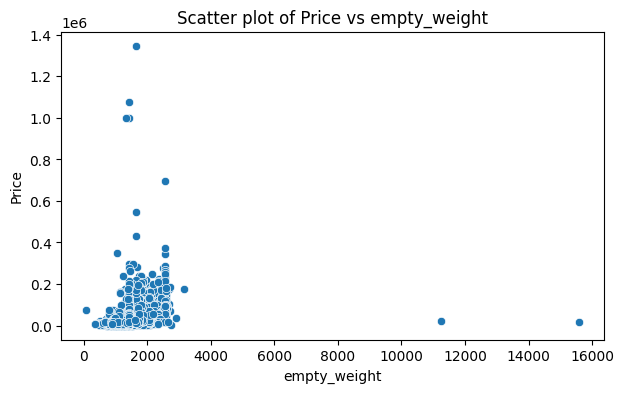

In [1026]:
scatter_plot_with_price(df,'empty_weight')

In [1027]:
upper_lower_whisker(df,'empty_weight')

(2142.5, 642.5)

In [1028]:
df['empty_weight'].value_counts().sort_values()

empty_weight
2152.0      1
2712.0      1
1776.0      1
2252.0      1
2066.0      1
         ... 
1374.0    288
1337.0    303
1054.0    308
1414.0    313
1365.0    319
Name: count, Length: 1283, dtype: int64

In [1029]:
df.groupby('empty_weight')[['price','empty_weight']].value_counts()

empty_weight  price   
75.0          74490.0     1
347.0         7445.0      1
375.0         7950.0      1
473.0         10390.0     1
474.0         11999.0     1
                         ..
2750.0        2450.0      1
2900.0        36990.0     1
3150.0        175870.0    1
11246.0       20980.0     1
15590.0       16590.0     1
Name: count, Length: 21745, dtype: int64

In [1030]:
df[df['empty_weight'] < upper_lower_whisker(df,'empty_weight')[1]][['make_model', 'empty_weight']]

,make_model,empty_weight
2229,Renault Twizy,562.0
2432,Skoda Enyaq,75.0
4271,Opel Astra,525.0
4897,Renault Twizy,473.0
7431,Renault Twizy,562.0
10534,Renault Twizy,474.0
16531,Renault Twizy,479.0
18137,Renault Twizy,479.0
18138,Renault Twizy,375.0
19386,Renault Twizy,562.0


In [1031]:
df[df['empty_weight'] > upper_lower_whisker(df,'empty_weight')[0]][['make_model', 'empty_weight']]

,make_model,empty_weight
589,Ford Bronco,2173.0
590,Ford Bronco,2173.0
591,Ford Bronco,2200.0
592,Ford Bronco,2173.0
593,Ford Bronco,2146.0
...,...,...
24530,Nissan Pathfinder,2144.0
24742,Mercedes-Benz ML 400,2335.0
25646,Mercedes-Benz G 500,2350.0
25697,Toyota Land Cruiser,2650.0


In [1032]:
df[df['make_model'] == 'Renault Twizy'][['make_model', 'empty_weight']]

,make_model,empty_weight
2229,Renault Twizy,562.0
4897,Renault Twizy,473.0
7431,Renault Twizy,562.0
10534,Renault Twizy,474.0
16531,Renault Twizy,479.0
18137,Renault Twizy,479.0
18138,Renault Twizy,375.0
19386,Renault Twizy,562.0
20302,Renault Twizy,479.0
21656,Renault Twizy,479.0


In [1033]:
df[df['make_model'] == 'Opel Astra'][['make_model', 'empty_weight']]

,make_model,empty_weight
1579,Opel Astra,1365.0
1580,Opel Astra,1365.0
1581,Opel Astra,1355.0
1582,Opel Astra,1355.0
1583,Opel Astra,1355.0
...,...,...
25664,Opel Astra,1365.0
25848,Opel Astra,1365.0
25922,Opel Astra,1290.0
26067,Opel Astra,1150.0


In [1034]:
df[df['make_model'] == 'Skoda Enyaq'][['make_model', 'empty_weight']]

,make_model,empty_weight
2431,Skoda Enyaq,1848.0
2432,Skoda Enyaq,75.0
2433,Skoda Enyaq,2107.0
2434,Skoda Enyaq,1848.0
2435,Skoda Enyaq,2107.0
2436,Skoda Enyaq,1992.0
2437,Skoda Enyaq,1992.0
2438,Skoda Enyaq,1992.0
2439,Skoda Enyaq,1848.0
2440,Skoda Enyaq,1965.0


In [1035]:
s_enyaq = df[df['make_model'] == 'Skoda Enyaq']
mean_empty_weight_excluding_2432 = s_enyaq[s_enyaq.index != 2432]['empty_weight'].mean()
df.at[2432, 'empty_weight'] = mean_empty_weight_excluding_2432

In [1036]:
empty_weight_outliers = df.drop(index=[4271])

In [1037]:
df[df['empty_weight'] > 3000][['make_model', 'empty_weight']]

,make_model,empty_weight
3386,Ford Fiesta,11246.0
9468,Mercedes-Benz G 500,3150.0
10546,Renault ZOE,15590.0


In [1038]:
g500 = df[df['make_model'] == 'Mercedes-Benz G 500']
mean_empty_weight_excluding_9468 = g500[g500.index != 9468]['empty_weight'].mean()
df.at[9468, 'empty_weight'] = mean_empty_weight_excluding_9468

In [1039]:
df[df['make_model'] == 'Mercedes-Benz G 500'][['empty_weight']]

,empty_weight
4099,2429.00
9468,2511.75
12751,2595.00
12752,2429.00
12753,2583.00
17666,2595.00
18931,2583.00
20751,2530.00
25646,2350.00


In [1040]:
zoe = df[df['make_model'] == 'Renault ZOE']
mean_empty_weight_excluding_10546= zoe[zoe.index != 10546]['empty_weight'].mean()
df.at[10546, 'empty_weight'] = mean_empty_weight_excluding_10546

In [1041]:
df[df['make_model'] == 'Renault ZOE'][['empty_weight']]

,empty_weight
2230,1577.000000
2231,1577.000000
2232,1703.000000
2233,1577.000000
2234,1577.000000
2235,1577.000000
2236,1638.000000
2237,1577.000000
4898,1577.000000
4899,1577.000000


In [1042]:
df.loc[10546]['empty_weight']

1543.4942528735633

In [1043]:
f_fiesta = df[df['make_model'] == 'Ford Fiesta']
mean_empty_weight_excluding_3386 = f_fiesta[f_fiesta.index != 3386]['empty_weight'].mean()
df.at[3386, 'empty_weight'] = round(mean_empty_weight_excluding_3386)

In [1044]:
df.loc[3386]['empty_weight']

1142.0

Korelasyon katsayısı: 0.4733782724306448, P-değeri: 0.0


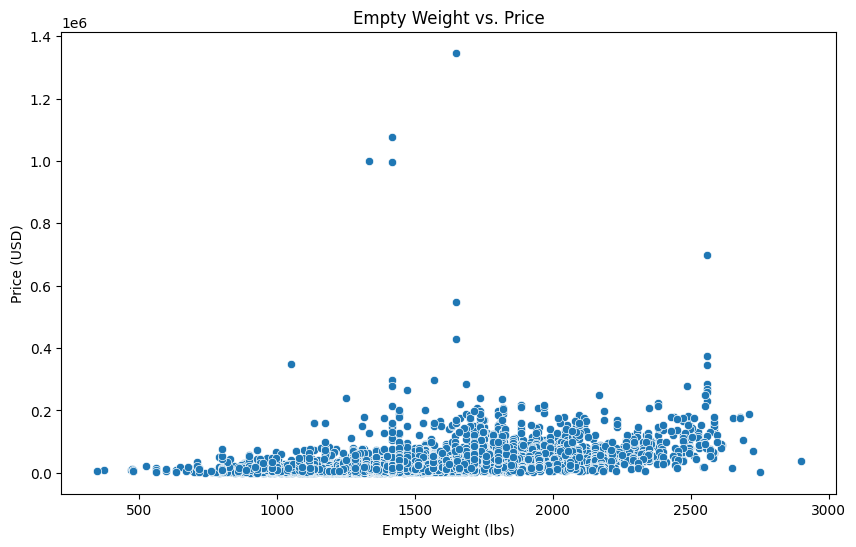

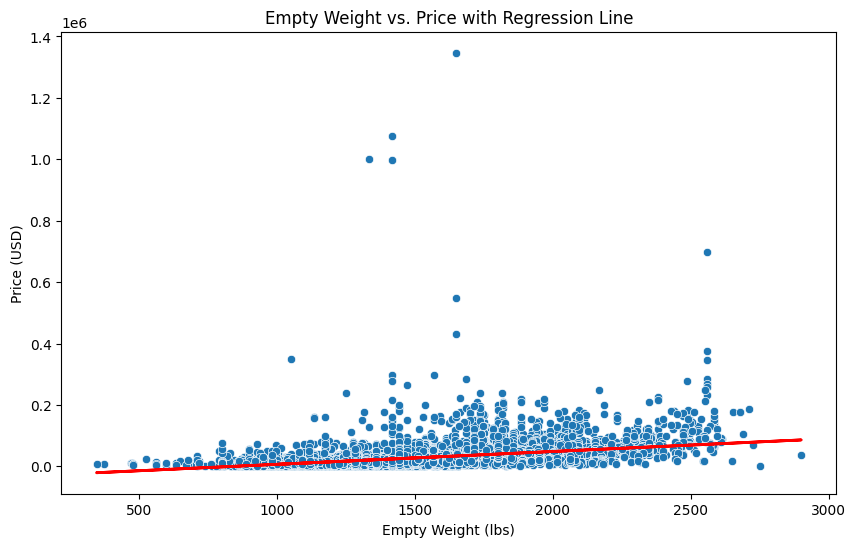

Regresyon katsayısı (slope): 41.81730125300501
Intercept: -35292.66930937629


In [1045]:
correlation, p_value = pearsonr(df['empty_weight'], df['price'])
print(f"Korelasyon katsayısı: {correlation}, P-değeri: {p_value}")

# Scatter plot ile görselleştirme
plt.figure(figsize=(10, 6))
sns.scatterplot(x='empty_weight', y='price', data=df)
plt.title('Empty Weight vs. Price')
plt.xlabel('Empty Weight (lbs)')
plt.ylabel('Price (USD)')
plt.show()

# Regresyon analizi
X = df[['empty_weight']].values
y = df['price'].values
reg = LinearRegression().fit(X, y)
predictions = reg.predict(X)

# Regresyon sonuçlarını görselleştirme
plt.figure(figsize=(10, 6))
sns.scatterplot(x='empty_weight', y='price', data=df)
plt.plot(df['empty_weight'], predictions, color='red', linewidth=2)
plt.title('Empty Weight vs. Price with Regression Line')
plt.xlabel('Empty Weight (lbs)')
plt.ylabel('Price (USD)')
plt.show()

# Regresyon katsayısı ve intercept
print(f"Regresyon katsayısı (slope): {reg.coef_[0]}")
print(f"Intercept: {reg.intercept_}")

R^2 değeri: 0.22408698880942146


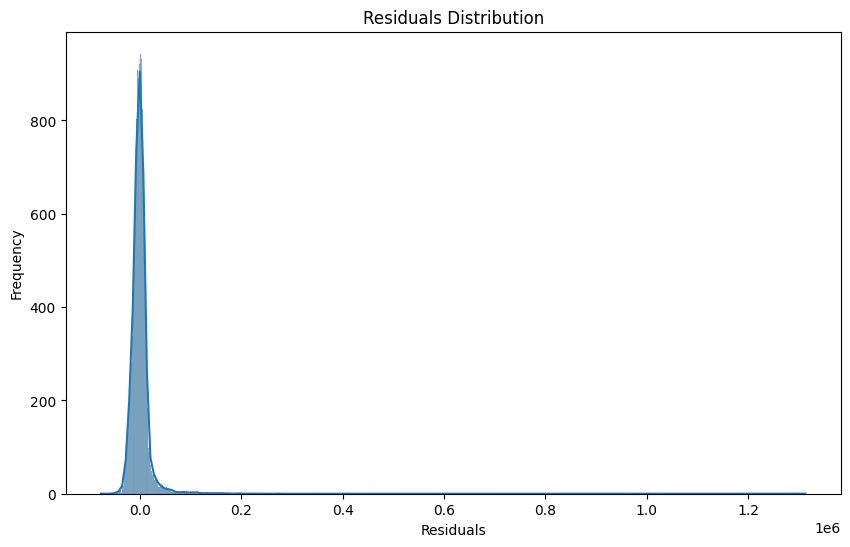

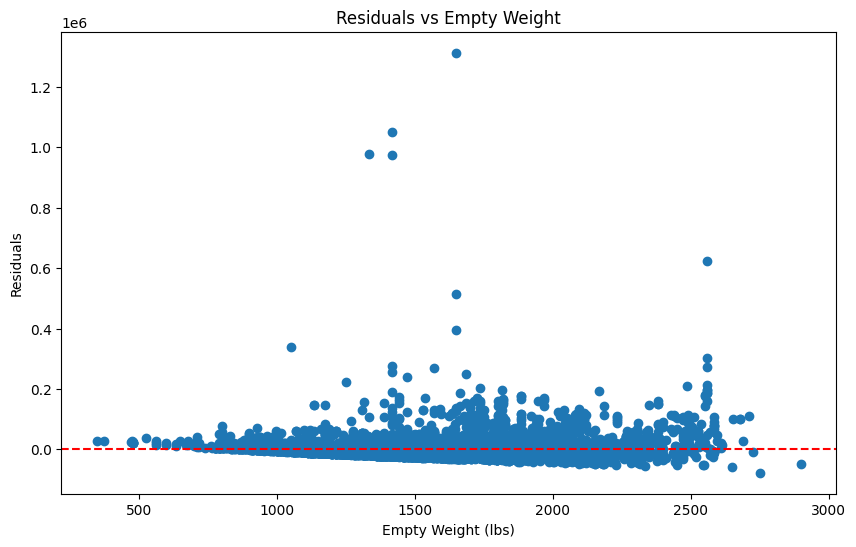

In [1046]:
r_squared = reg.score(X, y)
print(f"R^2 değeri: {r_squared}")

# Kalıntı analizi
residuals = y - predictions
plt.figure(figsize=(10, 6))
sns.histplot(residuals, kde=True)
plt.title('Residuals Distribution')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

# Kalıntıların scatter plot'u
plt.figure(figsize=(10, 6))
plt.scatter(df['empty_weight'], residuals)
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals vs Empty Weight')
plt.xlabel('Empty Weight (lbs)')
plt.ylabel('Residuals')
plt.show()

**Zayıf İlişki: R² değeri 0.198, bağımsız değişken (boş ağırlık) ile bağımlı değişken (fiyat) arasındaki ilişkinin nispeten zayıf olduğunu gösterir. Bu, boş ağırlığın fiyatı belirlemede önemli bir faktör olduğunu, ancak tek başına yeterli olmadığını gösterir.**

R² değeri: 0.252213906218108
Regresyon katsayıları: [  35.2867132     3.56855161 -411.48626268]
Intercept: -29497.32762200816


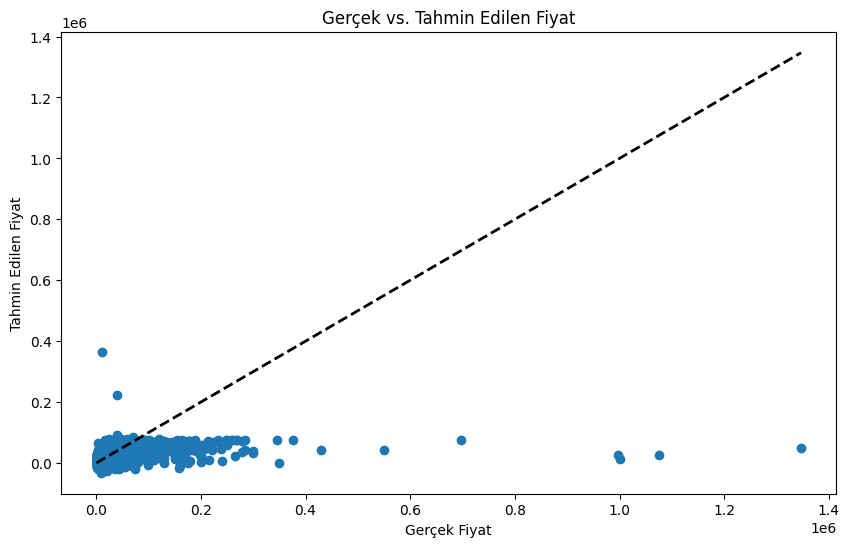

In [1047]:
X = df[['empty_weight', 'engine_size', 'age']]
y = df['price']
reg = LinearRegression().fit(X, y)
predictions = reg.predict(X)

# R² değeri
r_squared = reg.score(X, y)
print(f"R² değeri: {r_squared}")

# Regresyon katsayıları ve intercept
print(f"Regresyon katsayıları: {reg.coef_}")
print(f"Intercept: {reg.intercept_}")

# Modelin tahminlerini görselleştirme
plt.figure(figsize=(10, 6))
plt.scatter(df['price'], predictions)
plt.plot([df['price'].min(), df['price'].max()], [df['price'].min(), df['price'].max()], 'k--', lw=2)
plt.xlabel('Gerçek Fiyat')
plt.ylabel('Tahmin Edilen Fiyat')
plt.title('Gerçek vs. Tahmin Edilen Fiyat')
plt.show()

**Bu, bağımsız değişkenlerin (empty_weight, engine_power ve age) price (fiyat) değişkenindeki varyansın yaklaşık %23.3'ünü açıkladığını gösterir. Önceki modele göre daha yüksek bir R² değerine sahipsiniz, bu da modelin daha fazla varyansı açıklayabildiğini ve eklenen değişkenlerin faydalı olduğunu gösterir. Ancak, hala açıklanamayan %76.7'lik bir varyans bulunmakta, bu da fiyatı etkileyen başka önemli faktörlerin de olduğunu gösterir.**

R² değeri: 0.3992480334009729
Regresyon katsayıları: [  10.45430844  215.38479976   -1.68425678 -317.30746502]
Intercept: -11644.615795678103


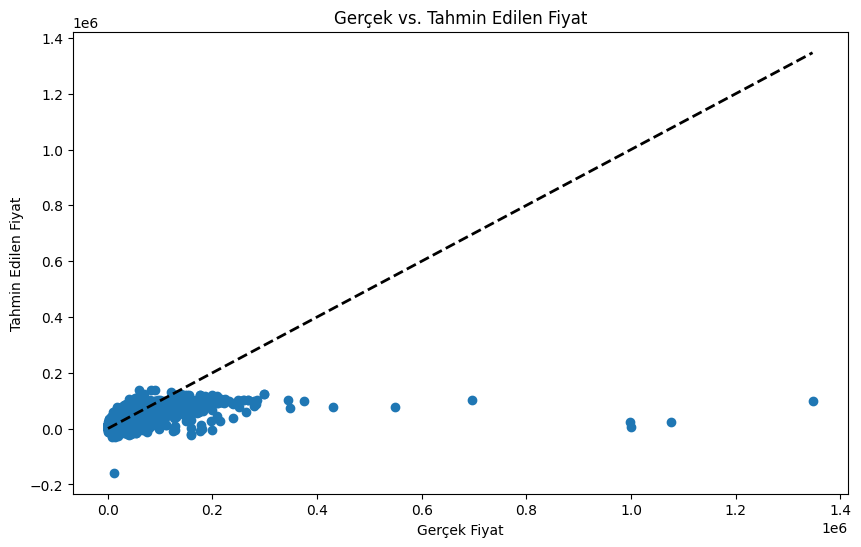

In [1048]:
X = df[['empty_weight', 'power_kW', 'engine_size', 'age']]
y = df['price']
reg = LinearRegression().fit(X, y)
predictions = reg.predict(X)

# R² değeri
r_squared = reg.score(X, y)
print(f"R² değeri: {r_squared}")

# Regresyon katsayıları ve intercept
print(f"Regresyon katsayıları: {reg.coef_}")
print(f"Intercept: {reg.intercept_}")

# Modelin tahminlerini görselleştirme
plt.figure(figsize=(10, 6))
plt.scatter(df['price'], predictions)
plt.plot([df['price'].min(), df['price'].max()], [df['price'].min(), df['price'].max()], 'k--', lw=2)
plt.xlabel('Gerçek Fiyat')
plt.ylabel('Tahmin Edilen Fiyat')
plt.title('Gerçek vs. Tahmin Edilen Fiyat')
plt.show()

**Conclusion: With an R² value of approximately 40%, it would be appropriate to include the empty_weight column in our modeling study.**

# 6. Engine Size

In [1049]:
df['engine_size'].describe()

count    25827.000000
mean      1738.171177
std       1076.231807
min          0.000000
25%       1248.000000
50%       1595.000000
75%       1984.000000
max      99900.000000
Name: engine_size, dtype: float64

(0.0, 8000.0)

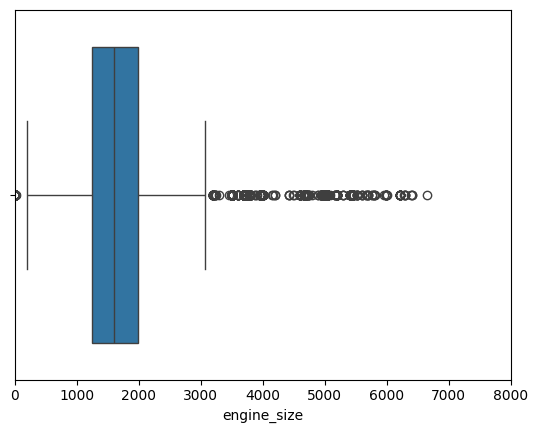

In [1050]:
sns.boxplot(x=df['engine_size'])
plt.xlim(0, 8000)  # x ekseni aralığını istediğiniz gibi ayarlayabilirsiniz

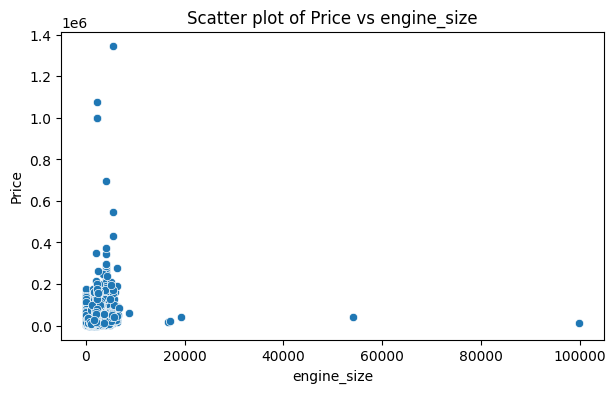

In [1051]:
scatter_plot_with_price(df,'engine_size')

In [1052]:
df['engine_size'].value_counts()

engine_size
1598.0     2088
999.0      2004
1969.0     1065
1461.0     1056
1998.0     1012
1199.0      917
998.0       908
1498.0      730
1997.0      634
1968.0      615
1332.0      523
1984.0      444
1798.0      435
898.0       405
1499.0      403
1242.0      390
1560.0      375
1197.0      374
1995.0      353
1991.0      350
1248.0      311
1368.0      305
1600.0      264
5038.0      264
0.0         246
2143.0      245
1364.0      226
3982.0      202
1950.0      199
1591.0      198
1956.0      198
1500.0      192
1395.0      171
2000.0      171
3498.0      167
2435.0      162
1796.0      159
1987.0      157
1198.0      152
1398.0      147
2996.0      145
1149.0      145
1490.0      143
1497.0      141
1200.0      136
3696.0      135
1794.0      134
1999.0      128
1496.0      126
1618.0      123
2261.0      123
1482.0      119
2925.0      117
1595.0      114
1587.0      113
875.0       112
2987.0      105
1580.0      104
1333.0      103
1.0          99
1582.0       93
1000.0      

In [1053]:
df.groupby('price')['engine_size'].value_counts()

price      engine_size
490.0      1390.0         1
500.0      1598.0         1
           1597.0         1
590.0      1497.0         1
600.0      1598.0         2
                         ..
696900.0   3982.0         1
998000.0   2330.0         1
999999.0   2316.0         1
1075900.0  2330.0         1
1346900.0  5409.0         1
Name: count, Length: 17204, dtype: int64

In [1054]:
upper_lower_whisker(df,'engine_size')

(3088.0, 144.0)

In [1055]:
df[df['engine_size'] < upper_lower_whisker(df,'engine_size')[1]][['make_model', 'engine_size']]

,make_model,engine_size
0,Dacia,0.0
1,Dacia,0.0
282,Dacia Spring,0.0
283,Dacia Spring,0.0
284,Dacia Spring,0.0
285,Dacia Spring,0.0
286,Dacia Spring,0.0
287,Dacia Spring,0.0
288,Dacia Spring,0.0
316,Fiat 500,0.0


In [1056]:
df[df['engine_size'] > upper_lower_whisker(df,'engine_size')[0]][['make_model', 'engine_size']]

,make_model,engine_size
4,Dacia Dokker,16597.0
607,Ford Explorer,3300.0
608,Ford F 150,3490.0
609,Ford F 150 V6,3496.0
610,Ford F 150 V6,3496.0
...,...,...
26847,Ford V8,5300.0
26848,Ford V8,5300.0
26849,Ford V8,5300.0
26850,Ford Roadster,5700.0


In [1057]:
df[df['engine_size'] == 0][['make_model', 'engine_size']]

,make_model,engine_size
0,Dacia,0.0
1,Dacia,0.0
282,Dacia Spring,0.0
283,Dacia Spring,0.0
284,Dacia Spring,0.0
285,Dacia Spring,0.0
286,Dacia Spring,0.0
287,Dacia Spring,0.0
288,Dacia Spring,0.0
316,Fiat 500,0.0


In [1058]:
df[df['engine_size'] == 0][['make_model', 'fuel_type']].values

array([['Dacia ', 'Electric'],
       ['Dacia ', 'Electric'],
       ['Dacia Spring', 'Electric'],
       ['Dacia Spring', 'Electric'],
       ['Dacia Spring', 'Electric'],
       ['Dacia Spring', 'Electric'],
       ['Dacia Spring', 'Electric'],
       ['Dacia Spring', 'Electric'],
       ['Dacia Spring', 'Electric'],
       ['Fiat 500', 'Electric'],
       ['Fiat 500', 'Electric'],
       ['Fiat 500', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
       ['Fiat 500e', 'Electric'],
  

In [1059]:
df[df['make_model'] == 'Nissan 280 ZX'][['engine_size']]

,engine_size
26451,2800.0
26461,0.0


In [1060]:
n280 = df[df['make_model'] == 'Nissan 280 ZX']
max_engine_size_excluding_26461 = n280[n280.index != 26461]['engine_size'].max()
df.at[26461, 'engine_size'] = round(max_engine_size_excluding_26461)

In [1061]:
df[df['make_model'] == 'Dacia Spring'][['make_model', 'engine_size']]

,make_model,engine_size
280,Dacia Spring,1693.0
281,Dacia Spring,1693.0
282,Dacia Spring,0.0
283,Dacia Spring,0.0
284,Dacia Spring,0.0
285,Dacia Spring,0.0
286,Dacia Spring,0.0
287,Dacia Spring,0.0
288,Dacia Spring,0.0
3122,Dacia Spring,1343.0


In [1062]:
df[df['make_model'] == 'Dacia Spring'][['engine_size', 'fuel_type']]

,engine_size,fuel_type
280,1693.0,Electric
281,1693.0,Electric
282,0.0,Electric
283,0.0,Electric
284,0.0,Electric
285,0.0,Electric
286,0.0,Electric
287,0.0,Electric
288,0.0,Electric
3122,1343.0,Electric


In [1063]:
df.loc[df['make_model'] == 'Dacia Spring', 'engine_size'] = 0

In [1064]:
df[df['make_model'] == 'Volvo C70'][['engine_size', 'fuel_type']]

,engine_size,fuel_type
21151,2521.0,Benzine
21152,1984.0,Diesel
21153,1984.0,Diesel
21154,1984.0,Diesel
21155,1984.0,Diesel
21156,1984.0,Diesel
21157,1984.0,Diesel
21779,1984.0,Diesel
21780,1984.0,Diesel
21781,1984.0,Diesel


In [1065]:
df[(df['make_model'] == 'Volvo C70') & (df['engine_size'] == 0)]

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,power_kW,fuel_consumption_comb,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras
25270,Volvo C70,6000.0,Convertible,Used,2.0,No,267733.0,Automatic,Benzine,Grey,...,134.684211,9.71612,Netherlands,20.0,no,Inefficient,Enhanced,Advanced,Basic,1


In [1066]:
df[(df['make_model'] == 'Opel Corsa') & (df['engine_size'] == 0)]

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,power_kW,fuel_consumption_comb,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras
1642,Opel Corsa,27988.0,Compact,Demonstration,5.0,No,35.0,Automatic,Electric,Black,...,100.000000,3.447727,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,3
1645,Opel Corsa,27988.0,Compact,Demonstration,5.0,No,35.0,Automatic,Electric,Black,...,100.000000,3.447727,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,3
1647,Opel Corsa,27988.0,Compact,Demonstration,5.0,No,35.0,Automatic,Electric,Grey,...,100.000000,3.447727,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,3
1655,Opel Corsa,25488.0,Compact,Demonstration,5.0,No,45.0,Automatic,Electric,White,...,100.000000,3.447727,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,2
1656,Opel Corsa,27988.0,Compact,Demonstration,5.0,No,35.0,Automatic,Electric,Black,...,100.000000,3.447727,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,3
1658,Opel Corsa,25488.0,Compact,Demonstration,5.0,No,45.0,Automatic,Electric,White,...,100.000000,3.447727,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,2
1659,Opel Corsa,27988.0,Compact,Demonstration,5.0,No,35.0,Automatic,Electric,Grey,...,100.000000,3.447727,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,3
1664,Opel Corsa,27588.0,Compact,Demonstration,5.0,No,45.0,Automatic,Electric,Orange,...,100.000000,3.447727,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,3
1667,Opel Corsa,27988.0,Compact,Demonstration,5.0,No,35.0,Automatic,Electric,Grey,...,100.000000,3.447727,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,3
1668,Opel Corsa,27988.0,Compact,Demonstration,5.0,No,35.0,Automatic,Electric,Grey,...,100.000000,3.447727,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,3


In [1067]:
df[(df['make_model'] == 'Ford Mustang') & (df['engine_size'] == 0)]

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,power_kW,fuel_consumption_comb,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras
26674,Ford Mustang,49950.0,Convertible,Used,2.0,No,12875.0,Manual,Benzine,Silver,...,211.00,10.83,Netherlands,54.0,no,Inefficient,Enhanced,Basic,Advanced,1
26702,Ford Mustang,18900.0,Convertible,Used,2.0,No,58608.0,Manual,Benzine,Blue,...,182.75,10.83,Netherlands,55.0,no,Inefficient,Basic,Basic,Advanced,1


[engine_size outliers]

{'https://www.webuyanycar.com/guides/car-ownership/car-engine-sizes/',

https://www.cjponyparts.com/resources/engine-size-chart,

https://www.btgmaslak.com/motor-hacmi-silindir-hacmi-nedir-nasil-hesaplanir/#:~:text=Bir%20ara%C3%A7taki%20motor%20hacmi%20ne,aras%C4%B1ndaki%20motorlar%20ihtiyac%C4%B1n%C4%B1z%C4%B1%20kar%C5%9F%C4%B1lamaya%20yetecektir.}

In [1068]:
df[df['engine_size'] > 6000][['make_model', 'age', 'fuel_type', 'engine_size']]

,make_model,age,fuel_type,engine_size
4,Dacia Dokker,0.0,LPG,16597.0
8318,Dacia Sandero,3.0,Benzine,99900.0
19356,Renault Megane,7.0,Benzine,16998.0
19922,Mercedes-Benz C 63 AMG,8.0,Benzine,6208.0
21389,Mercedes-Benz SLS Roadster,10.0,Benzine,6208.0
21945,Mercedes-Benz SL 63 AMG,11.0,Benzine,6209.0
21949,Mercedes-Benz SLR Roadster,11.0,Benzine,6208.0
22529,Mercedes-Benz E 63 AMG,12.0,Benzine,6208.0
22530,Mercedes-Benz E 63 AMG,12.0,Benzine,6208.0
22536,Mercedes-Benz ML 63 AMG,12.0,Benzine,6208.0


In [1069]:
indices_to_zero = df[(df['cylinders'] == 1) & (df['fuel_type'] != 'Electric')].index

# Bu indeksleri sıfıra çevirme
df.loc[indices_to_zero, 'index'] = 0

In [1070]:
df[df['make_model'] == 'Dacia Dokker'][['engine_size']]

,engine_size
4,16597.0
3034,1500.0
5764,1598.0
5765,1332.0
8118,1598.0
8119,1598.0
8120,1598.0
8121,1333.0
8122,1598.0
8123,1461.0


In [1071]:
d_dokker = df[df['make_model'] == 'Dacia Dokker']
mean_engine_size_excluding_4 = d_dokker[d_dokker.index != 4]['engine_size'].mean()
df.at[4, 'engine_size'] = round(mean_engine_size_excluding_4)

In [1072]:
df[df['make_model'] == 'Renault Megane'][['engine_size']]

,engine_size
2195,1598.0
2196,1332.0
2197,1332.0
2198,1332.0
2199,1332.0
...,...
25775,1998.0
25861,1599.0
25862,1998.0
25863,1598.0


In [1073]:
df[df['make_model'] == 'Dacia Sandero'][['engine_size']]

,engine_size
153,999.0
154,999.0
155,999.0
156,999.0
157,999.0
...,...
22928,1149.0
22929,1390.0
22930,1390.0
23303,1390.0


In [1074]:
df[df['make_model'] == 'Mercedes-Benz SL 320'][['engine_size']]

,engine_size
25310,19194.0
26112,3200.0
26113,3199.0


In [1075]:
m320 = df[df['make_model'] == 'Mercedes-Benz SL 320']
mean_engine_size_excluding_25310 = m320[m320.index != 25310]['engine_size'].mode()[1]
df.at[25310, 'engine_size'] = round(mean_engine_size_excluding_25310)

In [1076]:
df[df['make_model'] == 'Ford Mustang'][['engine_size']]

,engine_size
741,5038.0
742,5038.0
743,5162.0
744,5038.0
745,5038.0
746,5038.0
747,5038.0
748,5038.0
749,5038.0
750,5038.0


In [1077]:
df[df['engine_size'] < upper_lower_whisker(df, 'engine_size')[1]][['engine_size']].value_counts()

engine_size
0.0            275
1.0             99
2.0              9
4.0              2
5.0              2
20.0             1
Name: count, dtype: int64

In [1078]:
df.loc[(df['engine_size'] <= 20), 'engine_size'] = 1000

In [1079]:
df.drop(index=[0, 1,316, 341, 360, 3033, 907,910, 911, 912, 1306, 1599, 1864, 3723, 3724, 3734,
                                      3741, 3742, 8318, 1642,  1645,  1647,  1655,  1656,  1658,  1659,  1664,  1667,  1668,
                                      1677,  1678,  4370, 5451, 5549, 5698, 9897, 17880, 19356, 19922, 21389, 21945,
                                      21949, 22529, 22530, 22536, 22541, 22986, 22994, 22995, 23332, 23367, 23371, 23383,
                                      23733, 26653, 26675, 26764, 26778, 26803, 26807, 26837, 26674, 26702, 4757, 9897,
                                      7166, 7709, 7713, 11225, 11226, 12372, 13524, 14401, 14402, 15992, 16324, 16884,
                                      17880, 19568, 23864, 25270, 26470, 26674, 26698, 26702], inplace=True)


In [1080]:
df[df['engine_size'] == 0][['make_model', 'fuel_type']]

,make_model,fuel_type


In [1081]:
a = df.engine_size.value_counts()
a.sort_index()

engine_size
200.0        1
289.0        1
300.0        1
332.0        1
498.0        1
499.0        5
500.0        2
549.0        1
600.0        1
650.0        2
652.0        2
698.0        1
750.0        2
767.0        5
839.0        2
843.0       10
847.0        1
850.0        5
875.0      112
898.0      405
899.0       19
900.0       47
903.0        4
964.0        3
973.0        2
982.0        1
987.0        2
988.0        1
996.0        2
997.0        1
998.0      908
999.0     2004
1000.0     425
1084.0      38
1086.0      14
1089.0       1
1100.0      13
1108.0      10
1116.0       2
1119.0       1
1120.0       4
1122.0       1
1124.0      10
1149.0     145
1150.0       2
1158.0       4
1194.0       2
1196.0       1
1197.0     374
1198.0     152
1199.0     917
1200.0     136
1221.0       2
1229.0      64
1235.0       1
1240.0      19
1241.0       1
1242.0     390
1245.0       1
1248.0     311
1251.0       1
1270.0       1
1280.0       1
1281.0       1
1289.0       1
1290.0       

# 15. Num of Extras

In [1082]:
df['num_of_extras'].describe()

count    25746.000000
mean         4.572167
std          3.639816
min          1.000000
25%          1.000000
50%          4.000000
75%          7.000000
max         26.000000
Name: num_of_extras, dtype: float64

In [1083]:
df['num_of_extras'].value_counts()

num_of_extras
1     6625
2     3349
3     2882
4     2399
5     2089
6     1627
7     1491
8     1163
9     1043
10     896
11     652
12     542
13     358
14     266
15     175
16      96
17      56
18      24
19      10
20       2
26       1
Name: count, dtype: int64

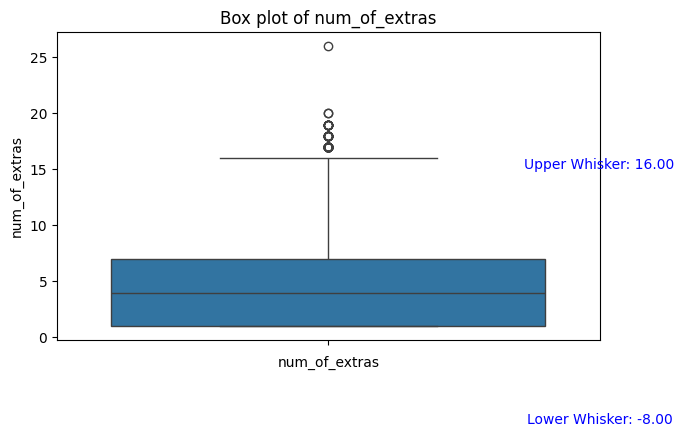

In [1084]:
box_plot_column(df,'num_of_extras')

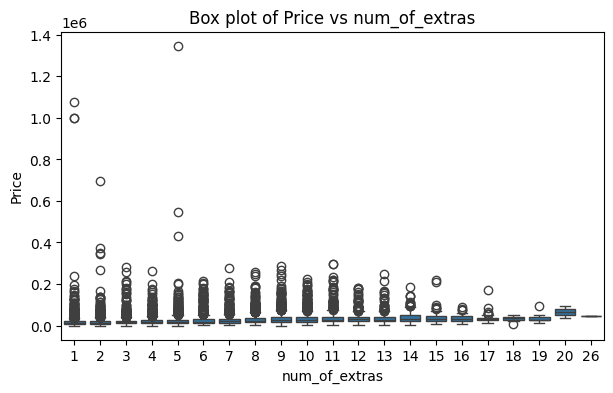

In [1085]:
box_plot_with_price(df,'num_of_extras')

In [1086]:
upper_lower_whisker(df,'num_of_extras')

(16.0, -8.0)

In [1087]:
df[df['num_of_extras'] > upper_lower_whisker(df,'num_of_extras')[0]][['make_model','num_of_extras']]

,make_model,num_of_extras
650,Ford Focus,17
652,Ford Focus,17
655,Ford Focus,17
657,Ford Focus,17
660,Ford Focus,17
1202,Mercedes-Benz C 300,17
2303,SEAT Ateca,17
3456,Ford Focus,18
3485,Ford Focus,17
3493,Ford Kuga,17


In [1088]:
df[df['num_of_extras'] < upper_lower_whisker(df,'num_of_extras')[1]]

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,fuel_consumption_comb,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index


In [1089]:
df[df['num_of_extras'] > 17]

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,fuel_consumption_comb,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index
3456,Ford Focus,28950.0,Station wagon,Demonstration,5.0,No,7500.0,Automatic,Benzine,Grey,...,5.300000,Germany,1.0,no,Inefficient,Advanced,Advanced,Advanced,18,NaN
3508,Ford Kuga,38490.0,Off-Road/Pick-up,Used,5.0,Yes,7232.0,Automatic,Electric,Black,...,1.400000,Germany,1.0,yes,Efficient,Advanced,Advanced,Advanced,18,NaN
3511,Ford Kuga,38290.0,Off-Road/Pick-up,Used,5.0,Yes,20278.0,Automatic,Electric,Black,...,1.400000,Germany,1.0,yes,Efficient,Advanced,Advanced,Advanced,18,NaN
3525,Ford Kuga,28990.0,Off-Road/Pick-up,Used,5.0,Yes,17806.0,Manual,Benzine,Blue,...,5.500000,Germany,1.0,yes,Efficient,Advanced,Advanced,Advanced,19,NaN
3530,Ford Kuga,28460.0,Off-Road/Pick-up,Used,5.0,Yes,11235.0,Manual,Benzine,Grey,...,5.500000,Germany,1.0,yes,Efficient,Advanced,Advanced,Advanced,19,NaN
3533,Ford Kuga,28250.0,Off-Road/Pick-up,Used,5.0,Yes,15699.0,Manual,Benzine,Grey,...,5.500000,Germany,1.0,yes,Efficient,Advanced,Advanced,Advanced,19,NaN
3534,Ford Kuga,37950.0,Off-Road/Pick-up,Used,5.0,Yes,28180.0,Automatic,Electric,Black,...,1.200000,Germany,1.0,yes,Efficient,Advanced,Advanced,Advanced,18,NaN
3536,Ford Kuga,28250.0,Off-Road/Pick-up,Used,5.0,Yes,12326.0,Manual,Benzine,Grey,...,5.500000,Germany,1.0,yes,Efficient,Advanced,Advanced,Advanced,19,NaN
3539,Ford Kuga,38450.0,Off-Road/Pick-up,Used,5.0,Yes,21728.0,Automatic,Electric,Black,...,1.200000,Germany,1.0,yes,Efficient,Advanced,Advanced,Advanced,18,NaN
3557,Ford Mondeo,42980.0,Station wagon,Used,5.0,No,12790.0,Automatic,Diesel,Grey,...,5.300000,Germany,1.0,no,Efficient,Advanced,Advanced,Advanced,19,NaN


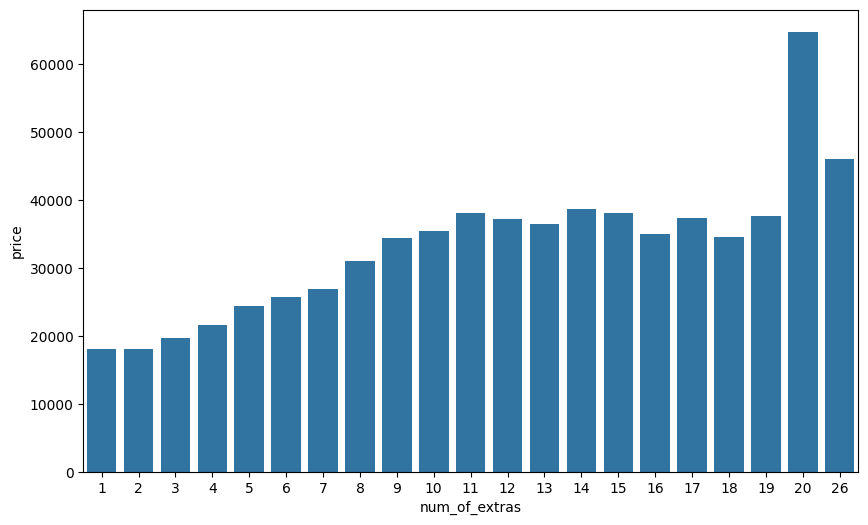

In [1090]:
mean_prices = df.groupby('num_of_extras')['price'].mean().reset_index()

plt.figure(figsize=(10, 6))
sns.barplot(x='num_of_extras', y='price', data=mean_prices)
#plt.title('Ortalama Fiyatın Ekstra Özellik Sayısına Göre Değişimi')
#plt.xlabel('Ekstra Özellik Sayısı')
#plt.ylabel('Ortalama Fiyat')
plt.show()

In [1091]:
correlation = df['num_of_extras'].corr(df['price'])

print("Pearson Korelasyon Katsayısı:", correlation)

Pearson Korelasyon Katsayısı: 0.24669979139301956


**The fact that the Pearson correlation coefficient is 25% indicates that there is a weak positive linear relationship between these two variables. This shows that there is a direct relationship between the number of extra features and price, but the relationship is not very strong. This means that the price tends to increase as the number of extra features increases, but this increase is not significant or high.**

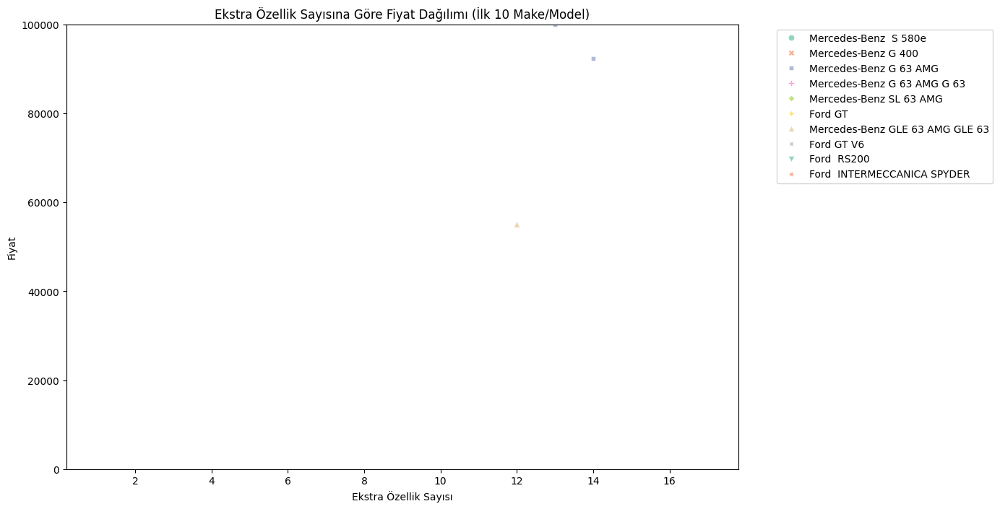

In [1092]:
top_make_models = df.groupby('make_model').agg({'price': 'mean'}).reset_index().sort_values(by='price', ascending=False).head(10)

# İlk 10 make_model için filtreleme
filtered_df = df[df['make_model'].isin(top_make_models['make_model'])]

# Scatter plot oluşturma
plt.figure(figsize=(12, 8))
size = 100
sns.scatterplot(x='num_of_extras', y='price', hue='make_model', style='make_model', palette='Set2', data=filtered_df, alpha=0.7)
plt.title('Ekstra Özellik Sayısına Göre Fiyat Dağılımı (İlk 10 Make/Model)')
plt.xlabel('Ekstra Özellik Sayısı')
plt.ylabel('Fiyat')
plt.ylim(0, 100000)
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()

In [1093]:
result = df.groupby('age').agg(
    mean_num=('num_of_extras', 'mean'),
    max_num=('num_of_extras', 'max')
    
).reset_index()

sorted_result = result.sort_values(by='max_num', ascending=False)
sorted_result.sort_values(by='max_num').head(100)

,age,mean_num,max_num
63,63.0,1.000000,1
66,66.0,1.000000,1
64,64.0,1.000000,1
62,62.0,1.000000,1
77,93.0,1.000000,1
72,76.0,1.000000,1
75,90.0,1.000000,1
76,92.0,1.000000,1
71,72.0,1.000000,1
41,41.0,1.571429,3


In [1094]:
# Replace 1 with np.nan in the num_of_extras column
df.loc[df['num_of_extras'] == 1, 'num_of_extras'] = np.nan

In [1095]:
df['num_of_extras'].isna().sum()

6625

In [1096]:
df.isna().sum()

make_model                         0
price                              0
body_type                          0
type                               0
doors                              0
warranty                           0
mileage                            0
gearbox                            0
fuel_type                          0
colour                             0
paint                              0
seller                             0
seats                              0
engine_size                        0
gears                              0
co2_emissions                      0
drivetrain                         0
cylinders                          0
empty_weight                       0
service_history                    0
non_smoker                         0
emission_sticker                   0
upholstery_color                   0
upholstery                         0
available                          0
taxi_rental                        0
power_kW                           0
f

In [1097]:
# Define a function to compute the mode, handling cases where mode might be empty
def mode_or_none(series):
    mode_series = series.mode()
    return mode_series.iloc[0] if not mode_series.empty else None

# Calculate the mode of num_of_extras for each age group
mode_num_by_age = df.groupby('age')['num_of_extras'].transform(mode_or_none)

# Fill NaN values in num_of_extras with the mode values
df['num_of_extras'] = df['num_of_extras'].fillna(mode_num_by_age)                                            

In [1098]:
df['num_of_extras'].isna().sum()

18

In [1099]:
def fill_na(df, column, method='ffill'):

    if method not in ['ffill', 'bfill']:
        raise ValueError("Method must be either 'ffill' or 'bfill'.")

    df[column] = df[column].fillna(method=method)
    return df

In [1100]:
# Fill NaN values using forward fill
df_filled = fill_na(df, 'num_of_extras', method='ffill')

# Fill NaN values using backward fill (for demonstration)
df_filled_bfill = fill_na(df, 'num_of_extras', method='bfill')

In [1101]:
df['num_of_extras'].isna().sum()

0

In [1102]:
df[['num_of_extras','age']]

,num_of_extras,age
2,2.0,0.0
3,3.0,0.0
4,9.0,0.0
5,2.0,0.0
6,2.0,0.0
...,...,...
26851,3.0,92.0
26852,3.0,93.0
26853,5.0,94.0
26854,3.0,122.0


In [1103]:
# Replace 1 with np.nan in the num_of_extras column
df[df['age'] == 0][['age','num_of_extras']]

,age,num_of_extras
2,0.0,2.0
3,0.0,3.0
4,0.0,9.0
5,0.0,2.0
6,0.0,2.0
...,...,...
3028,0.0,6.0
3029,0.0,13.0
3030,0.0,14.0
3031,0.0,14.0


In [1104]:
# Replace 1 with np.nan in the num_of_extras column
df[df['age'] == 0][['age','num_of_extras']].mean()

age              0.000000
num_of_extras    5.874656
dtype: float64

In [1105]:
df[(df['age'] == 0) &(df['num_of_extras'] < 6) ][['make_model','age','num_of_extras']]

,make_model,age,num_of_extras
2,Dacia,0.0,2.0
3,Dacia Break,0.0,3.0
5,Dacia Duster,0.0,2.0
6,Dacia Duster,0.0,2.0
9,Dacia Duster,0.0,3.0
...,...,...,...
2995,Volvo S90,0.0,2.0
3003,Volvo V90,0.0,4.0
3004,Volvo V90,0.0,2.0
3012,Volvo XC40,0.0,2.0


In [1106]:
# Function to get the mode
def get_mode(series):
    mode = series.mode()
    return mode[0] if not mode.empty else np.nan

# Filter data for age == 0 and group by 'age'
result = df.groupby('age').agg(
    mean_num=('num_of_extras', 'mean'),
    max_num=('num_of_extras', 'max'),
    median_num=('num_of_extras', 'median'),
    mode_num=('num_of_extras', get_mode)
).reset_index()

sorted_result = result.sort_values(by='max_num', ascending=False)
sorted_result.sort_values(by='max_num').head(100)

,age,mean_num,max_num,median_num,mode_num
66,66.0,2.000000,2.0,2.0,2.0
74,89.0,3.000000,3.0,3.0,3.0
75,90.0,3.000000,3.0,3.0,3.0
76,92.0,3.000000,3.0,3.0,3.0
77,93.0,3.000000,3.0,3.0,3.0
63,63.0,3.000000,3.0,3.0,3.0
68,68.0,3.000000,3.0,3.0,3.0
79,122.0,3.000000,3.0,3.0,3.0
62,62.0,3.000000,3.0,3.0,3.0
60,60.0,3.000000,3.0,3.0,3.0


In [1107]:
# Replace 1 with np.nan in the num_of_extras column
df.loc[df['age'] == 0, 'num_of_extras'] = np.nan

In [1108]:
df['num_of_extras'].isna().sum()

2904

In [1109]:
# Calculate median of 'score' values for age = 1
median_score_age_1 = df.loc[df['age'] == 1, 'num_of_extras'].median()

# Fill NaN values in 'score' column with the median of age=1 values
df['num_of_extras'] = df['num_of_extras'].fillna(median_score_age_1)

In [1110]:
df['num_of_extras'].isna().sum()

0

# Color

In [1111]:
df.groupby('colour')['price'].describe()

,count,mean,std,min,25%,50%,75%,max
colour,,,,,,,,
Beige,253.0,15579.711462,10514.616072,1100.0,8950.00,14900.0,18990.00,69930.0
Black,6214.0,26315.823624,29243.896985,500.0,12495.00,19990.0,31900.00,1075900.0
Blu,3.0,12583.333333,2453.738644,9750.0,11875.00,14000.0,14000.00,14000.0
Blue,3216.0,23321.017102,31556.324212,490.0,11750.00,17744.5,27449.25,1346900.0
Bronze,66.0,16940.772727,11821.200932,1250.0,9172.50,15890.0,23618.25,82750.0
Brown,454.0,18874.698238,13538.080456,1900.0,12214.25,15900.0,22497.50,159999.0
Gold,68.0,23933.000000,13913.868909,2100.0,13849.00,20490.0,31992.00,59900.0
Green,428.0,24620.841121,27530.910846,800.0,9150.00,17900.0,30622.50,259880.0
Grey,5663.0,24551.066043,22913.036641,600.0,12499.50,19499.0,29320.00,549000.0


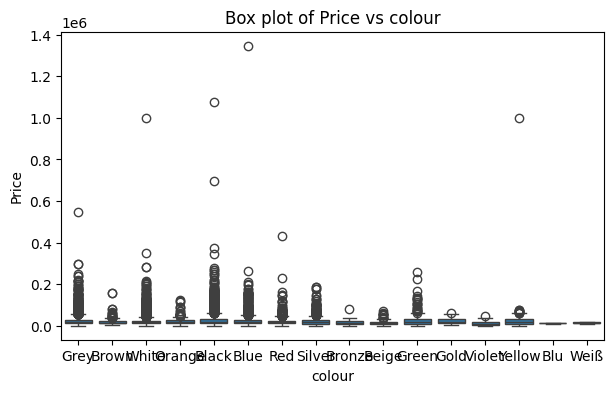

In [1112]:
box_plot_with_price(df,'colour')

In [1113]:
df[df['price'] > 200000 ][['make_model','colour', 'price', 'location_country', 'age', 'mileage']]

,make_model,colour,price,location_country,age,mileage
1151,Mercedes-Benz,Grey,214885.0,Germany,0.0,6900.0
1172,Mercedes-Benz AMG GT,Green,224885.0,Germany,0.0,9900.0
1175,Mercedes-Benz AMG GT,Grey,215550.0,Germany,0.0,3001.0
1178,Mercedes-Benz AMG GT Roadster,Grey,239000.0,Germany,0.0,100.0
1181,Mercedes-Benz AMG GT Roadster,White,283900.0,Austria,0.0,3569.0
1353,Mercedes-Benz G 63 AMG,Black,696900.0,Spain,0.0,100.0
1354,Mercedes-Benz G 63 AMG,Black,344900.0,Spain,0.0,100.0
1355,Mercedes-Benz G 63 AMG,Black,268900.0,Spain,0.0,1800.0
1356,Mercedes-Benz G 63 AMG,Black,248800.0,Germany,0.0,8800.0
1357,Mercedes-Benz G 63 AMG,Green,259880.0,Germany,0.0,9900.0


In [1114]:
df.colour = df.colour.str.replace('Blu', 'Blue')

In [1115]:
df.colour = df.colour.str.replace('Bluee', 'Blue')

In [1116]:
df.colour = df.colour.str.replace('Weiß', 'White')

In [1117]:
df.groupby('colour')['colour'].count().sort_values()

colour
Bronze      66
Gold        68
Violet      95
Yellow     228
Beige      253
Orange     282
Green      428
Brown      454
Silver    1486
Red       2127
Blue      3219
White     5163
Grey      5663
Black     6214
Name: colour, dtype: int64

In [1118]:
df[(df['price'] > 200000)  & (df['colour'] == 'Yellow') ].groupby('colour')[['make_model','price', 'age']].value_counts()


colour  make_model  price     age
Yellow  Ford GT V6  998000.0  4.0    1
Name: count, dtype: int64

K2 test istatistiğini (chi2), p değerini, dereceyi (dof) ve beklenen değerleri (expected) hesaplayacaktır. P değeri, kategorik özelliğinizin fiyata anlamlı bir etkisi olup olmadığını belirlemek için kullanılabilir. Genellikle, p değeri 0.05'ten küçükse (p < 0.05), kategorik özelliğinizin fiyata anlamlı bir etkisi olduğu söylenir.

Dikkat edilmesi gereken bir diğer nokta da, K2 testi sadece kategorik özelliğiniz en az iki kategoriye sahipse ve fiyat değişkeniniz sürekli bir değişken ise uygulanabilir.

In [1119]:
from scipy.stats import chi2_contingency

In [1120]:
ct = pd.crosstab(df['colour'], df['price'])
chi2, p_value, dof, expected = chi2_contingency(ct)
print(chi2, p_value, dof, expected)

67164.46031474078 1.1471507717464275e-09 64987 [[0.00982677 0.01965354 0.00982677 ... 0.00982677 0.00982677 0.00982677]
 [0.24135788 0.48271576 0.24135788 ... 0.24135788 0.24135788 0.24135788]
 [0.12502913 0.25005826 0.12502913 ... 0.12502913 0.12502913 0.12502913]
 ...
 [0.00368989 0.00737979 0.00368989 ... 0.00368989 0.00368989 0.00368989]
 [0.20053601 0.40107201 0.20053601 ... 0.20053601 0.20053601 0.20053601]
 [0.00885574 0.01771149 0.00885574 ... 0.00885574 0.00885574 0.00885574]]


In [1121]:
ct = pd.crosstab(df['make_model'], df['price'])
chi2, p_value, dof, expected = chi2_contingency(ct)
print(chi2, p_value, dof, expected)

4762612.747454853 0.0 3714257 [[7.76819700e-05 1.55363940e-04 7.76819700e-05 ... 7.76819700e-05
  7.76819700e-05 7.76819700e-05]
 [3.88409850e-05 7.76819700e-05 3.88409850e-05 ... 3.88409850e-05
  3.88409850e-05 3.88409850e-05]
 [2.01973122e-03 4.03946244e-03 2.01973122e-03 ... 2.01973122e-03
  2.01973122e-03 2.01973122e-03]
 ...
 [7.37978715e-03 1.47595743e-02 7.37978715e-03 ... 7.37978715e-03
  7.37978715e-03 7.37978715e-03]
 [5.82614775e-04 1.16522955e-03 5.82614775e-04 ... 5.82614775e-04
  5.82614775e-04 5.82614775e-04]
 [4.15598540e-03 8.31197079e-03 4.15598540e-03 ... 4.15598540e-03
  4.15598540e-03 4.15598540e-03]]


# SEATS

In [1122]:
df.seats.unique()

array([ 7.,  5.,  4.,  2.,  8.,  3.,  6.,  9., 17.,  0.,  1.])

In [1123]:
df.groupby('seats')['price'].sum()

seats
0.0         84600.0
1.0        180649.0
2.0      38156805.0
3.0        530344.0
4.0     123482830.0
5.0     427165216.0
6.0        534729.0
7.0      13637469.0
8.0       1466574.0
9.0       1133974.0
17.0       119980.0
Name: price, dtype: float64

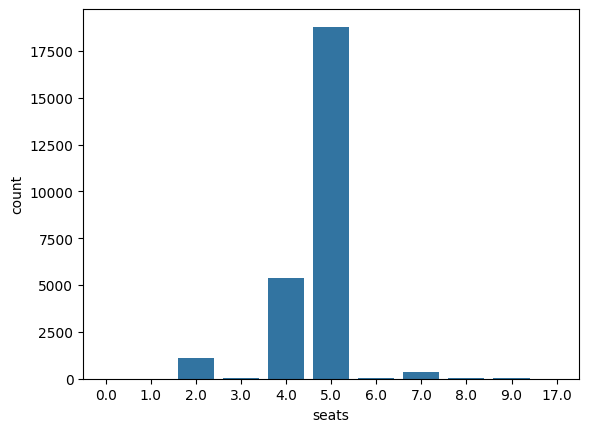

In [1124]:
sns.countplot(data = df, x = 'seats')
plt.show;

In [1125]:
df[df['seats'] == 0.0][['make_model', 'price', 'age']]

,make_model,price,age
7560,SEAT Ibiza,18950.0,2.0
13837,SEAT Ibiza,14700.0,4.0
18175,SEAT Ibiza,10900.0,6.0
19378,Renault Twingo,7750.0,7.0
19398,SEAT Ibiza,9900.0,7.0
19835,Hyundai i30,8900.0,8.0
20382,SEAT Toledo,7650.0,8.0
23220,Skoda Fabia,2900.0,13.0
23576,Skoda Fabia,2950.0,14.0


In [1126]:
indices = df[df['seats'] == 0.0][['make_model', 'price', 'age']].index

# Bu indekslerdeki 'capis' değerlerini 5 olarak güncelleyin
df.loc[indices, 'seats'] = 5

In [1127]:
n = [7563, 13840, 18178, 19381, 19401, 20385, 23223, 23579]
df.loc[n]

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,fuel_consumption_comb,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index
7563,SEAT Ibiza,18980.0,Sedan,Used,4.0,Yes,29980.0,Automatic,Benzine,Red,...,4.900000,Germany,2.0,yes,Efficient,Advanced,Enhanced,Enhanced,3.0,NaN
13840,SEAT Ibiza,13995.0,Compact,Used,5.0,Yes,92771.0,Manual,Benzine,White,...,4.500000,Spain,4.0,no,Efficient,Enhanced,Enhanced,Enhanced,3.0,NaN
18178,SEAT Ibiza,11500.0,Station wagon,Used,5.0,Yes,96000.0,Manual,Benzine,Red,...,4.900000,Spain,6.0,no,Inefficient,Enhanced,Enhanced,Enhanced,2.0,NaN
19381,Renault Twingo,9250.0,Compact,Used,5.0,Yes,20041.0,Manual,Benzine,White,...,4.200000,Netherlands,7.0,yes,Inefficient,Enhanced,Enhanced,Advanced,2.0,NaN
19401,SEAT Ibiza,10990.0,Coupe,Used,3.0,No,10.0,Manual,Benzine,White,...,5.790769,France,7.0,no,Efficient,Advanced,Advanced,Advanced,2.0,NaN
20385,Skoda Fabia,6500.0,Compact,Used,5.0,Yes,170000.0,Manual,Benzine,Grey,...,5.500000,Spain,8.0,no,Efficient,Enhanced,Basic,Advanced,2.0,NaN
23223,Skoda Superb,5980.0,Sedan,Used,4.0,Yes,201700.0,Manual,Benzine,Grey,...,7.600000,Germany,13.0,no,Efficient,Advanced,Advanced,Advanced,11.0,NaN
23579,Skoda Superb,5500.0,Sedan,Used,5.0,No,246600.0,Automatic,Diesel,Red,...,6.350000,Germany,14.0,yes,Efficient,Advanced,Advanced,Advanced,12.0,NaN


In [1128]:
df[df['make_model'] == 'Skoda Fabia'][['make_model', 'age', 'seats']]

,make_model,age,seats
2444,Skoda Fabia,0.0,5.0
2445,Skoda Fabia,0.0,5.0
2446,Skoda Fabia,0.0,5.0
2447,Skoda Fabia,0.0,5.0
2448,Skoda Fabia,0.0,5.0
2449,Skoda Fabia,0.0,5.0
2450,Skoda Fabia,0.0,5.0
2451,Skoda Fabia,0.0,5.0
2452,Skoda Fabia,0.0,5.0
2453,Skoda Fabia,0.0,5.0


In [1129]:
df[df['make_model'] == 'SEAT Ibiza'][['make_model', 'age', 'seats']]

,make_model,age,seats
2316,SEAT Ibiza,0.0,5.0
2317,SEAT Ibiza,0.0,5.0
2318,SEAT Ibiza,0.0,5.0
2319,SEAT Ibiza,0.0,5.0
2320,SEAT Ibiza,0.0,5.0
2321,SEAT Ibiza,0.0,5.0
2322,SEAT Ibiza,0.0,5.0
2323,SEAT Ibiza,0.0,5.0
2324,SEAT Ibiza,0.0,5.0
2325,SEAT Ibiza,0.0,5.0


In [1130]:
df[df['make_model'] == 'Renault Twingo'][['make_model', 'age', 'seats']]

,make_model,age,seats
2226,Renault Twingo,0.0,5.0
2227,Renault Twingo,0.0,5.0
2228,Renault Twingo,0.0,5.0
4884,Renault Twingo,1.0,5.0
4885,Renault Twingo,1.0,5.0
4886,Renault Twingo,1.0,4.0
4887,Renault Twingo,1.0,4.0
4888,Renault Twingo,1.0,4.0
4889,Renault Twingo,1.0,4.0
4890,Renault Twingo,1.0,4.0


In [1131]:
df[df['seats'] == 1.0][['make_model', 'price', 'age', 'power_kW', 'fuel_type']]

,make_model,price,age,power_kW,fuel_type
13531,Renault,6500.0,4.0,1.0,Electric
18138,Renault Twizy,7950.0,6.0,59.0,Electric
19386,Renault Twizy,3999.0,7.0,8.0,Electric
22666,Peugeot 308,10750.0,12.0,100.0,Diesel
26339,Fiat 131,24500.0,34.0,109.0,Benzine
26469,Volvo 240,126950.0,40.0,246.0,Benzine


In [1132]:
df.duplicated().sum()

4

In [1133]:
df.drop_duplicates(inplace = True)

In [1134]:
df.duplicated().sum()

0

In [1135]:
df[df['seats'] == 2.0][['make_model', 'price', 'age']].value_counts()

make_model            price    age 
Toyota MR 2           12800.0  19.0    10
Nissan 370Z           30864.0  4.0      7
Nissan 350Z Roadster  15900.0  15.0     6
Nissan 370Z           30818.0  4.0      6
Fiat 124 Spider       21399.0  3.0      6
                                       ..
Nissan 350Z           18100.0  19.0     1
                      18500.0  17.0     1
                               18.0     1
                      18900.0  18.0     1
Dacia Dokker          8900.0   5.0      1
Name: count, Length: 1009, dtype: int64

In [1136]:
df[df['seats'] == 3.0][['make_model', 'price', 'age', 'power_kW', 'fuel_type']]

,make_model,price,age,power_kW,fuel_type
838,Ford Transit Connect,24350.0,0.0,74.0,Diesel
839,Ford Transit Connect,19290.0,0.0,74.0,Benzine
840,Ford Transit Connect,25950.0,0.0,74.0,Benzine
841,Ford Transit Connect,22580.0,0.0,74.0,Benzine
842,Ford Transit Connect,22950.0,0.0,74.0,Benzine
843,Ford Transit Connect,25950.0,0.0,74.0,Benzine
844,Ford Transit Connect,21650.0,0.0,74.0,Benzine
845,Ford Transit Connect,19290.0,0.0,74.0,Benzine
1684,Opel Corsa,14990.0,0.0,55.0,Benzine
2843,Toyota Land Cruiser V6,60950.0,0.0,167.0,Benzine


In [1137]:
df[df['make_model'] == 'Volvo 480'][['make_model', 'age', 'seats']]

,make_model,age,seats
26021,Volvo 480,27.0,4.0
26022,Volvo 480,27.0,4.0
26103,Volvo 480,28.0,4.0
26154,Volvo 480,29.0,4.0
26155,Volvo 480,29.0,4.0
26211,Volvo 480,30.0,4.0
26212,Volvo 480,30.0,4.0
26267,Volvo 480,31.0,3.0
26268,Volvo 480,31.0,4.0
26316,Volvo 480,32.0,4.0


In [1138]:
df.seats.replace([25202,25203], method='bfill', inplace = True)

In [1139]:
df[df['make_model'] == 'Volvo 480'][['make_model', 'age', 'seats']]

,make_model,age,seats
26021,Volvo 480,27.0,4.0
26022,Volvo 480,27.0,4.0
26103,Volvo 480,28.0,4.0
26154,Volvo 480,29.0,4.0
26155,Volvo 480,29.0,4.0
26211,Volvo 480,30.0,4.0
26212,Volvo 480,30.0,4.0
26267,Volvo 480,31.0,3.0
26268,Volvo 480,31.0,4.0
26316,Volvo 480,32.0,4.0


In [1140]:
df[df['seats'] == 17.0][['make_model', 'price', 'age', 'power_kW', 'fuel_type']]

,make_model,price,age,power_kW,fuel_type
1804,Opel Movano,59990.0,0.0,120.0,Diesel
1805,Opel Movano,59990.0,0.0,120.0,Diesel


In [1141]:
df[df['seats'] == 17.0]


,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,fuel_consumption_comb,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index
1804,Opel Movano,59990.0,Station wagon,Used,5.0,No,290.0,Manual,Diesel,Blue,...,4.832077,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN
1805,Opel Movano,59990.0,Station wagon,Used,5.0,No,300.0,Manual,Diesel,Blue,...,4.832077,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN


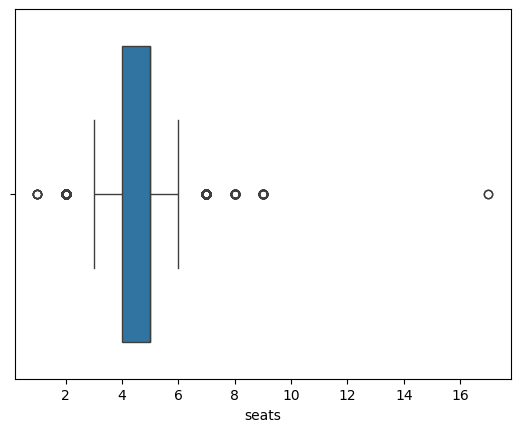

In [1142]:
sns.boxplot(data=df, x = 'seats');

# GEARS

In [1143]:
df.gears.value_counts()

gears
6.0     11843
5.0      6997
7.0      2320
8.0      1813
1.0      1191
9.0      1116
4.0       306
10.0      111
3.0        42
2.0         3
Name: count, dtype: int64

In [1144]:
df[df['gears'] == 2].T

,21825,26638,26826
make_model,Fiat 500,Ford Mercury,Ford Mercury
price,10950.0,38990.0,26750.0
body_type,Compact,Coupe,Coupe
type,Used,Used,Used
doors,3.0,2.0,3.0
warranty,No,No,No
mileage,13500.0,93522.0,124000.0
gearbox,Manual,Automatic,Automatic
fuel_type,Electric,Benzine,Benzine
colour,White,White,White


In [1145]:
df[df['gears'] == 10].T

,589,607,608,609,610,741,742,762,775,776,...,12282,12284,12287,12288,12292,12295,12296,12308,26822,26834
make_model,Ford Bronco,Ford Explorer,Ford F 150,Ford F 150 V6,Ford F 150 V6,Ford Mustang,Ford Mustang,Ford Mustang,Ford Mustang V8,Ford Mustang V8,...,Ford Mustang,Ford Mustang,Ford Mustang V8,Ford Mustang V8,Ford Mustang V8,Ford Mustang V8,Ford Mustang V8,Ford Mustang V8,Ford Fairlane V8,Ford Thunderbird V8
price,89000.0,54500.0,79990.0,84950.0,84950.0,61990.0,66650.0,66650.0,62880.0,63990.0,...,34900.0,25500.0,64990.0,48300.0,52990.0,50450.0,51990.0,48500.0,24549.0,59900.0
body_type,Compact,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Convertible,Convertible,Coupe,Convertible,Convertible,...,Coupe,Coupe,Convertible,Convertible,Convertible,Convertible,Convertible,Coupe,Convertible,Convertible
type,Pre-registered,Used,Used,Used,Used,Pre-registered,Pre-registered,Pre-registered,Demonstration,Demonstration,...,Used,Used,Used,Used,Used,Used,Used,Used,Used,Used
doors,5.0,5.0,4.0,4.0,4.0,2.0,3.0,3.0,2.0,2.0,...,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0,2.0
warranty,No,No,No,No,No,No,No,No,Yes,No,...,No,No,No,No,No,No,No,No,No,No
mileage,2.0,4200.0,3500.0,200.0,100.0,50.0,10.0,10.0,5000.0,800.0,...,115000.0,79333.0,14987.0,6050.0,9150.0,22940.0,59909.0,46400.0,42736.0,23984.0
gearbox,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,...,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Manual,Automatic
fuel_type,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,...,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine
colour,Orange,Blue,Silver,Grey,Blue,Black,White,White,Black,Black,...,Orange,Grey,White,Red,Yellow,Black,Blue,Blue,Red,Black


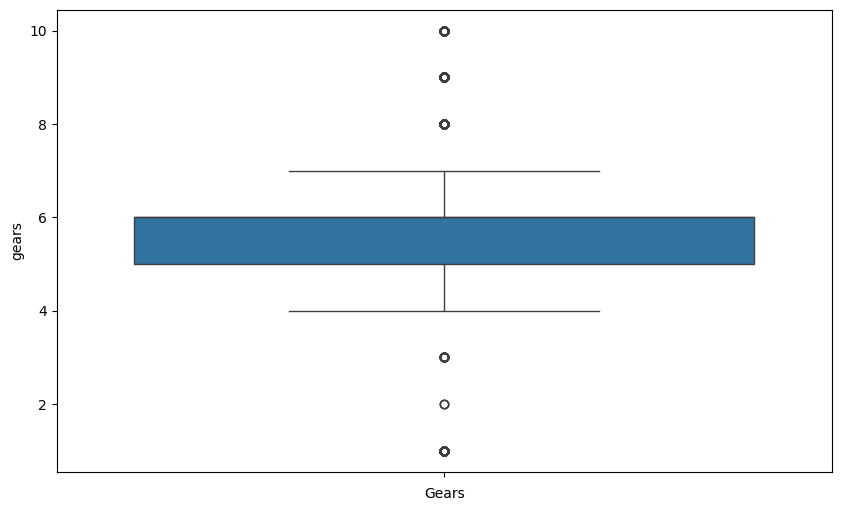

In [1146]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df['gears'])
plt.xlabel('Gears')
plt.show()

In [1147]:
df.gears.min()

1.0

In [1148]:
df[df['gears'] == 1].T

,2,157,194,275,280,281,282,283,284,285,...,26307,26341,26342,26371,26387,26415,26440,26469,26511,26791
make_model,Dacia,Dacia Sandero,Dacia Sandero,Dacia Sandero,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,...,Toyota Corolla,Mercedes-Benz SL 300,Mercedes-Benz SL 300,Mercedes-Benz 260,Toyota Corolla,Volvo 240,Opel Ascona,Volvo 240,Toyota Corolla,Ford Mustang
price,21799.0,17080.0,18990.0,19990.0,18490.0,22980.0,21599.0,21599.0,21599.0,27044.0,...,9500.0,49890.0,69500.0,19990.0,11886.0,9850.0,4750.0,126950.0,12900.0,45000.0
body_type,Station wagon,Compact,Compact,Sedan,Off-Road/Pick-up,Off-Road/Pick-up,Sedan,Sedan,Sedan,Sedan,...,Coupe,Convertible,Convertible,Sedan,Coupe,Sedan,Coupe,Coupe,Coupe,Convertible
type,Demonstration,Demonstration,Pre-registered,Pre-registered,Used,Demonstration,Employee's car,Employee's car,Employee's car,Used,...,Used,Used,Used,Used,Used,Used,Used,Used,Used,Used
doors,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,...,2.0,2.0,2.0,4.0,2.0,4.0,3.0,2.0,2.0,2.0
warranty,No,No,Yes,No,No,No,No,No,No,No,...,No,No,No,No,Yes,No,No,No,No,No
mileage,2000.0,1990.0,20.0,10.0,5800.0,5000.0,500.0,500.0,500.0,4990.0,...,134000.0,176000.0,90000.0,61000.0,120086.0,116569.0,28900.0,1.0,73000.0,100000.0
gearbox,Manual,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Manual,...,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Manual,Manual,Automatic
fuel_type,Benzine,Benzine,Benzine,Benzine,Electric,Electric,Electric,Electric,Electric,Electric,...,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine
colour,Grey,Black,Grey,Orange,Silver,White,Red,Blue,Blue,Silver,...,Grey,Red,Black,Grey,White,Red,Grey,White,Green,Black


In [1149]:
df[df['gears'] == 1]['gears']

2        1.0
157      1.0
194      1.0
275      1.0
280      1.0
        ... 
26415    1.0
26440    1.0
26469    1.0
26511    1.0
26791    1.0
Name: gears, Length: 1191, dtype: float64

In [1150]:
from scipy import stats

In [1151]:
# Step 1: Calculate Z-scores for the relevant columns
df['z_score_gears'] =  stats.zscore(df['gears'])

# Step 2: Filter out rows where the z-score is greater than 3 or less than -3
df_no_outliers = df[(df['z_score_gears'].abs() <= 3)]


# Step 3: Drop the z-score column as it's no longer needed
df_no_outliers = df_no_outliers.drop(columns=['z_score_gears'])

# Print the resulting DataFrame
df_no_outliers.sort_values(by='gears')

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,fuel_consumption_comb,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index
26638,Ford Mercury,38990.0,Coupe,Used,2.0,No,93522.0,Automatic,Benzine,White,...,6.698559,Germany,52.0,yes,Efficient,Enhanced,Advanced,Enhanced,2.0,NaN
26826,Ford Mercury,26750.0,Coupe,Used,3.0,No,124000.0,Automatic,Benzine,White,...,6.698559,Germany,65.0,yes,Efficient,Basic,Advanced,Advanced,2.0,NaN
21825,Fiat 500,10950.0,Compact,Used,3.0,No,13500.0,Manual,Electric,White,...,4.068000,Germany,11.0,yes,Efficient,Basic,Basic,Advanced,2.0,NaN
26701,Ford Mustang,33500.0,Convertible,Used,3.0,No,166221.0,Automatic,Benzine,Red,...,10.830000,France,55.0,no,Inefficient,Basic,Basic,Advanced,3.0,NaN
26827,Ford Thunderbird,28900.0,Convertible,Used,3.0,No,30000.0,Automatic,Benzine,Red,...,9.400000,Germany,65.0,no,Efficient,Basic,Enhanced,Advanced,4.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6352,Ford Mustang V8,55000.0,Convertible,Used,3.0,No,11300.0,Automatic,Benzine,Green,...,12.500000,Germany,2.0,yes,Inefficient,Advanced,Advanced,Advanced,5.0,NaN
6351,Ford Mustang V8,51980.0,Convertible,Used,2.0,Yes,19750.0,Automatic,Benzine,White,...,12.500000,Germany,2.0,no,Inefficient,Advanced,Advanced,Advanced,14.0,NaN
3629,Ford Mustang V8,208101.0,Coupe,Used,2.0,No,1392.0,Automatic,Benzine,Black,...,12.179012,Austria,1.0,yes,Inefficient,Advanced,Advanced,Advanced,7.0,NaN
6350,Ford Mustang V8,51980.0,Convertible,Used,2.0,Yes,19750.0,Automatic,Benzine,Blue,...,12.500000,Germany,2.0,no,Inefficient,Advanced,Advanced,Advanced,14.0,NaN


In [1152]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 25742 entries, 2 to 26855
Data columns (total 38 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   make_model                   25742 non-null  object 
 1   price                        25742 non-null  float64
 2   body_type                    25742 non-null  object 
 3   type                         25742 non-null  object 
 4   doors                        25742 non-null  float64
 5   warranty                     25742 non-null  object 
 6   mileage                      25742 non-null  float64
 7   gearbox                      25742 non-null  object 
 8   fuel_type                    25742 non-null  object 
 9   colour                       25742 non-null  object 
 10  paint                        25742 non-null  object 
 11  seller                       25742 non-null  object 
 12  seats                        25742 non-null  float64
 13  engine_size          

In [1153]:
df[df['gears'] == 1].groupby('gears')['fuel_type'].value_counts()

gears  fuel_type
1.0    Electric     952
       Benzine      195
       Diesel        43
       LPG            1
Name: count, dtype: int64

In [1154]:
df[(df['gears'] == 1) & (df['fuel_type'] == 'Electric')]

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears
280,Dacia Spring,18490.0,Off-Road/Pick-up,Used,5.0,No,5800.0,Automatic,Electric,Silver,...,Austria,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446
281,Dacia Spring,22980.0,Off-Road/Pick-up,Demonstration,5.0,No,5000.0,Automatic,Electric,White,...,Germany,0.0,no,Efficient,Enhanced,Enhanced,Advanced,5.0,NaN,-3.195446
282,Dacia Spring,21599.0,Sedan,Employee's car,5.0,No,500.0,Automatic,Electric,Red,...,Germany,0.0,no,Efficient,Advanced,Enhanced,Advanced,5.0,NaN,-3.195446
283,Dacia Spring,21599.0,Sedan,Employee's car,5.0,No,500.0,Automatic,Electric,Blue,...,Germany,0.0,no,Efficient,Advanced,Enhanced,Advanced,5.0,NaN,-3.195446
284,Dacia Spring,21599.0,Sedan,Employee's car,5.0,No,500.0,Automatic,Electric,Blue,...,Germany,0.0,no,Efficient,Advanced,Enhanced,Advanced,5.0,NaN,-3.195446
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
22851,Toyota Prius,10490.0,Compact,Used,5.0,Yes,102570.0,Automatic,Electric,Black,...,Spain,12.0,no,Efficient,Advanced,Advanced,Advanced,2.0,NaN,-3.195446
22853,Toyota Prius,13500.0,Sedan,Used,4.0,Yes,90677.0,Automatic,Electric,Grey,...,Germany,12.0,yes,Efficient,Enhanced,Advanced,Advanced,4.0,NaN,-3.195446
23233,Toyota Prius,11400.0,Compact,Used,5.0,No,124987.0,Automatic,Electric,Silver,...,Netherlands,13.0,no,Efficient,Enhanced,Advanced,Advanced,2.0,NaN,-3.195446
23234,Toyota Prius,11950.0,Compact,Used,5.0,No,87775.0,Automatic,Electric,Black,...,Netherlands,13.0,no,Efficient,Advanced,Advanced,Enhanced,2.0,NaN,-3.195446


In [1155]:
df[(df['gears'] == 1) & (df['fuel_type'] == 'Benzine')]

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears
2,Dacia,21799.0,Station wagon,Demonstration,5.0,No,2000.0,Manual,Benzine,Grey,...,Germany,0.0,no,Inefficient,Enhanced,Advanced,Advanced,5.0,NaN,-3.195446
157,Dacia Sandero,17080.0,Compact,Demonstration,5.0,No,1990.0,Automatic,Benzine,Black,...,Germany,0.0,no,Inefficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446
194,Dacia Sandero,18990.0,Compact,Pre-registered,5.0,Yes,20.0,Automatic,Benzine,Grey,...,Germany,0.0,no,Inefficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446
275,Dacia Sandero,19990.0,Sedan,Pre-registered,5.0,No,10.0,Automatic,Benzine,Orange,...,Germany,0.0,no,Inefficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446
1458,Nissan Micra,19690.0,Compact,Pre-registered,5.0,No,15.0,Automatic,Benzine,Silver,...,Germany,0.0,yes,Inefficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446
1526,Nissan Qashqai,37390.0,Sedan,Used,5.0,No,8000.0,Automatic,Benzine,Blue,...,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446
1527,Nissan Qashqai,38990.0,Sedan,Used,5.0,No,9000.0,Automatic,Benzine,White,...,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446
2668,Toyota Aygo,22030.0,Compact,Demonstration,5.0,No,2900.0,Automatic,Benzine,Blue,...,Germany,0.0,yes,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446
2670,Toyota Aygo,17790.0,Compact,Pre-registered,5.0,No,15.0,Automatic,Benzine,Beige,...,Germany,0.0,yes,Efficient,Advanced,Advanced,Enhanced,5.0,NaN,-3.195446
2689,Toyota Aygo,20880.0,Sedan,Employee's car,5.0,Yes,1395.0,Automatic,Benzine,Beige,...,Germany,0.0,yes,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446


In [1156]:
df[(df['make_model'] == 'Dacia Sandero') & (df['fuel_type'] == 'Benzine')]

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears
154,Dacia Sandero,14780.0,Compact,Demonstration,5.0,No,1879.0,Manual,Benzine,Orange,...,Germany,0.0,no,Inefficient,Advanced,Advanced,Basic,5.0,NaN,0.101540
157,Dacia Sandero,17080.0,Compact,Demonstration,5.0,No,1990.0,Automatic,Benzine,Black,...,Germany,0.0,no,Inefficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446
158,Dacia Sandero,14100.0,Compact,Used,5.0,Yes,308.0,Manual,Benzine,White,...,Belgium,0.0,no,Inefficient,Advanced,Enhanced,Advanced,5.0,NaN,-0.557857
159,Dacia Sandero,19140.0,Compact,Demonstration,5.0,No,1999.0,Automatic,Benzine,Red,...,Germany,0.0,no,Inefficient,Advanced,Advanced,Advanced,5.0,NaN,0.101540
160,Dacia Sandero,15080.0,Compact,Demonstration,5.0,No,2212.0,Manual,Benzine,Grey,...,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-0.557857
163,Dacia Sandero,14080.0,Compact,Demonstration,5.0,No,1001.0,Manual,Benzine,Blue,...,Germany,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN,0.101540
164,Dacia Sandero,15990.0,Compact,Pre-registered,5.0,Yes,4643.0,Manual,Benzine,White,...,Spain,0.0,no,Inefficient,Advanced,Advanced,Basic,5.0,NaN,0.101540
165,Dacia Sandero,15240.0,Compact,Used,4.0,Yes,150.0,Manual,Benzine,White,...,Germany,0.0,yes,Inefficient,Advanced,Enhanced,Advanced,5.0,NaN,-0.557857
167,Dacia Sandero,12010.0,Compact,Pre-registered,5.0,No,10.0,Manual,Benzine,Red,...,Germany,0.0,no,Inefficient,Advanced,Advanced,Advanced,5.0,NaN,-0.557857
168,Dacia Sandero,14727.0,Compact,Pre-registered,5.0,Yes,2386.0,Manual,Benzine,Blue,...,Spain,0.0,no,Efficient,Enhanced,Enhanced,Enhanced,5.0,NaN,-0.557857


In [1157]:
df['gears'].describe()

count    25742.000000
mean         5.846010
std          1.516566
min          1.000000
25%          5.000000
50%          6.000000
75%          6.000000
max         10.000000
Name: gears, dtype: float64

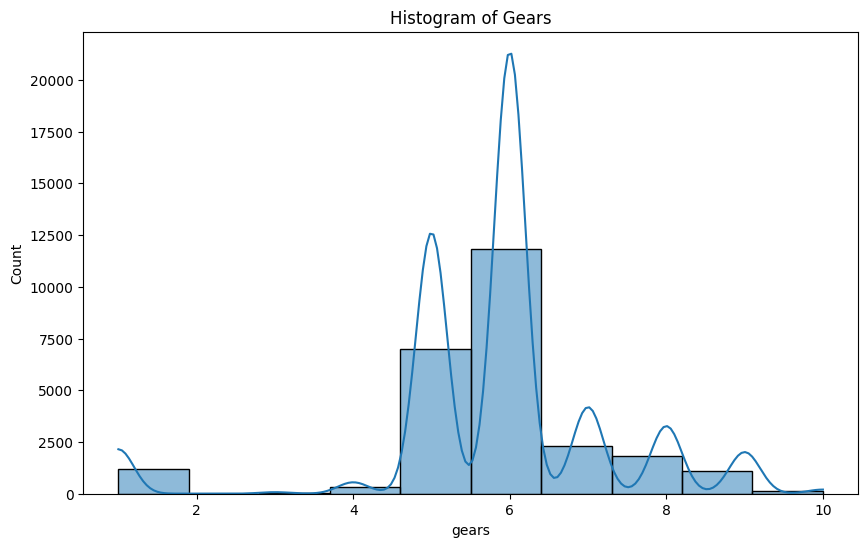

In [1158]:
plt.figure(figsize=(10, 6))
sns.histplot(df['gears'], bins=10, kde=True)
plt.title('Histogram of Gears')
plt.show()

In [1159]:
# IQR hesaplama
Q1 = df['gears'].quantile(0.25)
Q3 = df['gears'].quantile(0.75)
IQR = Q3 - Q1

# Alt ve üst sınırların belirlenmesi
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Outlier'ların tespiti
outliers = df[(df['gears'] < lower_bound) | (df['gears'] > upper_bound)]
print("Outliers:\n", outliers)

# Outlier'ları içermeyen veri çerçevesi
df_no_outliers = df[(df['gears'] >= lower_bound) & (df['gears'] <= upper_bound)]
df_no_outliers

Outliers:
            make_model    price          body_type             type  doors  \
2              Dacia   21799.0      Station wagon    Demonstration    5.0   
157     Dacia Sandero  17080.0            Compact    Demonstration    5.0   
194     Dacia Sandero  18990.0            Compact   Pre-registered    5.0   
275     Dacia Sandero  19990.0              Sedan   Pre-registered    5.0   
280      Dacia Spring  18490.0   Off-Road/Pick-up             Used    5.0   
...               ...      ...                ...              ...    ...   
26848        Ford  V8  54990.0        Convertible             Used    2.0   
26849        Ford  V8  49900.0        Convertible             Used    2.0   
26850  Ford  Roadster  40000.0        Convertible             Used    2.0   
26851        Peugeot    8950.0              Coupe             Used    2.0   
26854     Ford Bronco  57480.0   Off-Road/Pick-up             Used    5.0   

      warranty  mileage    gearbox fuel_type  colour  ... locati

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears
3,Dacia Break,20500.0,Station wagon,Demonstration,4.0,Yes,999.0,Manual,Benzine,Brown,...,Belgium,0.0,no,Efficient,Advanced,Advanced,Enhanced,5.0,NaN,0.101540
4,Dacia Dokker,16900.0,Station wagon,Used,6.0,Yes,90.0,Manual,LPG,White,...,Belgium,0.0,no,Inefficient,Basic,Basic,Advanced,5.0,NaN,-0.557857
5,Dacia Duster,21000.0,Off-Road/Pick-up,Pre-registered,5.0,Yes,1000.0,Manual,Diesel,Orange,...,Spain,0.0,no,Inefficient,Advanced,Advanced,Advanced,5.0,NaN,0.101540
6,Dacia Duster,21000.0,Off-Road/Pick-up,Pre-registered,5.0,Yes,1000.0,Manual,Diesel,Orange,...,Spain,0.0,no,Inefficient,Advanced,Advanced,Advanced,5.0,NaN,0.101540
7,Dacia Duster,21150.0,Off-Road/Pick-up,Demonstration,5.0,Yes,4500.0,Manual,Benzine,Black,...,Germany,0.0,no,Inefficient,Advanced,Advanced,Advanced,5.0,NaN,0.101540
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26845,Ford,54000.0,Convertible,Used,4.0,No,28000.0,Automatic,Benzine,Beige,...,Austria,85.0,yes,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-1.217254
26846,Fiat,159000.0,Convertible,Used,4.0,No,999999.0,Manual,Benzine,Brown,...,Germany,89.0,no,Efficient,Advanced,Advanced,Advanced,3.0,NaN,-1.217254
26852,Ford M,20000.0,Convertible,Used,4.0,No,65515.0,Manual,Benzine,Green,...,Belgium,93.0,no,Efficient,Enhanced,Basic,Enhanced,3.0,NaN,0.101540
26853,Ford,14490.0,Convertible,Used,2.0,No,5000.0,Automatic,Benzine,Red,...,Belgium,94.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-1.217254


In [1160]:
outliers = df[(df['z_score_gears'] > 3) | (df['z_score_gears'] < -3 )]

outlier_counts = outliers['gears'].value_counts()

outlier_counts

gears
1.0    1191
Name: count, dtype: int64

In [1161]:
df.groupby(['make_model', 'gearbox'])['gears'].value_counts()

make_model    gearbox         gears
Dacia         Manual          1.0       1
                              4.0       1
Dacia Break   Manual          6.0       1
Dacia Dokker  Manual          5.0      50
                              6.0       2
                                       ..
Volvo XC90    Automatic       8.0      99
                              6.0       5
              Manual          8.0       1
                              6.0       1
              Semi-automatic  8.0       1
Name: count, Length: 1604, dtype: int64

In [1162]:
drop_gears_benzine = df[(df['gears'] == 1) & (df['fuel_type'] == 'Benzine')].index
drop_gears_benzine

Index([    2,   157,   194,   275,  1458,  1526,  1527,  2668,  2670,  2689,
       ...
       26307, 26341, 26342, 26371, 26387, 26415, 26440, 26469, 26511, 26791],
      dtype='int64', length=195)

In [1163]:

drop_gears_diesel = df[(df['gears'] == 1) & (df['fuel_type'] == 'Diesel')].index
drop_gears_diesel

Index([ 2776,  2871,  2872,  2873,  4318,  5420,  6558,  7365,  9888, 10538,
       12565, 13018, 13066, 13180, 13647, 13724, 15987, 16802, 16824, 17760,
       17792, 18337, 18340, 18383, 18388, 18392, 18393, 18985, 19056, 19518,
       19520, 19570, 20009, 20044, 20424, 20425, 20426, 20445, 21356, 21715,
       22357, 22854, 25114],
      dtype='int64')

In [1164]:
df[(df['gears'] == 1) & (df['fuel_type'] == 'Diesel')]

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears
2776,Toyota C-HR,32490.0,Sedan,Used,5.0,Yes,4999.0,Automatic,Diesel,Grey,...,France,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446
2871,Toyota RAV 4,41999.0,Station wagon,Used,5.0,Yes,8500.0,Automatic,Diesel,White,...,France,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446
2872,Toyota RAV 4,53500.0,Station wagon,Used,5.0,Yes,10100.0,Automatic,Diesel,White,...,France,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446
2873,Toyota RAV 4,52450.0,Station wagon,Used,5.0,Yes,8000.0,Automatic,Diesel,Silver,...,France,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446
4318,Opel Combo,23481.0,Station wagon,Used,5.0,Yes,32798.0,Manual,Diesel,Blue,...,Spain,1.0,no,Efficient,Enhanced,Advanced,Advanced,3.0,NaN,-3.195446
5420,Toyota Corolla,26499.0,Station wagon,Used,5.0,Yes,37391.0,Automatic,Diesel,Blue,...,France,1.0,no,Efficient,Advanced,Advanced,Basic,3.0,NaN,-3.195446
6558,Mercedes-Benz A 180,26390.0,Compact,Used,5.0,Yes,94467.0,Automatic,Diesel,Grey,...,Spain,2.0,no,Inefficient,Enhanced,Advanced,Enhanced,7.0,NaN,-3.195446
7365,Renault Megane,17490.0,Compact,Used,5.0,No,19977.0,Manual,Diesel,Grey,...,France,2.0,no,Efficient,Advanced,Basic,Advanced,3.0,NaN,-3.195446
9888,Opel Combo,18300.0,Station wagon,Used,5.0,Yes,99738.0,Manual,Diesel,Grey,...,Spain,3.0,no,Efficient,Enhanced,Advanced,Advanced,2.0,NaN,-3.195446
10538,Renault ZOE,15200.0,Station wagon,Used,5.0,Yes,149719.0,Manual,Diesel,White,...,Spain,3.0,no,Efficient,Advanced,Advanced,Advanced,2.0,NaN,-3.195446


In [1165]:
df[(df['gears'] == 1) & (df['fuel_type'] == 'LPG')]

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,location_country,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears
26153,Volvo 240,7950.0,Station wagon,Used,5.0,No,231225.0,Manual,LPG,Green,...,Netherlands,29.0,yes,Efficient,Basic,Advanced,Advanced,2.0,NaN,-3.195446


In [1166]:
drop_gears_lpg = df[(df['gears'] == 1) & (df['fuel_type'] == 'LPG')].index
drop_gears_lpg

Index([26153], dtype='int64')

In [1167]:
drop_gears_lpg = df[(df['gears'] == 1) & (df['fuel_type'] == 'LPG')].index
df = df.drop(drop_gears_lpg)

In [1168]:
drop_gears_diesel = df[(df['gears'] == 1) & (df['fuel_type'] == 'Diesel')].index
df = df.drop(drop_gears_diesel)

In [1169]:
drop_gears_benzine = df[(df['gears'] == 1) & (df['fuel_type'] == 'Benzine')].index
df = df.drop(drop_gears_benzine)

# CO2 EMISSION

In [1170]:
df.co2_emissions.describe()

count    25503.000000
mean       133.180724
std        128.013710
min          0.000000
25%        106.000000
50%        125.000000
75%        157.000000
max      15168.000000
Name: co2_emissions, dtype: float64

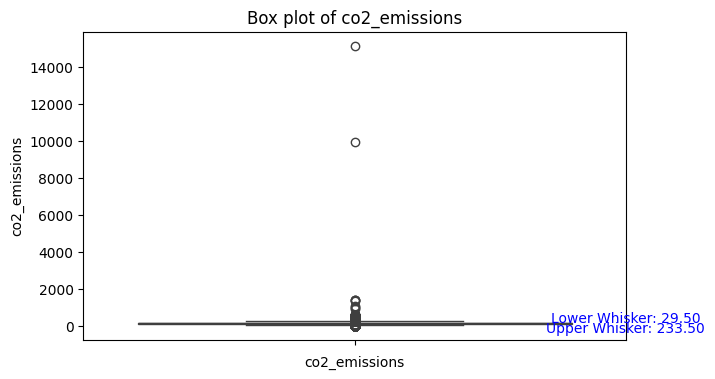

In [1171]:
box_plot_column(df,'co2_emissions')


In [1172]:
threshold = 3
z_scores = (df['co2_emissions'] - df['co2_emissions'].mean()) / df['co2_emissions'].std()
outliers_z_score = df[abs(z_scores) > threshold]
outliers_z_score.index

Index([ 3366,  6084,  6156,  7244,  9831, 11775, 13708, 13713, 13714, 15007,
       17351, 21720, 22348, 23041, 23255, 25249, 25400, 25546, 25737, 25776,
       26192, 26276, 26322, 26421, 26541, 26561, 26589, 26590, 26591, 26647,
       26648, 26663, 26688, 26756, 26816],
      dtype='int64')

In [1173]:
indices = [ 3366,  6084,  6156,  7244,  9831, 11775, 13708, 13713, 13714, 15007,
       17351, 21720, 22348, 23041, 23255, 25249, 25400, 25546, 25737, 25776,
       26192, 26276, 26322, 26421, 26541, 26561, 26589, 26590, 26591, 26647,
       26648, 26663, 26688, 26756, 26816]

# İndeksleri df.loc ile seçmek
df.loc[indices].T

,3366,6084,6156,7244,9831,11775,13708,13713,13714,15007,...,26561,26589,26590,26591,26647,26648,26663,26688,26756,26816
make_model,Ford Fiesta,Ford Edge,Ford Focus,Peugeot 308,Opel Astra,Fiat 124 Spider,Renault Megane,Renault Megane,Renault Megane,Fiat 500,...,Fiat 124 Coupè,Fiat 124 Coupè,Fiat 124 Coupè,Fiat 124 Coupè,Volvo Amazon,Fiat 124 Coupè,Volvo Amazon,Volvo Amazon,Volvo Amazon,Volvo P1800
price,29440.0,40650.0,25988.0,17900.0,17880.0,18488.0,28208.0,28208.0,28208.0,19900.0,...,9000.0,22000.0,22000.0,15500.0,2800.0,1900.0,44000.0,14550.0,30500.0,48500.0
body_type,Compact,Off-Road/Pick-up,Compact,Sedan,Sedan,Convertible,Sedan,Sedan,Sedan,Convertible,...,Coupe,Coupe,Coupe,Coupe,Coupe,Coupe,Coupe,Coupe,Coupe,Coupe
type,Demonstration,Used,Used,Used,Used,Used,Used,Used,Used,Used,...,Used,Used,Used,Used,Used,Used,Used,Used,Used,Used
doors,3.0,5.0,5.0,5.0,5.0,2.0,5.0,5.0,5.0,2.0,...,3.0,2.0,3.0,2.0,3.0,2.0,4.0,2.0,2.0,2.0
warranty,Yes,No,No,No,No,No,Yes,Yes,Yes,No,...,No,No,No,No,No,No,No,No,No,No
mileage,12500.0,27214.0,16397.0,42743.0,38455.0,69347.0,56160.0,56160.0,56160.0,58000.0,...,55000.0,39500.0,85000.0,104500.0,111111.0,65412.0,89525.0,11231.0,87562.0,200000.0
gearbox,Manual,Automatic,Automatic,Automatic,Automatic,Manual,Automatic,Automatic,Automatic,Automatic,...,Manual,Manual,Manual,Manual,Manual,Manual,Manual,Manual,Manual,Manual
fuel_type,Benzine,Diesel,Benzine,Diesel,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,...,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine
colour,Blue,Black,Black,Grey,Black,Black,Orange,Orange,Orange,White,...,Blue,Red,Grey,Green,Red,Blue,Blue,Green,Green,White


In [1174]:
drop_indices_co2_emission = [3369, 6087, 6159, 7247, 9834, 11778, 13711, 13716, 13717, 15010,
           17354, 21723, 22351, 23044, 23258,  25403,  25740, 25779,
           26195, 26279, 26325, 26424, 26544, 26564, 26592, 26594, 26691, 26759,
           26819]
df.drop(index=drop_indices_co2_emission,inplace=True)

In [1175]:
df.columns


Index(['make_model', 'price', 'body_type', 'type', 'doors', 'warranty',
       'mileage', 'gearbox', 'fuel_type', 'colour', 'paint', 'seller', 'seats',
       'engine_size', 'gears', 'co2_emissions', 'drivetrain', 'cylinders',
       'empty_weight', 'service_history', 'non_smoker', 'emission_sticker',
       'upholstery_color', 'upholstery', 'available', 'taxi_rental',
       'power_kW', 'fuel_consumption_comb', 'location_country', 'age',
       'inspection_status', 'energy_efficiency_class',
       'safety_security_package', 'comfort_convenience_package',
       'ent_media_package', 'num_of_extras', 'index', 'z_score_gears'],
      dtype='object')

In [1176]:
df[df['make_model'] == 'Dacia Spring'].T

,280,281,282,283,284,285,286,287,288,3122,...,3142,3143,3144,3145,3146,3147,3148,3149,3150,3151
make_model,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,...,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring,Dacia Spring
price,18490.0,22980.0,21599.0,21599.0,21599.0,27044.0,21607.0,21607.0,18400.0,22985.0,...,23090.0,23090.0,23080.0,22985.0,22985.0,22985.0,19950.0,16499.0,19500.0,18099.0
body_type,Off-Road/Pick-up,Off-Road/Pick-up,Sedan,Sedan,Sedan,Sedan,Sedan,Sedan,Sedan,Compact,...,Compact,Compact,Compact,Compact,Compact,Compact,Compact,Off-Road/Pick-up,Sedan,Sedan
type,Used,Demonstration,Employee's car,Employee's car,Employee's car,Used,Employee's car,Employee's car,Used,Demonstration,...,Demonstration,Demonstration,Demonstration,Demonstration,Demonstration,Demonstration,Demonstration,Used,Employee's car,Used
doors,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,...,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0
warranty,No,No,No,No,No,No,No,No,Yes,No,...,No,No,No,No,No,No,Yes,No,No,No
mileage,5800.0,5000.0,500.0,500.0,500.0,4990.0,500.0,500.0,1.0,3001.0,...,10.0,50.0,4500.0,3001.0,1001.0,2100.0,4654.0,5020.0,5400.0,8001.0
gearbox,Automatic,Automatic,Automatic,Automatic,Automatic,Manual,Automatic,Automatic,Automatic,Automatic,...,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic,Automatic
fuel_type,Electric,Electric,Electric,Electric,Electric,Electric,Electric,Electric,Electric,Electric,...,Electric,Electric,Electric,Electric,Electric,Electric,Electric,Electric,Electric,Electric
colour,Silver,White,Red,Blue,Blue,Silver,Red,Blue,Grey,Silver,...,Silver,White,White,White,White,White,White,Silver,White,White


## 1. Price Analysis

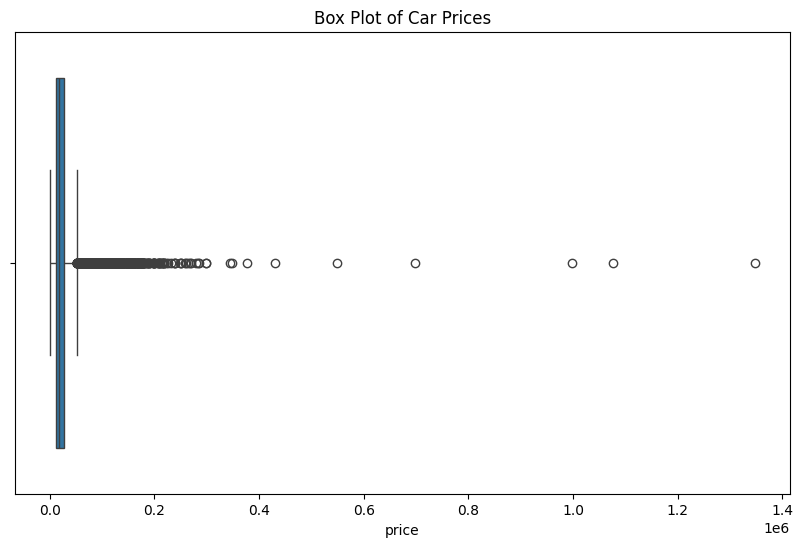

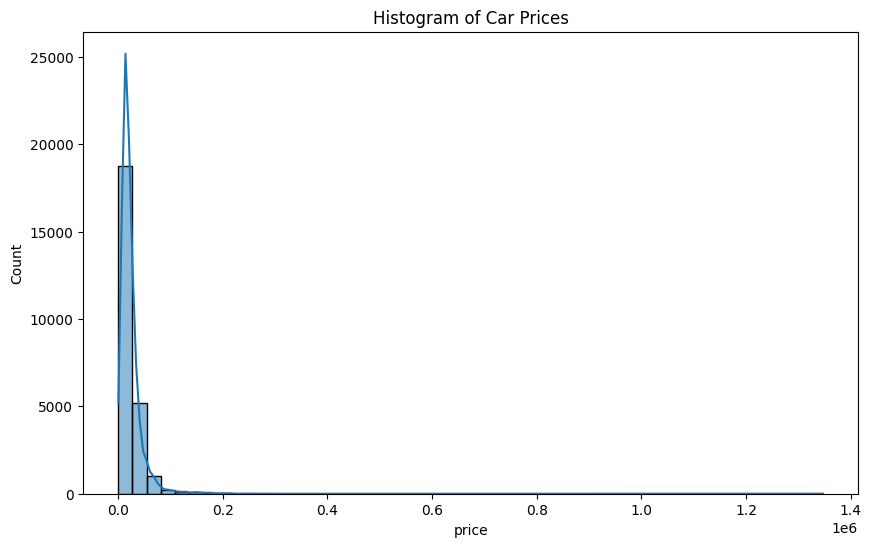

In [1177]:
# Box plot for car prices
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['price'])
plt.title('Box Plot of Car Prices')
plt.show()

# Histogram for car prices
plt.figure(figsize=(10, 6))
sns.histplot(df['price'], bins=50, kde=True)
plt.title('Histogram of Car Prices')
plt.show()

In [1178]:
from scipy import stats
import numpy as np

# Calculate Z-scores
df['price_zscore'] = stats.zscore(df['price'])

# Identify outliers
outliers = df[np.abs(df['price_zscore']) > 3]
print("Number of outliers detected:", len(outliers))

Number of outliers detected: 337


## 2. Mileage Analysis

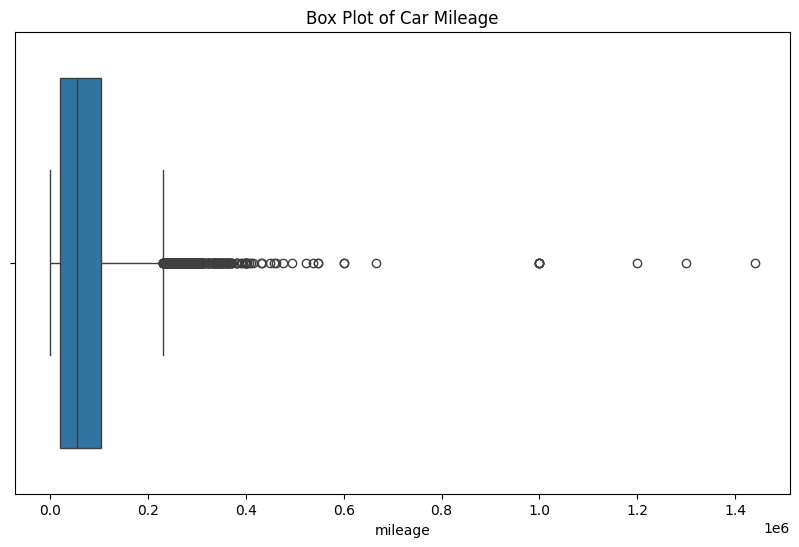

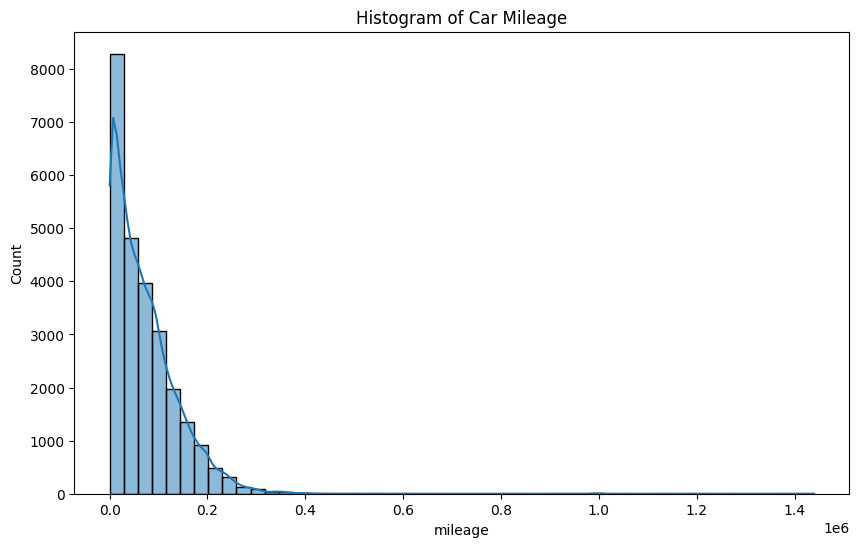

In [1179]:
# Box plot for mileage
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['mileage'])
plt.title('Box Plot of Car Mileage')
plt.show()

# Histogram for mileage
plt.figure(figsize=(10, 6))
sns.histplot(df['mileage'], bins=50, kde=True)
plt.title('Histogram of Car Mileage')
plt.show()

In [1180]:
df.mileage.describe()

count    2.547400e+04
mean     7.087107e+04
std      6.712713e+04
min      0.000000e+00
25%      1.960000e+04
50%      5.512600e+04
75%      1.039382e+05
max      1.440000e+06
Name: mileage, dtype: float64

In [1181]:
# Find the row with the minimum mileage
min_mileage = df[df['mileage'] == df['mileage'].min()]
min_mileage

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore
148,Dacia Lodgy,19500.0,Station wagon,Pre-registered,5.0,No,0.0,Manual,Benzine,Beige,...,0.0,no,Inefficient,Advanced,Enhanced,Advanced,5.0,NaN,0.101540,-0.159166
260,Dacia Sandero,16490.0,Sedan,Pre-registered,5.0,Yes,0.0,Manual,Benzine,White,...,0.0,no,Efficient,Advanced,Enhanced,Advanced,5.0,NaN,-0.557857,-0.277844
339,Fiat 500,27000.0,Convertible,Pre-registered,2.0,Yes,0.0,Automatic,Electric,Red,...,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-0.557857,0.136544
448,Fiat 500X,21300.0,Off-Road/Pick-up,Pre-registered,5.0,Yes,0.0,Manual,Benzine,Grey,...,0.0,no,Inefficient,Enhanced,Advanced,Advanced,5.0,NaN,0.101540,-0.088196
457,Fiat 500X,28690.0,Off-Road/Pick-up,Pre-registered,5.0,Yes,0.0,Manual,Benzine,White,...,0.0,no,Inefficient,Enhanced,Advanced,Advanced,5.0,NaN,0.101540,0.203177
543,Fiat Tipo,20700.0,Station wagon,Pre-registered,5.0,Yes,0.0,Manual,Benzine,White,...,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN,0.101540,-0.111852
553,Fiat Tipo,22250.0,Station wagon,Used,5.0,Yes,0.0,Manual,Benzine,Brown,...,0.0,yes,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-0.557857,-0.050739
699,Ford Focus,29970.0,Sedan,Pre-registered,5.0,No,0.0,Manual,Benzine,Blue,...,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN,0.101540,0.253645
720,Ford Kuga,32200.0,Off-Road/Pick-up,Pre-registered,5.0,Yes,0.0,Manual,Benzine,Grey,...,0.0,no,Efficient,Advanced,Advanced,Advanced,5.0,NaN,0.101540,0.341569
970,Hyundai i10,14590.0,Station wagon,Demonstration,5.0,No,0.0,Automatic,Benzine,Black,...,0.0,no,Inefficient,Advanced,Enhanced,Advanced,5.0,NaN,-0.557857,-0.352757


In [1182]:
min_mileage[['mileage', 'age', 'make_model', 'price']]

,mileage,age,make_model,price
148,0.0,0.0,Dacia Lodgy,19500.0
260,0.0,0.0,Dacia Sandero,16490.0
339,0.0,0.0,Fiat 500,27000.0
448,0.0,0.0,Fiat 500X,21300.0
457,0.0,0.0,Fiat 500X,28690.0
543,0.0,0.0,Fiat Tipo,20700.0
553,0.0,0.0,Fiat Tipo,22250.0
699,0.0,0.0,Ford Focus,29970.0
720,0.0,0.0,Ford Kuga,32200.0
970,0.0,0.0,Hyundai i10,14590.0


In [1183]:
# Filter the rows where the 'age' is greater than 1
outliers_mileage = min_mileage[min_mileage['age'] > 1].index
outliers_mileage

Index([15361], dtype='int64')

#### * The car is an outlier because its age is 5 while its mileage is 0.

In [1184]:
# Find the row with the maximum mileage
max_mileage = df[df['mileage'] == df['mileage'].max()]
max_mileage

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,age,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore
9599,Nissan Micra,14400.0,Compact,Used,5.0,Yes,1440000.0,Manual,Benzine,Grey,...,3.0,no,Efficient,Enhanced,Enhanced,Enhanced,2.0,NaN,-0.557857,-0.360249


In [1185]:
outliers_mileage2 = max_mileage.index
outliers_mileage2

Index([9599], dtype='int64')

#### * The car is an outlier because its mileage is 1.440.000 km while its age is 3.

In [1186]:
# Calculate Z-scores for mileage
df['mileage_zscore'] = stats.zscore(df['mileage'])

# Define a threshold for Z-score, typically 3 or -3
threshold = 3

# Identify mileage outliers for both positive and negative thresholds
mileage_outliers = df[(np.abs(df['mileage_zscore']) > threshold) | (df['mileage_zscore'] < -threshold)]
print(f"Number of mileage outliers detected: {len(mileage_outliers)}")

# Display the mileage outliers
mileage_outliers

Number of mileage outliers detected: 247


,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore
9599,Nissan Micra,14400.0,Compact,Used,5.0,Yes,1440000.0,Manual,Benzine,Grey,...,no,Efficient,Enhanced,Enhanced,Enhanced,2.0,NaN,-0.557857,-0.360249,20.396458
12102,Ford Fiesta,9990.0,Sedan,Used,3.0,Yes,1000001.0,Manual,Benzine,White,...,no,Efficient,Advanced,Advanced,Advanced,6.0,NaN,-0.557857,-0.534126,13.841618
13843,SEAT Ibiza,10200.0,Compact,Used,5.0,Yes,1199900.0,Manual,Diesel,White,...,no,Efficient,Enhanced,Enhanced,Enhanced,3.0,NaN,-0.557857,-0.525846,16.819593
15508,Hyundai i30,7480.0,Station wagon,Used,4.0,No,276000.0,Manual,Diesel,White,...,yes,Efficient,Advanced,Advanced,Advanced,2.0,NaN,0.101540,-0.633090,3.055887
16784,Skoda Superb,11500.0,Station wagon,Used,5.0,Yes,415000.0,Automatic,Diesel,White,...,no,Efficient,Enhanced,Enhanced,Enhanced,2.0,NaN,0.760938,-0.474590,5.126626
16878,Toyota Land Cruiser,22990.0,Off-Road/Pick-up,Used,5.0,Yes,335000.0,Manual,Diesel,White,...,no,Efficient,Enhanced,Advanced,Advanced,2.0,NaN,0.101540,-0.021562,3.934834
16883,Toyota Land Cruiser,22990.0,Off-Road/Pick-up,Used,5.0,Yes,335000.0,Manual,Diesel,White,...,no,Efficient,Enhanced,Advanced,Advanced,2.0,NaN,0.101540,-0.021562,3.934834
17556,Hyundai i40,6000.0,Sedan,Used,4.0,No,399000.0,Manual,Diesel,Black,...,no,Inefficient,Advanced,Advanced,Advanced,2.0,NaN,0.101540,-0.691444,4.888267
18289,Skoda Octavia,10590.0,Station wagon,Used,5.0,No,315400.0,Manual,Diesel,Black,...,no,Efficient,Advanced,Advanced,Advanced,9.0,NaN,0.101540,-0.510469,3.642845
18802,Hyundai i30,5800.0,Compact,Used,5.0,Yes,289000.0,Manual,Diesel,White,...,no,Efficient,Enhanced,Advanced,Advanced,2.0,NaN,0.101540,-0.699329,3.249553


## Relationship between Mileage and Age

In [1187]:
# Select the specified columns for the mileage outliers
mileage_outliers_info = mileage_outliers[['mileage', 'age', 'price', 'make_model']]
mileage_outliers_info

,mileage,age,price,make_model
9599,1440000.0,3.0,14400.0,Nissan Micra
12102,1000001.0,4.0,9990.0,Ford Fiesta
13843,1199900.0,4.0,10200.0,SEAT Ibiza
15508,276000.0,5.0,7480.0,Hyundai i30
16784,415000.0,5.0,11500.0,Skoda Superb
16878,335000.0,5.0,22990.0,Toyota Land Cruiser
16883,335000.0,5.0,22990.0,Toyota Land Cruiser
17556,399000.0,6.0,6000.0,Hyundai i40
18289,315400.0,6.0,10590.0,Skoda Octavia
18802,289000.0,7.0,5800.0,Hyundai i30


In [1188]:
mileage_outliers_info.describe()

,mileage,age,price
count,2.470000e+02,247.000000,247.000000
mean,3.519691e+05,17.028340,5957.943320
std,1.554106e+05,9.139569,10740.697945
min,2.722690e+05,3.000000,590.000000
25%,2.881620e+05,12.000000,2650.000000
50%,3.065040e+05,15.000000,3900.000000
75%,3.500000e+05,19.000000,6974.500000
max,1.440000e+06,89.000000,159000.000000


In [1189]:
min_values = mileage_outliers_info[(mileage_outliers_info['mileage'] == mileage_outliers_info['mileage'].min()) ]
min_values

,mileage,age,price,make_model
25997,272269.0,27.0,1500.0,Opel Calibra


In [1190]:
max_values = mileage_outliers_info[(mileage_outliers_info['mileage'] == mileage_outliers_info['mileage'].max()) ]
max_values

,mileage,age,price,make_model
9599,1440000.0,3.0,14400.0,Nissan Micra


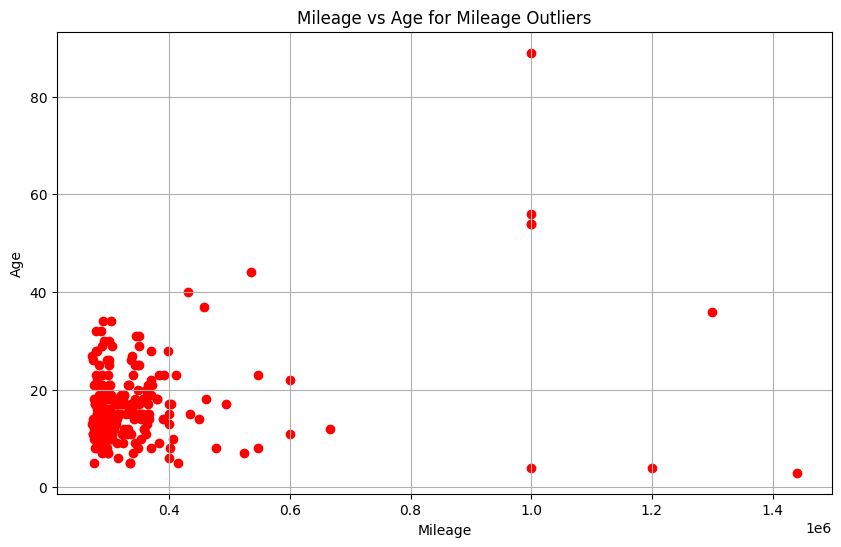

In [1191]:
# Scatter plot between mileage and age for mileage outliers
plt.figure(figsize=(10, 6))
plt.scatter(mileage_outliers['mileage'], mileage_outliers['age'], color='red')
plt.xlabel('Mileage')
plt.ylabel('Age')
plt.title('Mileage vs Age for Mileage Outliers')
plt.grid(True)
plt.show()

In [1192]:
mileage_age = mileage_outliers[(mileage_outliers['mileage'] > 400000) | (mileage_outliers['age'] > 40) ]
mileage_age[['mileage', 'age', 'price', 'make_model']]

,mileage,age,price,make_model
9599,1440000.0,3.0,14400.0,Nissan Micra
12102,1000001.0,4.0,9990.0,Ford Fiesta
13843,1199900.0,4.0,10200.0,SEAT Ibiza
16784,415000.0,5.0,11500.0,Skoda Superb
19554,523992.0,7.0,6600.0,Toyota Avensis
19861,402000.0,8.0,4950.0,Hyundai i40
19993,477000.0,8.0,8000.0,Nissan Evalia
20395,546888.0,8.0,6500.0,Skoda Octavia
21469,406000.0,10.0,3900.0,Opel Corsa
22342,600000.0,11.0,4500.0,Skoda Superb


In [1193]:
outliers_mileage4 = mileage_age.index
outliers_mileage4

Index([ 9599, 12102, 13843, 16784, 19554, 19861, 19993, 20395, 21469, 22342,
       22811, 23252, 23666, 24075, 24551, 24620, 24862, 25594, 25691, 25697,
       26406, 26419, 26466, 26500, 26684, 26685, 26735, 26846],
      dtype='int64')

#### * As seen in the mileage-age scatter plot, outliers are concentrated in the region where mileage is up to 400,000 and age is up to 40, based on the mileage z-score. Therefore, areas outside these ranges are considered outliers.

In [1194]:
# Filter the DataFrame to show rows where age is 0
mileage_age_zero = df[df['age'] == 0]
mileage_age_zero[['mileage', 'age']]

,mileage,age
3,999.0,0.0
4,90.0,0.0
5,1000.0,0.0
6,1000.0,0.0
7,4500.0,0.0
...,...,...
3028,3500.0,0.0
3029,1.0,0.0
3030,15000.0,0.0
3031,20000.0,0.0


In [1195]:
mileage_age_zero.describe()

,price,doors,mileage,seats,engine_size,gears,co2_emissions,cylinders,empty_weight,power_kW,fuel_consumption_comb,age,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore
count,2860.000000,2860.000000,2860.000000,2860.000000,2860.000000,2860.000000,2860.000000,2860.000000,2860.000000,2860.000000,2860.000000,2860.0,2860.0,0.0,2860.000000,2860.000000,2860.000000
mean,38979.516084,4.591259,3074.640402,4.887413,1564.893007,5.893007,114.785315,3.803497,1449.904218,125.400956,5.412414,0.0,5.0,NaN,0.030989,0.608872,-1.009990
std,32119.131049,0.855650,4776.409050,0.764220,765.474236,1.979544,58.785833,1.192193,337.098344,75.744379,2.159649,0.0,0.0,NaN,1.305306,1.266393,0.071156
min,9290.000000,2.000000,0.000000,2.000000,875.000000,1.000000,0.000000,0.000000,562.000000,9.000000,0.600000,0.0,5.0,NaN,-3.195446,-0.561726,-1.055795
25%,22990.000000,5.000000,10.000000,5.000000,999.000000,6.000000,101.000000,3.000000,1220.000000,81.000000,4.400000,0.0,5.0,NaN,0.101540,-0.021562,-1.055646
50%,29525.000000,5.000000,500.000000,5.000000,1461.000000,6.000000,116.000000,4.000000,1374.000000,100.000000,5.200000,0.0,5.0,NaN,0.101540,0.236100,-1.048346
75%,41990.000000,5.000000,5000.000000,5.000000,1659.000000,7.000000,138.000000,4.000000,1594.000000,140.000000,6.021871,0.0,5.0,NaN,0.760938,0.727569,-0.981308
max,696900.000000,6.000000,50340.000000,17.000000,5461.000000,10.000000,394.000000,8.000000,2690.000000,567.000000,33.228571,0.0,5.0,NaN,2.739129,26.549352,-0.305860


In [1196]:
mileage_age_zero1 = mileage_age_zero[mileage_age_zero['mileage'] > 25000][['mileage', 'age', 'type']]
mileage_age_zero1

,mileage,age,type
947,46500.0,0.0,Used
1002,26982.0,0.0,Used
1004,25114.0,0.0,Used
1127,28535.0,0.0,Used
1438,50340.0,0.0,Used
2145,39365.0,0.0,Used
2297,25442.0,0.0,Employee's car
2381,30106.0,0.0,Used
2489,39029.0,0.0,Used
2613,26950.0,0.0,Employee's car


In [1197]:
outliers_mileage7 = mileage_age_zero1.index
outliers_mileage7

Index([947, 1002, 1004, 1127, 1438, 2145, 2297, 2381, 2489, 2613, 2697], dtype='int64')

#### * According to the code, outliers were identified when the mileage of vehicles exceeded 25,000 while their age was recorded as 0. Typically, vehicles do not have such high mileage when they are brand new, hence these entries are considered unusual. Additionally, the presence of vehicles labeled as "Employee's car" alongside those labeled as "Used" in the 'type' column adds complexity to the analysis, indicating potential discrepancies in data recording or classification. Therefore, such entries may warrant further investigation or removal from the dataset.

In [1198]:
mileage_u1000 = df[df['mileage'] < 1000]
mileage_u1000

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore
3,Dacia Break,20500.0,Station wagon,Demonstration,4.0,Yes,999.0,Manual,Benzine,Brown,...,no,Efficient,Advanced,Advanced,Enhanced,5.0,NaN,0.101540,-0.119738,-1.040912
4,Dacia Dokker,16900.0,Station wagon,Used,6.0,Yes,90.0,Manual,LPG,White,...,no,Inefficient,Basic,Basic,Advanced,5.0,NaN,-0.557857,-0.261679,-1.054454
9,Dacia Duster,21590.0,Off-Road/Pick-up,Demonstration,5.0,No,910.0,Manual,Benzine,Grey,...,no,Inefficient,Advanced,Advanced,Enhanced,5.0,NaN,0.101540,-0.076761,-1.042238
11,Dacia Duster,21990.0,Off-Road/Pick-up,Pre-registered,5.0,Yes,7.0,Manual,Benzine,White,...,no,Inefficient,Advanced,Advanced,Advanced,5.0,NaN,0.101540,-0.060990,-1.055690
12,Dacia Duster,23556.0,Off-Road/Pick-up,Pre-registered,5.0,No,10.0,Manual,Diesel,Orange,...,yes,Efficient,Enhanced,Advanced,Advanced,5.0,NaN,0.101540,0.000754,-1.055646
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26773,Ford Mustang,47500.0,Coupe,Used,2.0,No,1.0,Manual,Benzine,Green,...,no,Inefficient,Enhanced,Basic,Advanced,3.0,NaN,-0.557857,0.944818,-1.055780
26800,Fiat 500,15000.0,Convertible,Used,2.0,No,10.0,Manual,Benzine,Grey,...,no,Efficient,Enhanced,Enhanced,Advanced,3.0,NaN,-1.217254,-0.336592,-1.055646
26804,Mercedes-Benz 190,180000.0,Convertible,Used,2.0,No,10.0,Manual,Benzine,Grey,...,no,Efficient,Basic,Advanced,Advanced,3.0,NaN,-1.217254,6.169026,-1.055646
26833,Ford Thunderbird,54000.0,Convertible,Used,2.0,No,1.0,Automatic,Benzine,Blue,...,no,Efficient,Basic,Enhanced,Advanced,4.0,NaN,-1.876651,1.201100,-1.055780


In [1199]:
mileage_u1000.describe()

,price,doors,mileage,seats,engine_size,gears,co2_emissions,cylinders,empty_weight,power_kW,fuel_consumption_comb,age,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore
count,1.887000e+03,1887.000000,1887.000000,1887.000000,1887.000000,1887.000000,1887.000000,1887.000000,1887.000000,1887.000000,1887.000000,1887.000000,1887.000000,0.0,1887.000000,1887.000000,1887.000000
mean,3.285155e+04,4.529942,79.695813,4.840488,1487.134075,5.731849,116.126126,3.661897,1366.817700,109.035616,5.385219,0.852676,5.036566,NaN,-0.075277,0.367259,-1.054607
std,3.624441e+04,0.925673,176.676420,0.791319,773.768107,1.653159,53.384597,1.060295,275.318764,65.348453,1.941307,5.750238,1.435883,NaN,1.090089,1.429044,0.002632
min,1.200000e+03,2.000000,0.000000,1.000000,500.000000,1.000000,0.000000,0.000000,473.000000,1.000000,0.600000,0.000000,2.000000,NaN,-3.195446,-0.880698,-1.055795
25%,2.099000e+04,5.000000,9.000000,5.000000,999.000000,5.000000,103.000000,3.000000,1165.000000,74.000000,4.500000,0.000000,5.000000,NaN,-0.557857,-0.100418,-1.055660
50%,2.679000e+04,5.000000,10.000000,5.000000,1332.000000,6.000000,115.000000,4.000000,1343.000000,96.000000,5.133333,0.000000,5.000000,NaN,0.101540,0.128264,-1.055646
75%,3.488900e+04,5.000000,50.000000,5.000000,1590.500000,6.000000,131.000000,4.000000,1485.000000,116.100000,5.700000,0.000000,5.000000,NaN,0.101540,0.447591,-1.055050
max,1.075900e+06,6.000000,999.000000,17.000000,5409.000000,10.000000,350.000000,8.000000,2560.000000,559.000000,14.650000,122.000000,17.000000,NaN,2.739129,41.492558,-1.040912


In [1200]:
mileage_u1000.groupby('age')['mileage'].value_counts()

age    mileage
0.0    10.0       478
       1.0        119
       100.0       90
       20.0        80
       5.0         77
       15.0        66
       2.0         59
       50.0        59
       12.0        35
       500.0       33
       9.0         31
       150.0       29
       3.0         26
       7.0         22
       99.0        21
       8.0         20
       6.0         17
       0.0         17
       4.0         16
       25.0        11
       11.0        10
       250.0        8
       200.0        8
       16.0         8
       900.0        7
       13.0         7
       800.0        7
       14.0         6
       300.0        6
       30.0         5
       515.0        5
       600.0        4
       35.0         4
       21.0         4
       17.0         4
       650.0        3
       550.0        3
       540.0        3
       990.0        3
       450.0        3
       400.0        3
       18.0         3
       110.0        3
       40.0         2
       910.0     

In [1201]:
# Calculate the Q1 (25th percentile) and Q3 (75th percentile) for mileage within each age group
Q1 = mileage_u1000.groupby('age')['mileage'].quantile(0.25)
Q3 = mileage_u1000.groupby('age')['mileage'].quantile(0.75)

# Calculate the IQR for mileage within each age group
IQR = Q3 - Q1

# Define outlier bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

In [1202]:
# Merge the lower and upper bounds with the mileage_u1000 DataFrame
mileage_u1000 = mileage_u1000.join(lower_bound, on='age', rsuffix='_lower')
mileage_u1000 = mileage_u1000.join(upper_bound, on='age', rsuffix='_upper')

# Filter out the outliers
outlier_mileage_u1000 = mileage_u1000[(mileage_u1000['mileage'] < mileage_u1000['mileage_lower']) | (mileage_u1000['mileage'] > mileage_u1000['mileage_upper'])]
outlier_mileage_u1000

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,mileage_lower,mileage_upper
3,Dacia Break,20500.0,Station wagon,Demonstration,4.0,Yes,999.0,Manual,Benzine,Brown,...,Advanced,Advanced,Enhanced,5.0,NaN,0.101540,-0.119738,-1.040912,-30.000,74.000
4,Dacia Dokker,16900.0,Station wagon,Used,6.0,Yes,90.0,Manual,LPG,White,...,Basic,Basic,Advanced,5.0,NaN,-0.557857,-0.261679,-1.054454,-30.000,74.000
9,Dacia Duster,21590.0,Off-Road/Pick-up,Demonstration,5.0,No,910.0,Manual,Benzine,Grey,...,Advanced,Advanced,Enhanced,5.0,NaN,0.101540,-0.076761,-1.042238,-30.000,74.000
18,Dacia Duster,24949.0,Off-Road/Pick-up,Pre-registered,5.0,No,110.0,Manual,Diesel,Black,...,Advanced,Advanced,Enhanced,5.0,NaN,0.101540,0.055677,-1.054156,-30.000,74.000
19,Dacia Duster,23400.0,Off-Road/Pick-up,Used,4.0,No,500.0,Manual,Benzine,Blue,...,Advanced,Enhanced,Enhanced,5.0,NaN,0.101540,-0.005397,-1.048346,-30.000,74.000
20,Dacia Duster,27128.0,Off-Road/Pick-up,Pre-registered,5.0,No,110.0,Manual,Benzine,Black,...,Advanced,Advanced,Enhanced,5.0,NaN,0.101540,0.141591,-1.054156,-30.000,74.000
25,Dacia Duster,24990.0,Off-Road/Pick-up,Pre-registered,5.0,No,100.0,Manual,Diesel,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,0.057294,-1.054305,-30.000,74.000
27,Dacia Duster,21450.0,Off-Road/Pick-up,Demonstration,5.0,No,100.0,Manual,Benzine,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,-0.082281,-1.054305,-30.000,74.000
33,Dacia Duster,23899.0,Off-Road/Pick-up,Pre-registered,5.0,No,150.0,Automatic,Benzine,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,0.014278,-1.053560,-30.000,74.000
35,Dacia Duster,24700.0,Off-Road/Pick-up,Pre-registered,5.0,No,100.0,Manual,Diesel,Red,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,0.045860,-1.054305,-30.000,74.000


In [1203]:
outliers_mileage8 = outlier_mileage_u1000.index
outliers_mileage8

Index([    3,     4,     9,    18,    19,    20,    25,    27,    33,    35,
       ...
        5346,  5718,  5738,  6110,  6450,  7950,  7951, 10327, 15361, 16419],
      dtype='int64', length=349)

#### * This code identifies outliers within the subset of vehicles where the mileage is less than 1000. Outliers are determined based on the interquartile range (IQR) method applied within each age group. If the mileage of a vehicle falls outside of the lower or upper bound defined by 1.5 times the IQR below the first quartile (Q1) or above the third quartile (Q3), respectively, it is considered an outlier. This process helps flag unusual mileage values within each age group, which might indicate data errors, inaccurate recording, or other anomalies in the dataset.

## Relationship between Mileage and Price

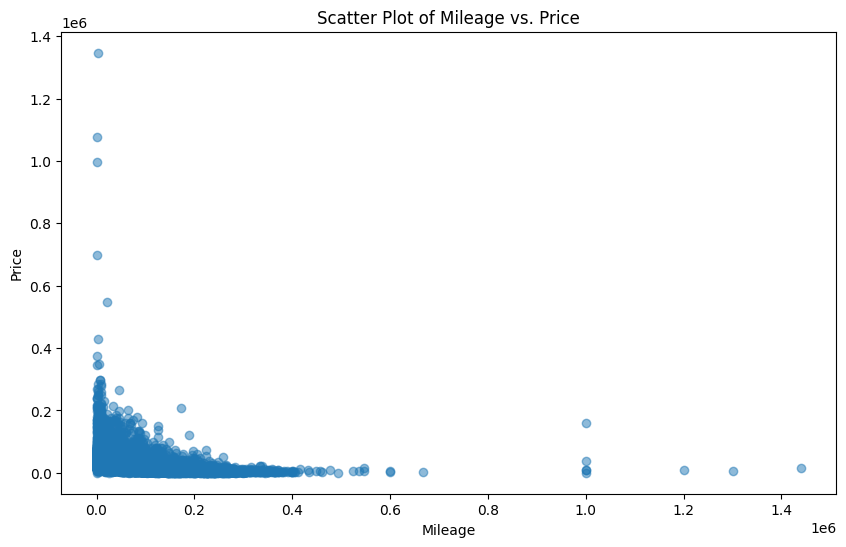

In [1204]:
# Scatter plot of mileage vs. price
plt.figure(figsize=(10, 6))
plt.scatter(df['mileage'], df['price'], alpha=0.5)
plt.title('Scatter Plot of Mileage vs. Price')
plt.xlabel('Mileage')
plt.ylabel('Price')
plt.show()

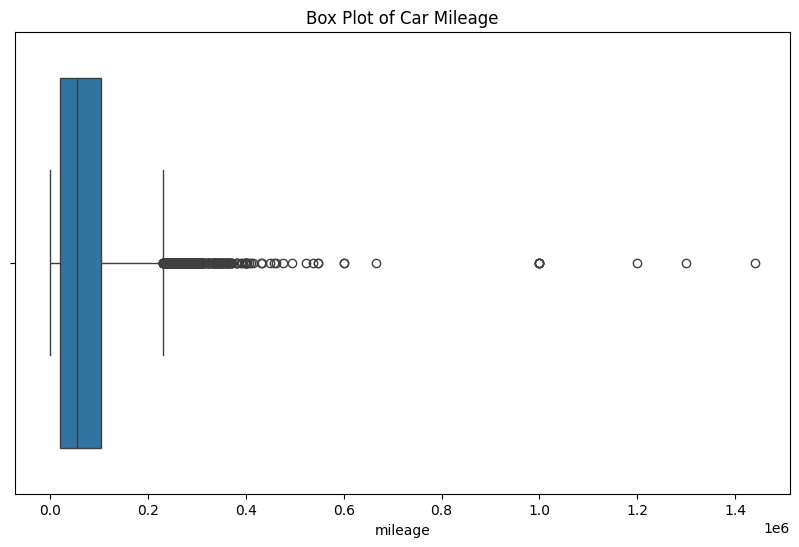

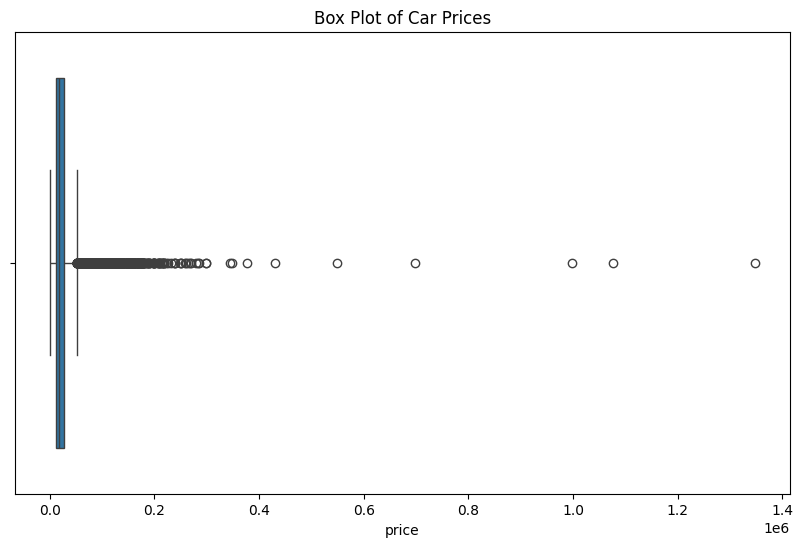

In [1205]:
# Box plot for mileage
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['mileage'])
plt.title('Box Plot of Car Mileage')
plt.show()

# Box plot for price
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['price'])
plt.title('Box Plot of Car Prices')
plt.show()

In [1206]:
# Calculate Z-scores
df['mileage_zscore'] = stats.zscore(df['mileage'])
df['price_zscore'] = stats.zscore(df['price'])

# Identify outliers
out_mileage_price = df[(np.abs(df['mileage_zscore']) > 3) & (np.abs(df['price_zscore']) > 3) | (np.abs(df['mileage_zscore']) < -3) & (np.abs(df['price_zscore']) < -3)]
out_mileage_price[['mileage', 'age', 'price', 'make_model']]

,mileage,age,price,make_model
26846,999999.0,89.0,159000.0,Fiat


In [1207]:
outliers_mileage5 = out_mileage_price.index
outliers_mileage5

Index([26846], dtype='int64')

#### * The `out_mileage_price` variable contains the rows where the absolute value of either the mileage z-score or the price z-score is greater than 3, or the absolute value of both z-scores is less than -3. These rows are considered outliers because their mileage and/or price values deviate significantly from the mean, indicating they are unusual or extreme cases in the dataset.

In [1208]:
df.groupby('mileage')['age'].value_counts()

mileage    age 
0.0        0.0      17
           1.0       5
           5.0       1
1.0        0.0     119
           1.0      32
                  ... 
1000000.0  54.0      1
1000001.0  4.0       1
1199900.0  4.0       1
1300000.0  36.0      1
1440000.0  3.0       1
Name: count, Length: 18570, dtype: int64

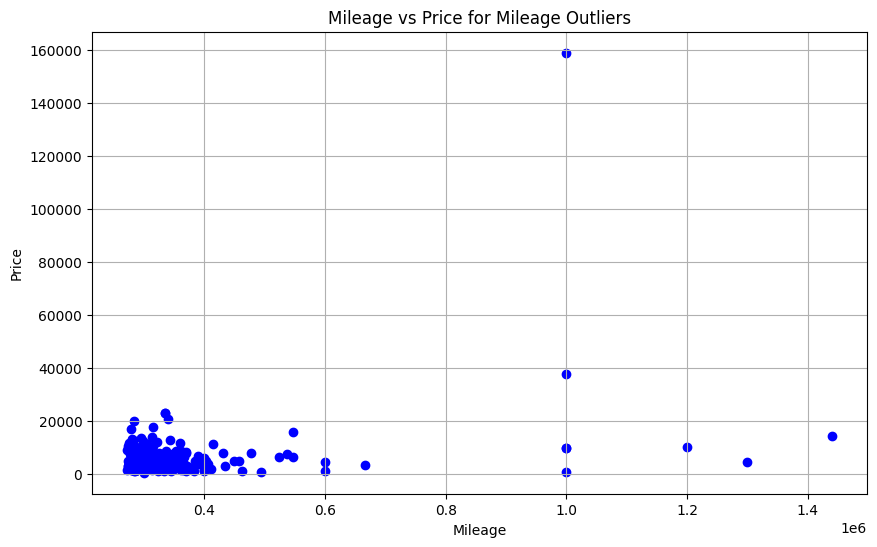

In [1209]:
# Scatter plot between mileage and price for mileage outliers
plt.figure(figsize=(10, 6))
plt.scatter(mileage_outliers['mileage'], mileage_outliers['price'], color='blue')
plt.xlabel('Mileage')
plt.ylabel('Price')
plt.title('Mileage vs Price for Mileage Outliers')
plt.grid(True)
plt.show()

In [1210]:
outliers_mileage_price = mileage_outliers[(mileage_outliers['mileage'] > 200000) & (mileage_outliers['price'] > 20000) ]
outliers_mileage_price[['mileage', 'age', 'price', 'make_model']]

,mileage,age,price,make_model
16878,335000.0,5.0,22990.0,Toyota Land Cruiser
16883,335000.0,5.0,22990.0,Toyota Land Cruiser
26015,339000.0,27.0,21000.0,Toyota MR 2
26735,999999.0,56.0,37990.0,Ford Mustang
26846,999999.0,89.0,159000.0,Fiat


In [1211]:
outliers_mileage6 = outliers_mileage_price.index
outliers_mileage6

Index([16878, 16883, 26015, 26735, 26846], dtype='int64')

#### * The `outliers_mileage_price` variable contains the rows from the mileage outliers where both the mileage is greater than 200,000 and the price is greater than 20,000. These rows are considered outliers because they represent cases where the vehicles have exceptionally high mileage and are still priced significantly high, making them unusual or extreme in the dataset.

## 3. Doors

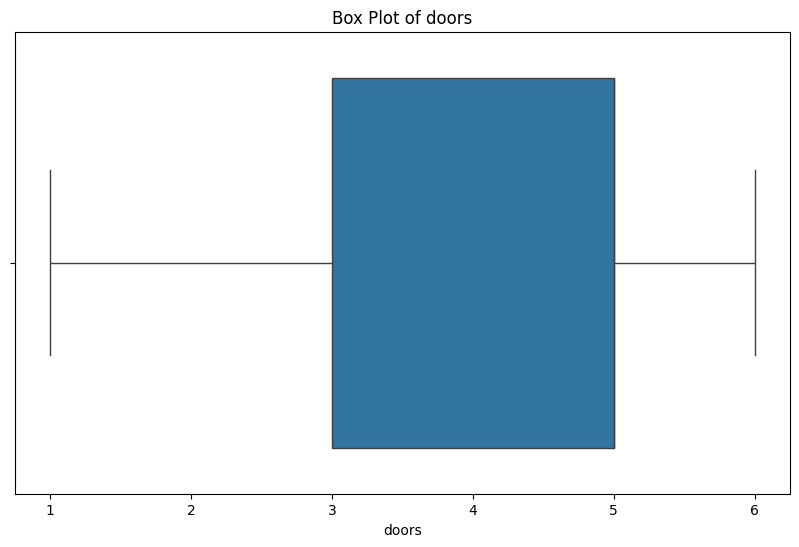

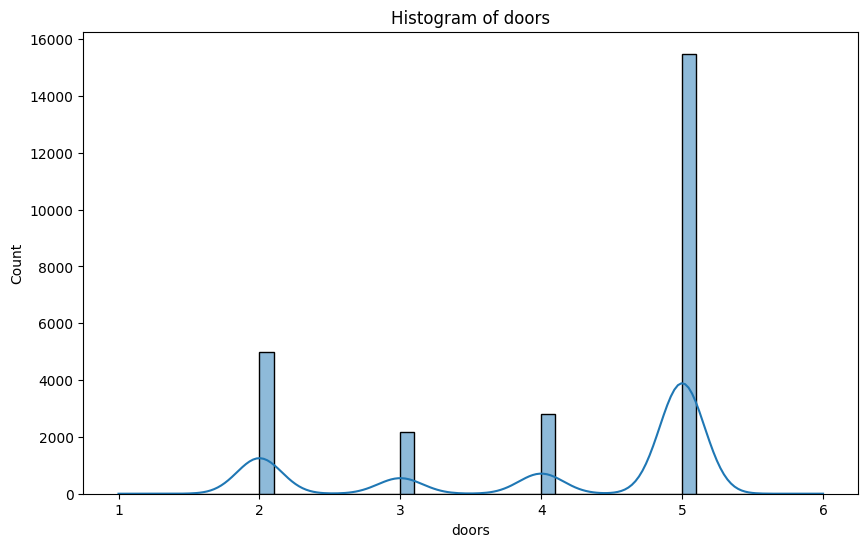

In [1212]:
# Box plot for doors
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['doors'])
plt.title('Box Plot of doors')
plt.show()

# Histogram for doors
plt.figure(figsize=(10, 6))
sns.histplot(df['doors'], bins=50, kde=True)
plt.title('Histogram of doors')
plt.show()

In [1213]:
df.doors.value_counts()

doors
5.0    15486
2.0     4982
4.0     2818
3.0     2181
6.0        5
1.0        2
Name: count, dtype: int64

In [1214]:
df[df['doors'] == 6.0].sample(5)

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore
4,Dacia Dokker,16900.0,Station wagon,Used,6.0,Yes,90.0,Manual,LPG,White,...,no,Inefficient,Basic,Basic,Advanced,5.0,NaN,-0.557857,-0.261679,-1.054454
23296,Dacia Logan,1700.0,Station wagon,Used,6.0,No,144043.0,Manual,Benzine,Blue,...,no,Inefficient,Enhanced,Basic,Advanced,4.0,NaN,-0.557857,-0.860984,1.090071
22418,Dacia Logan,3000.0,Station wagon,Used,6.0,No,258000.0,Manual,Diesel,Grey,...,no,Inefficient,Basic,Advanced,Advanced,3.0,NaN,-0.557857,-0.809728,2.787734
22415,Dacia Logan,2700.0,Station wagon,Used,6.0,No,210877.0,Manual,Diesel,Black,...,no,Inefficient,Basic,Advanced,Advanced,2.0,NaN,-0.557857,-0.821556,2.085724
21212,Dacia Logan,5950.0,Station wagon,Used,6.0,No,173000.0,Manual,Diesel,Bronze,...,no,Inefficient,Enhanced,Basic,Advanced,2.0,NaN,-0.557857,-0.693415,1.521455


In [1215]:
# Identify the rows where 'doors' values are outside the range of 2 to 5
doors_range = df[(df['doors'] < 2) | (df['doors'] > 5)]
doors_range

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,inspection_status,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore
4,Dacia Dokker,16900.0,Station wagon,Used,6.0,Yes,90.0,Manual,LPG,White,...,no,Inefficient,Basic,Basic,Advanced,5.0,NaN,-0.557857,-0.261679,-1.054454
15258,Ford Fiesta,11790.0,Compact,Used,1.0,Yes,14600.0,Manual,Benzine,Grey,...,no,Efficient,Enhanced,Enhanced,Advanced,2.0,NaN,0.101540,-0.463156,-0.838293
21212,Dacia Logan,5950.0,Station wagon,Used,6.0,No,173000.0,Manual,Diesel,Bronze,...,no,Inefficient,Enhanced,Basic,Advanced,2.0,NaN,-0.557857,-0.693415,1.521455
22415,Dacia Logan,2700.0,Station wagon,Used,6.0,No,210877.0,Manual,Diesel,Black,...,no,Inefficient,Basic,Advanced,Advanced,2.0,NaN,-0.557857,-0.821556,2.085724
22418,Dacia Logan,3000.0,Station wagon,Used,6.0,No,258000.0,Manual,Diesel,Grey,...,no,Inefficient,Basic,Advanced,Advanced,3.0,NaN,-0.557857,-0.809728,2.787734
23296,Dacia Logan,1700.0,Station wagon,Used,6.0,No,144043.0,Manual,Benzine,Blue,...,no,Inefficient,Enhanced,Basic,Advanced,4.0,NaN,-0.557857,-0.860984,1.090071
26692,Fiat 124 Spider,19000.0,Convertible,Used,1.0,No,48500.0,Manual,Benzine,Red,...,no,Inefficient,Basic,Advanced,Enhanced,2.0,NaN,-0.557857,-0.178880,-0.333271


In [1216]:
outliers_doors = doors_range.index
outliers_doors

Index([4, 15258, 21212, 22415, 22418, 23296, 26692], dtype='int64')

#### * The `doors_range` variable contains the rows where the number of doors is either less than 2 or greater than 5. These rows are considered outliers because vehicles with fewer than 2 doors or more than 5 doors are unusual or extreme cases, deviating from the typical range of door counts in the dataset.

## Cylinders

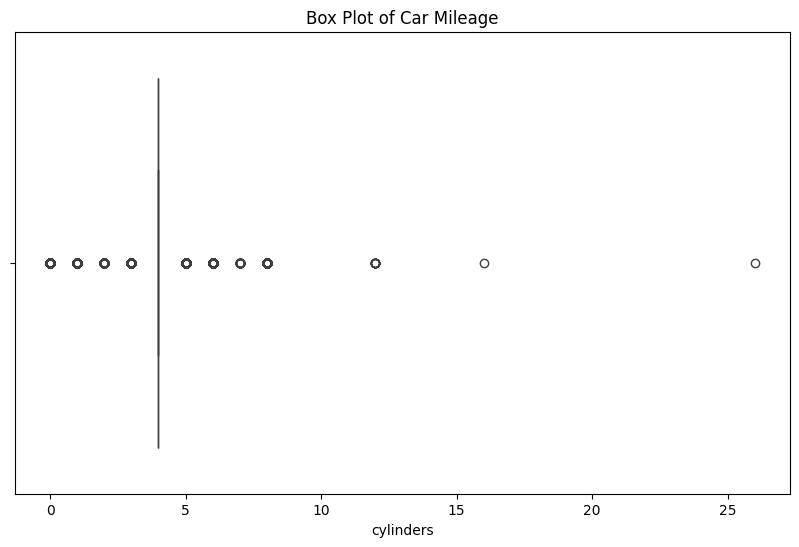

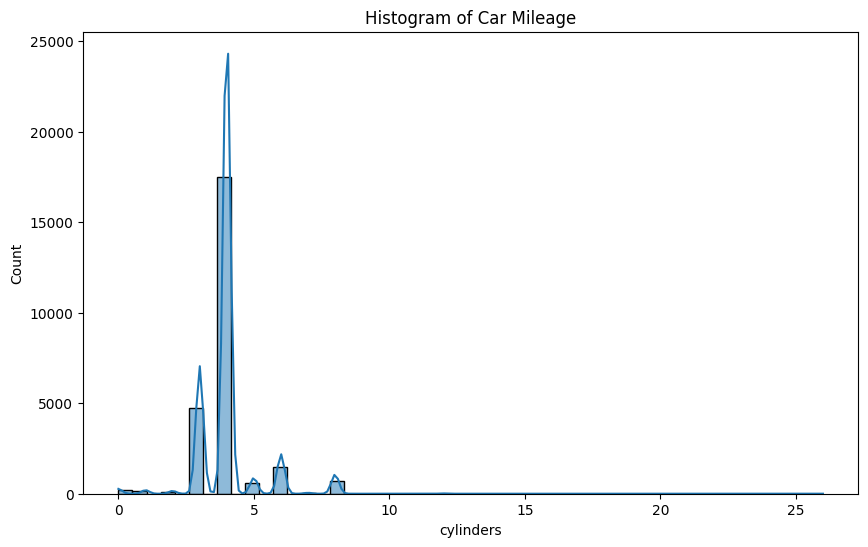

In [1217]:
# Box plot for mileage
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['cylinders'])
plt.title('Box Plot of Car Mileage')
plt.show()

# Histogram for mileage
plt.figure(figsize=(10, 6))
sns.histplot(df['cylinders'], bins=50, kde=True)
plt.title('Histogram of Car Mileage')
plt.show()

In [1218]:
df.cylinders.describe()

count    25474.000000
mean         4.021512
std          1.063858
min          0.000000
25%          4.000000
50%          4.000000
75%          4.000000
max         26.000000
Name: cylinders, dtype: float64

In [1219]:
# Find the row with the minimum cylinders
max_cylinders_row = df[df['cylinders'] == df['cylinders'].max()]
max_cylinders_row[['make_model', 'cylinders', 'power_kW', 'engine_size', 'co2_emissions', 'fuel_consumption_comb', 'empty_weight', 'body_type']]

,make_model,cylinders,power_kW,engine_size,co2_emissions,fuel_consumption_comb,empty_weight,body_type
21011,Renault Megane,26.0,12.0,1998.0,183.0,7.520714,1374.0,Coupe


In [1220]:
outliers_cylinders = max_cylinders_row.index
outliers_cylinders

Index([21011], dtype='int64')

#### * The row for the "Renault Megane" model with 26 cylinders and other corresponding attributes is considered an outlier due to the exceptionally high number of cylinders. Having 26 cylinders is highly uncommon and impractical for a passenger vehicle, deviating significantly from the typical range of cylinder counts seen in the dataset. This makes it an extreme and unusual case, thus classified as an outlier.

In [1221]:
# Calculate Z-scores for mileage
df['cylinders_zscore'] = stats.zscore(df['cylinders'])

# Define a threshold for Z-score, typically 3 or -3
threshold = 3

# Identify mileage outliers for both positive and negative thresholds
cylinders_outliers = df[(np.abs(df['cylinders_zscore']) > threshold) | (df['cylinders_zscore'] < -threshold)]
print(f"Number of mileage outliers detected: {len(cylinders_outliers)}")

# Display the mileage outliers
cylinders_outliers

Number of mileage outliers detected: 910


,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore
485,Fiat 500e,31900.0,Convertible,Pre-registered,2.0,Yes,10.0,Automatic,Electric,Blue,...,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446,0.329741,-1.055646,-3.780194
491,Fiat 500e,29550.0,Sedan,Pre-registered,3.0,Yes,1.0,Automatic,Electric,Blue,...,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446,0.237085,-1.055780,-3.780194
493,Fiat 500e,26400.0,Sedan,Used,3.0,Yes,2500.0,Automatic,Electric,White,...,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446,0.112887,-1.018551,-3.780194
494,Fiat 500e,25400.0,Sedan,Pre-registered,3.0,Yes,10.0,Automatic,Electric,Grey,...,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446,0.073459,-1.055646,-3.780194
495,Fiat 500e,30900.0,Sedan,Pre-registered,3.0,Yes,10.0,Automatic,Electric,Blue,...,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446,0.290313,-1.055646,-3.780194
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26847,Ford V8,40000.0,Convertible,Used,2.0,No,15000.0,Manual,Benzine,Black,...,Efficient,Enhanced,Enhanced,Enhanced,3.0,NaN,-1.876651,0.649108,-0.832334,3.739751
26848,Ford V8,54990.0,Convertible,Used,2.0,No,25600.0,Automatic,Benzine,Red,...,Efficient,Enhanced,Enhanced,Enhanced,3.0,NaN,-1.876651,1.240133,-0.674421,3.739751
26849,Ford V8,49900.0,Convertible,Used,2.0,No,3500.0,Automatic,Benzine,Black,...,Efficient,Enhanced,Enhanced,Enhanced,3.0,NaN,-1.876651,1.039445,-1.003654,3.739751
26850,Ford Roadster,40000.0,Convertible,Used,2.0,No,60000.0,Manual,Benzine,Black,...,Efficient,Enhanced,Basic,Enhanced,3.0,NaN,-1.876651,0.649108,-0.161951,3.739751


In [1222]:
df.cylinders.value_counts()

cylinders
4.0     17478
3.0      4752
6.0      1473
8.0       717
5.0       590
0.0       180
1.0       134
2.0       103
7.0        34
12.0       11
26.0        1
16.0        1
Name: count, dtype: int64

[Types of Car Engines](https://www.spinny.com/blog/index.php/types-of-car-engines/)

In [1223]:
df[df['fuel_type'] == 'Electric']

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore
280,Dacia Spring,18490.0,Off-Road/Pick-up,Used,5.0,No,5800.0,Automatic,Electric,Silver,...,Efficient,Advanced,Advanced,Advanced,5.0,NaN,-3.195446,-0.198988,-0.969390,-2.840201
281,Dacia Spring,22980.0,Off-Road/Pick-up,Demonstration,5.0,No,5000.0,Automatic,Electric,White,...,Efficient,Enhanced,Enhanced,Advanced,5.0,NaN,-3.195446,-0.021957,-0.981308,-2.840201
282,Dacia Spring,21599.0,Sedan,Employee's car,5.0,No,500.0,Automatic,Electric,Red,...,Efficient,Advanced,Enhanced,Advanced,5.0,NaN,-3.195446,-0.076407,-1.048346,-2.840201
283,Dacia Spring,21599.0,Sedan,Employee's car,5.0,No,500.0,Automatic,Electric,Blue,...,Efficient,Advanced,Enhanced,Advanced,5.0,NaN,-3.195446,-0.076407,-1.048346,-2.840201
284,Dacia Spring,21599.0,Sedan,Employee's car,5.0,No,500.0,Automatic,Electric,Blue,...,Efficient,Advanced,Enhanced,Advanced,5.0,NaN,-3.195446,-0.076407,-1.048346,-2.840201
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23233,Toyota Prius,11400.0,Compact,Used,5.0,No,124987.0,Automatic,Electric,Silver,...,Efficient,Enhanced,Advanced,Advanced,2.0,NaN,-3.195446,-0.478533,0.806187,-0.020221
23234,Toyota Prius,11950.0,Compact,Used,5.0,No,87775.0,Automatic,Electric,Black,...,Efficient,Advanced,Advanced,Enhanced,2.0,NaN,-3.195446,-0.456847,0.251825,-0.020221
23235,Toyota Prius,14690.0,Sedan,Used,5.0,Yes,81700.0,Automatic,Electric,Black,...,Efficient,Advanced,Advanced,Advanced,2.0,NaN,-3.195446,-0.348815,0.161323,-0.020221
23236,Toyota Prius+,13490.0,Sedan,Used,5.0,No,96057.0,Automatic,Electric,Black,...,Efficient,Advanced,Advanced,Advanced,3.0,NaN,0.101540,-0.396128,0.375205,-0.960214


In [1224]:
cylinders0 = df[df['cylinders'] == 0.0][['make_model', 'cylinders', 'power_kW', 'engine_size', 
                                         'co2_emissions', 'fuel_consumption_comb', 'empty_weight',
                                         'body_type', 'fuel_type']]
cylinders0

,make_model,cylinders,power_kW,engine_size,co2_emissions,fuel_consumption_comb,empty_weight,body_type,fuel_type
485,Fiat 500e,0.0,87.000000,1000.0,0.0,3.447727,1370.000000,Convertible,Electric
491,Fiat 500e,0.0,43.000000,1000.0,0.0,3.447727,1370.000000,Sedan,Electric
493,Fiat 500e,0.0,43.000000,1000.0,0.0,3.447727,1370.000000,Sedan,Electric
494,Fiat 500e,0.0,43.000000,1000.0,0.0,3.447727,1370.000000,Sedan,Electric
495,Fiat 500e,0.0,87.000000,1000.0,0.0,3.447727,1370.000000,Sedan,Electric
498,Fiat 500e,0.0,43.000000,1000.0,0.0,3.447727,1370.000000,Sedan,Electric
764,Ford Mustang Mach-E,0.0,198.000000,2330.0,0.0,3.447727,2086.000000,Coupe,Electric
765,Ford Mustang Mach-E,0.0,258.000000,1000.0,0.0,3.447727,2218.000000,Off-Road/Pick-up,Electric
766,Ford Mustang Mach-E,0.0,198.000000,1000.0,0.0,3.447727,2086.000000,Off-Road/Pick-up,Electric
767,Ford Mustang Mach-E,0.0,198.000000,1000.0,0.0,3.447727,2257.000000,Off-Road/Pick-up,Electric


In [1225]:
cylinders0[cylinders0['fuel_type'] != 'Electric']

,make_model,cylinders,power_kW,engine_size,co2_emissions,fuel_consumption_comb,empty_weight,body_type,fuel_type
6539,Hyundai i30,0.0,202.0,1998.0,183.0,6.373894,1386.0,Sedan,Benzine
15587,Mercedes-Benz AMG GT,0.0,340.0,3982.0,216.0,9.300000,1615.0,Coupe,Benzine
22715,Peugeot RCZ,0.0,115.0,1598.0,155.0,6.700000,1333.0,Coupe,Benzine
24091,Fiat Punto,0.0,48.0,1242.0,140.0,5.900000,1090.0,Coupe,Benzine
25751,Hyundai Excel,0.0,65.0,1495.0,0.0,6.698559,905.0,Coupe,Benzine
26486,Mercedes-Benz SL 280,0.0,136.0,2717.0,0.0,6.698559,1690.0,Convertible,Benzine
26692,Fiat 124 Spider,0.0,65.0,1400.0,80.0,6.425641,1081.0,Convertible,Benzine


In [1226]:
outliers_cylenders2 = cylinders0[cylinders0['fuel_type'] != 'Electric'].index
outliers_cylenders2

Index([6539, 15587, 22715, 24091, 25751, 26486, 26692], dtype='int64')

#### * The `outliers_cylinders2` variable contains the rows where the cylinder count is 0. Since the vehicles with 0 cylinders are expected to be electric cars, any non-electric vehicle with 0 cylinders is considered an outlier. This is because non-electric vehicles typically have a positive cylinder count, and a 0-cylinder configuration would be unusual and impractical for them, thus classified as an outlier.

In [1227]:
cylinders1 = df[df['cylinders'] == 1.0][['make_model', 'cylinders', 'power_kW', 'engine_size', 
                                         'co2_emissions', 'fuel_consumption_comb', 'empty_weight',
                                         'body_type', 'fuel_type']]
cylinders1

,make_model,cylinders,power_kW,engine_size,co2_emissions,fuel_consumption_comb,empty_weight,body_type,fuel_type
280,Dacia Spring,1.0,32.000000,1000.0,0.0,3.447727,1037.0,Off-Road/Pick-up,Electric
281,Dacia Spring,1.0,33.000000,1000.0,0.0,3.447727,1045.0,Off-Road/Pick-up,Electric
282,Dacia Spring,1.0,33.000000,1000.0,0.0,3.447727,1037.0,Sedan,Electric
283,Dacia Spring,1.0,33.000000,1000.0,0.0,3.447727,1037.0,Sedan,Electric
284,Dacia Spring,1.0,33.000000,1000.0,0.0,3.447727,1037.0,Sedan,Electric
285,Dacia Spring,1.0,33.000000,1000.0,0.0,3.447727,1037.0,Sedan,Electric
286,Dacia Spring,1.0,33.000000,1000.0,0.0,3.447727,1037.0,Sedan,Electric
287,Dacia Spring,1.0,33.000000,1000.0,0.0,3.447727,1037.0,Sedan,Electric
288,Dacia Spring,1.0,18.000000,1000.0,0.0,3.447727,1012.0,Sedan,Electric
468,Fiat 500e,1.0,87.000000,1000.0,0.0,3.447727,1365.0,Compact,Electric


In [1228]:
cylinders1['make_model'].unique()

array(['Dacia Spring', 'Fiat 500e', 'Hyundai IONIQ 5',
       'Mercedes-Benz EQA', 'Mercedes-Benz EQB 350',
       'Mercedes-Benz EQC 400', 'Renault Twizy', 'Hyundai IONIQ',
       'Nissan E-NV200', 'Nissan Leaf', 'Renault ZOE', 'Renault R 5'],
      dtype=object)

[Dacia Spring](https://ev-database.org/car/1319/Dacia-Spring-Electric)

[RENAULT TWIZY](https://blog.renault.de/neues-von-renault-so-funktioniert-das-elektroauto-twizy-und-das-aufladen/)

In [1229]:
indices = df[(df['cylinders'] == 1) & (df['fuel_type'] == 'Electric')].index
indices

Index([  280,   281,   282,   283,   284,   285,   286,   287,   288,   468,
       ...
       15837, 16531, 18137, 18138, 19386, 19752, 20302, 21656, 21657, 21658],
      dtype='int64', length=133)

In [1230]:
df.loc[indices, 'cylinders'] = 0

In [1231]:
indices

Index([  280,   281,   282,   283,   284,   285,   286,   287,   288,   468,
       ...
       15837, 16531, 18137, 18138, 19386, 19752, 20302, 21656, 21657, 21658],
      dtype='int64', length=133)

In [1232]:
cylinders1

,make_model,cylinders,power_kW,engine_size,co2_emissions,fuel_consumption_comb,empty_weight,body_type,fuel_type
280,Dacia Spring,1.0,32.000000,1000.0,0.0,3.447727,1037.0,Off-Road/Pick-up,Electric
281,Dacia Spring,1.0,33.000000,1000.0,0.0,3.447727,1045.0,Off-Road/Pick-up,Electric
282,Dacia Spring,1.0,33.000000,1000.0,0.0,3.447727,1037.0,Sedan,Electric
283,Dacia Spring,1.0,33.000000,1000.0,0.0,3.447727,1037.0,Sedan,Electric
284,Dacia Spring,1.0,33.000000,1000.0,0.0,3.447727,1037.0,Sedan,Electric
285,Dacia Spring,1.0,33.000000,1000.0,0.0,3.447727,1037.0,Sedan,Electric
286,Dacia Spring,1.0,33.000000,1000.0,0.0,3.447727,1037.0,Sedan,Electric
287,Dacia Spring,1.0,33.000000,1000.0,0.0,3.447727,1037.0,Sedan,Electric
288,Dacia Spring,1.0,18.000000,1000.0,0.0,3.447727,1012.0,Sedan,Electric
468,Fiat 500e,1.0,87.000000,1000.0,0.0,3.447727,1365.0,Compact,Electric


In [1233]:
outliers_cylenders3 = cylinders1[cylinders1['fuel_type'] == 'Electric'].index
outliers_cylenders3

Index([  280,   281,   282,   283,   284,   285,   286,   287,   288,   468,
       ...
       15837, 16531, 18137, 18138, 19386, 19752, 20302, 21656, 21657, 21658],
      dtype='int64', length=133)

In [1234]:
df[(df['cylinders'] == 1) & (df['fuel_type'] == 'Electric')]

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,energy_efficiency_class,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore


In [1235]:
cylinders6 = df[df['cylinders'] == 6.0][['make_model', 'cylinders', 'power_kW', 'engine_size', 
                                         'co2_emissions', 'fuel_consumption_comb', 'empty_weight',
                                         'body_type']]
cylinders6

,make_model,cylinders,power_kW,engine_size,co2_emissions,fuel_consumption_comb,empty_weight,body_type
32,Dacia Duster,6.0,85.133333,1461.0,106.0,4.584946,1305.0,Off-Road/Pick-up
34,Dacia Duster,6.0,85.133333,1461.0,106.0,4.584946,1305.0,Off-Road/Pick-up
40,Dacia Duster,6.0,85.133333,1461.0,106.0,4.584946,1305.0,Off-Road/Pick-up
43,Dacia Duster,6.0,85.133333,1461.0,106.0,4.584946,1305.0,Off-Road/Pick-up
48,Dacia Duster,6.0,85.133333,1461.0,106.0,4.584946,1305.0,Off-Road/Pick-up
...,...,...,...,...,...,...,...,...
26798,Fiat,6.0,77.000000,2279.0,152.0,8.900000,1285.0,Coupe
26805,Mercedes-Benz 220,6.0,120.000000,2180.0,0.0,6.698559,1390.0,Coupe
26806,Ford T-Bird,6.0,221.000000,2191.0,131.0,6.698559,1444.0,Convertible
26824,Mercedes-Benz 220,6.0,78.000000,2200.0,108.0,6.698559,1390.0,Convertible


In [1236]:
cylinders6['make_model'].unique()

array(['Dacia Duster', 'Ford Bronco', 'Ford Explorer', 'Ford F 150',
       'Ford F 150 V6', 'Ford Mustang', 'Mercedes-Benz ',
       'Mercedes-Benz  S 580e', 'Mercedes-Benz AMG GT',
       'Mercedes-Benz AMG GT V8', 'Mercedes-Benz C 400',
       'Mercedes-Benz C 43 AMG', 'Mercedes-Benz CLS 400',
       'Mercedes-Benz CLS 450', 'Mercedes-Benz CLS 53 AMG',
       'Mercedes-Benz E 400', 'Mercedes-Benz E 450',
       'Mercedes-Benz E 53 AMG', 'Mercedes-Benz EQB 350',
       'Mercedes-Benz EQE 350', 'Mercedes-Benz EQE 43',
       'Mercedes-Benz EQS', 'Mercedes-Benz G 400',
       'Mercedes-Benz GLC 400', 'Mercedes-Benz GLC 43 AMG',
       'Mercedes-Benz GLE 400', 'Mercedes-Benz GLE 53 AMG',
       'Mercedes-Benz GLS 400', 'Mercedes-Benz S 350',
       'Mercedes-Benz S 400', 'Mercedes-Benz S 580',
       'Toyota Land Cruiser', 'Toyota Supra', 'Mercedes-Benz E 50 AMG',
       'Mercedes-Benz EQA 250', 'Mercedes-Benz GLB 180',
       'Mercedes-Benz GLE 350', 'Mercedes-Benz S 500',
       'Merc

In [1237]:
# cylinders6[cylinders6['make_model'] == 'Dacia Duster', 'Fiat Coupe']

In [1238]:
cylinders16 = df[df['cylinders'] == 16.0][['make_model', 'cylinders', 'power_kW', 'engine_size', 
                                         'co2_emissions', 'fuel_consumption_comb', 'empty_weight',
                                         'body_type', 'fuel_type']]
cylinders16

,make_model,cylinders,power_kW,engine_size,co2_emissions,fuel_consumption_comb,empty_weight,body_type,fuel_type
24729,Hyundai Matrix,16.0,77.0,1599.0,183.0,6.698559,1359.0,Sedan,Benzine


In [1239]:
outliers_cylenders5 = cylinders16[cylinders16['cylinders'] == 16.0].index
outliers_cylenders5

Index([24729], dtype='int64')

In [1240]:
cylinders26 = df[df['cylinders'] == 26.0][['make_model', 'cylinders', 'power_kW', 'engine_size', 
                                         'co2_emissions', 'fuel_consumption_comb', 'empty_weight',
                                         'body_type', 'fuel_type']]
cylinders26

,make_model,cylinders,power_kW,engine_size,co2_emissions,fuel_consumption_comb,empty_weight,body_type,fuel_type
21011,Renault Megane,26.0,12.0,1998.0,183.0,7.520714,1374.0,Coupe,Benzine


In [1241]:
outliers_cylenders6 = cylinders26[cylinders26['cylinders'] == 26.0].index
outliers_cylenders6

Index([21011], dtype='int64')

# Categorical Data Analysis

## 4. Make_Model

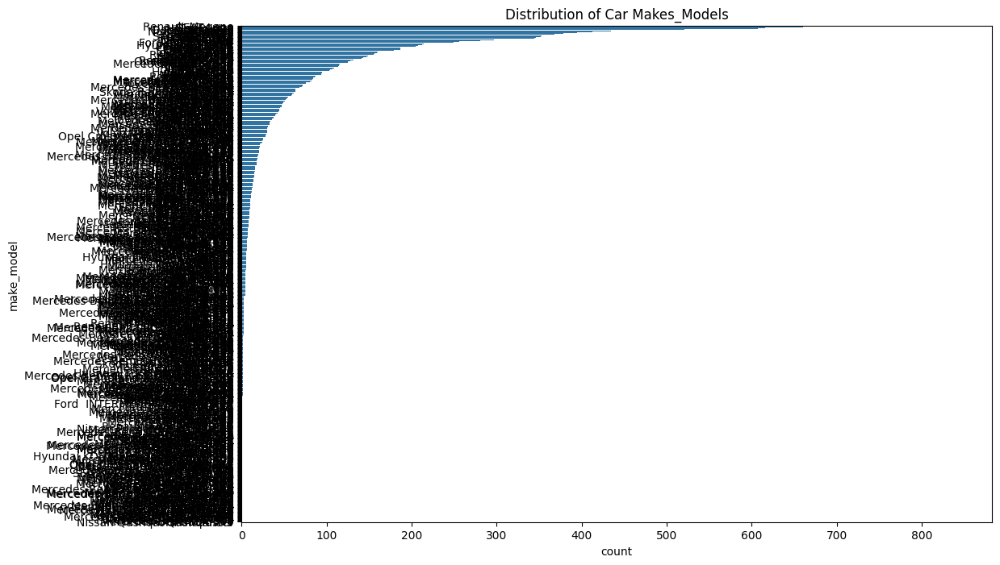

In [1242]:
# Count plot for car make_models
plt.figure(figsize=(12, 8))
sns.countplot(y=df['make_model'], order=df['make_model'].value_counts().index)
plt.title('Distribution of Car Makes_Models')
plt.show()

## Plotting the Top N Most Frequent Car Models

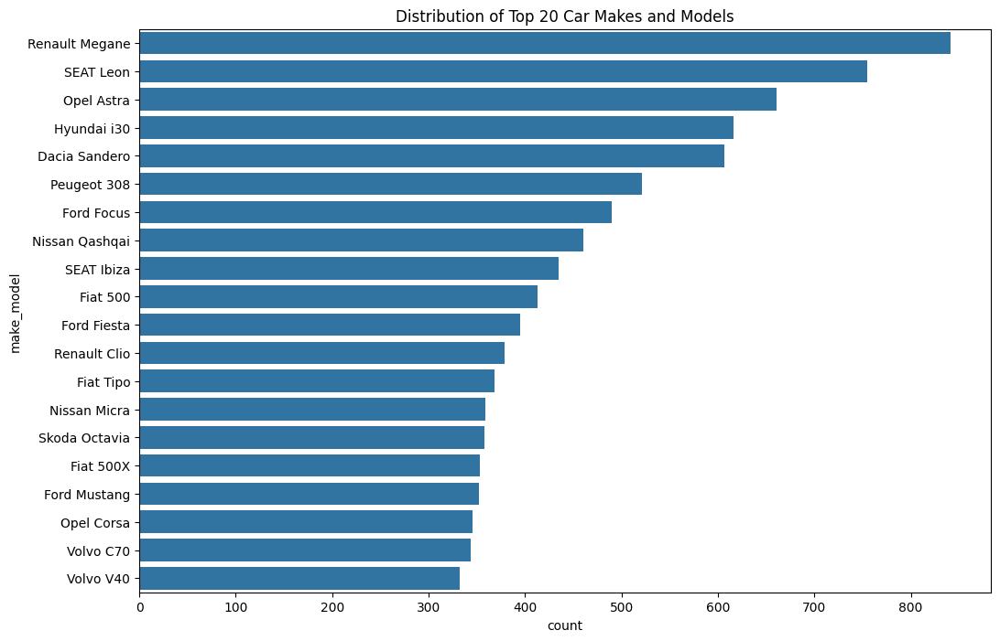

In [1243]:
# Get the top 20 most frequent car models
top_n = 20
top_models = df['make_model'].value_counts().nlargest(top_n).index

# Filter the dataset to include only the top N models
filtered_data = df[df['make_model'].isin(top_models)]

# Count plot for the top N car models
plt.figure(figsize=(12, 8))
sns.countplot(y=filtered_data['make_model'], order=filtered_data['make_model'].value_counts().index)
plt.title('Distribution of Top 20 Car Makes and Models')
plt.show()

## Grouping by Car Make

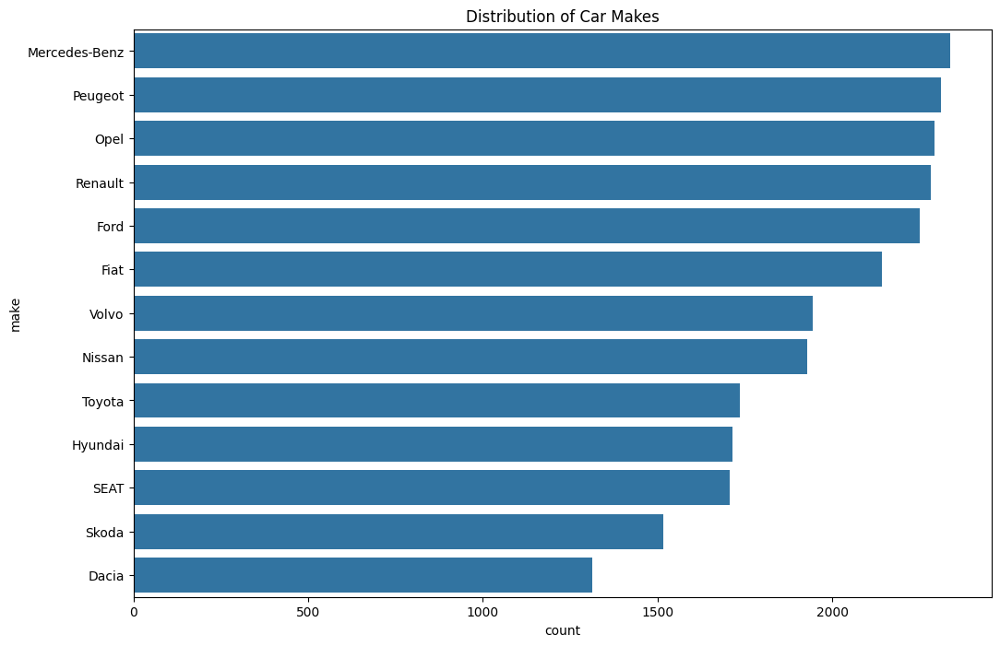

In [1244]:
# Extract car make from make_model (assuming the format is 'Make Model')
df['make'] = df['make_model'].apply(lambda x: x.split()[0])

# Count plot for car makes
plt.figure(figsize=(12, 8))
sns.countplot(y=df['make'], order=df['make'].value_counts().index)
plt.title('Distribution of Car Makes')
plt.show()

## 5. Body Type

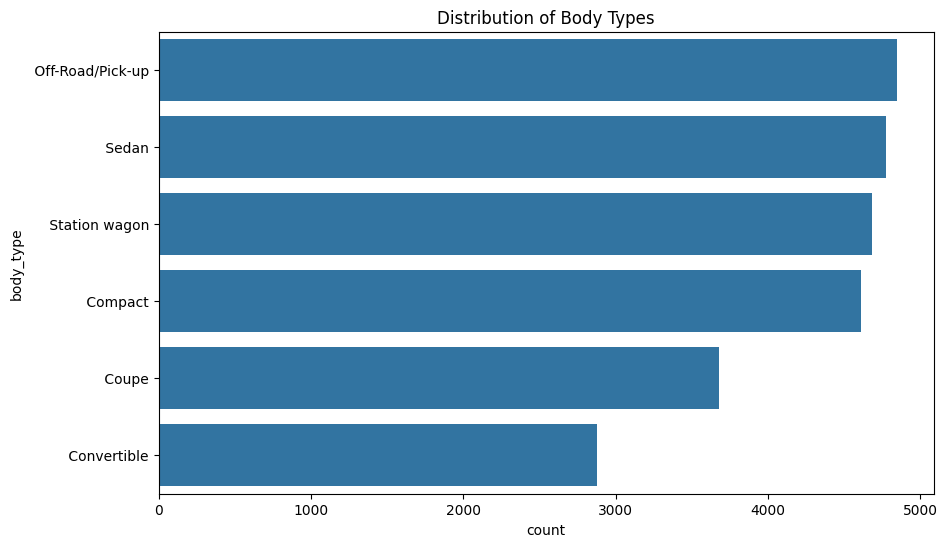

In [1245]:
# Count plot for body types
plt.figure(figsize=(10, 6))
sns.countplot(y=df['body_type'], order=df['body_type'].value_counts().index)
plt.title('Distribution of Body Types')
plt.show()

## 6. Gearbox Type

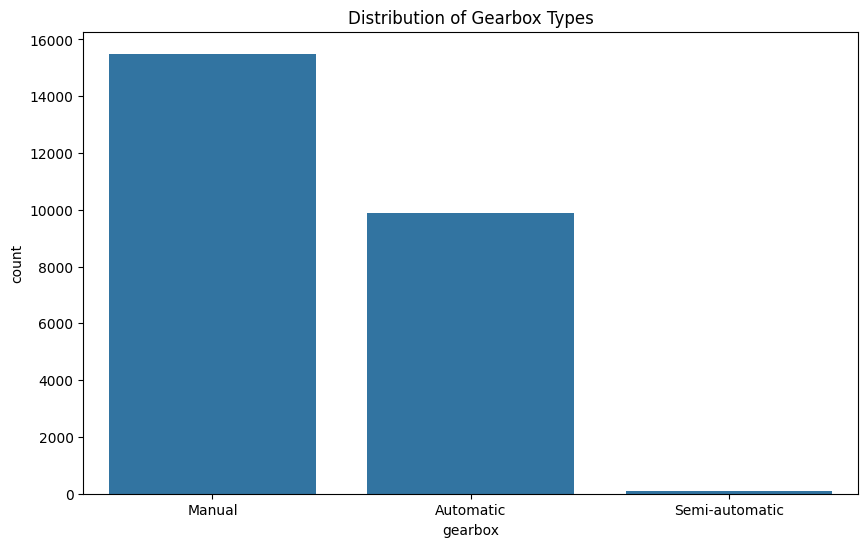

In [1246]:
# Count plot for gearbox types
plt.figure(figsize=(10, 6))
sns.countplot(x=df['gearbox'], order=df['gearbox'].value_counts().index)
plt.title('Distribution of Gearbox Types')
plt.show()

## 7. Fuel_Type

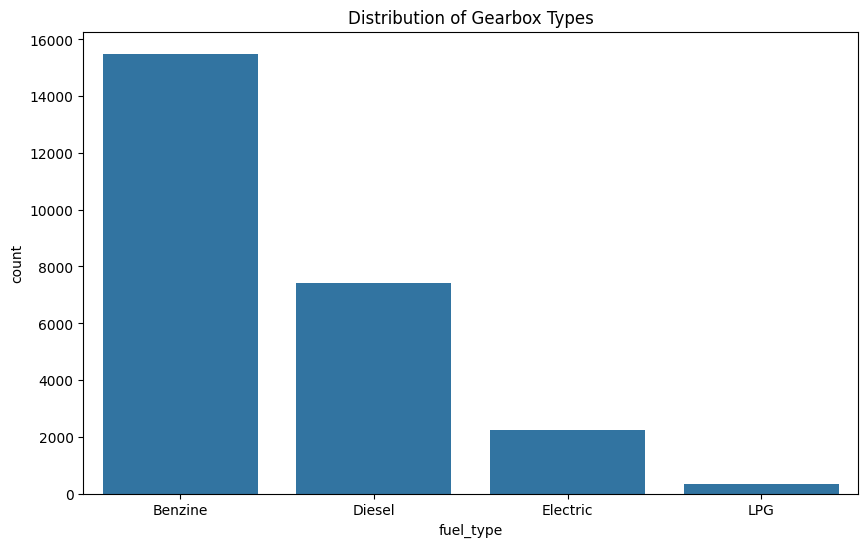

In [1247]:
# Count plot for fuel_type types
plt.figure(figsize=(10, 6))
sns.countplot(x=df['fuel_type'], order=df['fuel_type'].value_counts().index)
plt.title('Distribution of Gearbox Types')
plt.show()

## 8. Type

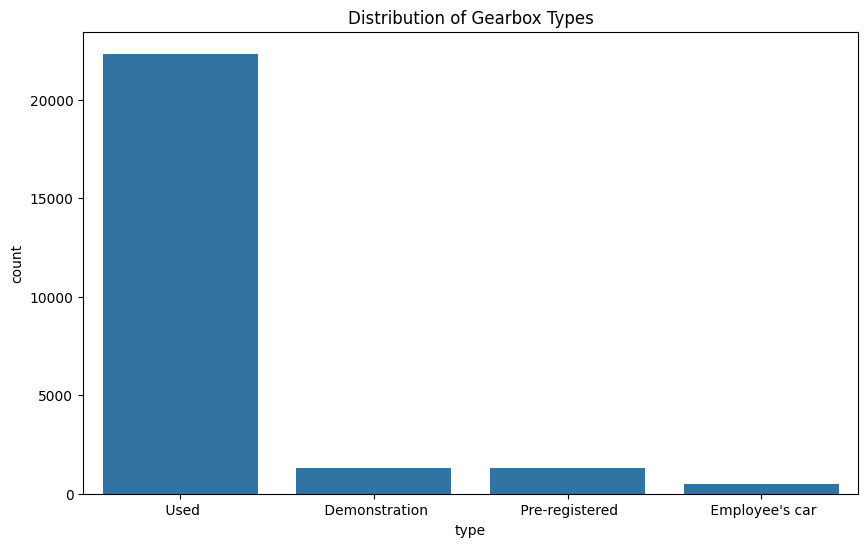

In [1248]:
# Count plot for type types
plt.figure(figsize=(10, 6))
sns.countplot(x=df['type'], order=df['type'].value_counts().index)
plt.title('Distribution of Gearbox Types')
plt.show()

## 9. Warranty

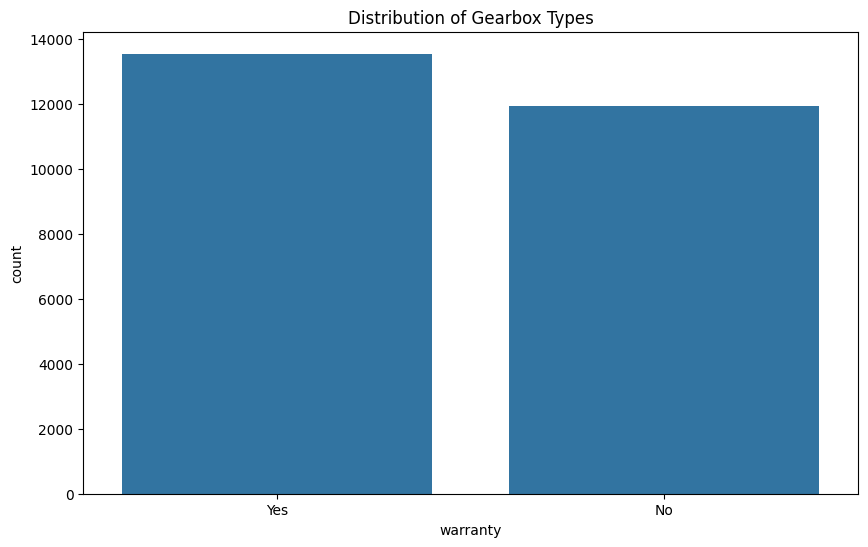

In [1249]:
# Count plot for warranty types
plt.figure(figsize=(10, 6))
sns.countplot(x=df['warranty'], order=df['warranty'].value_counts().index)
plt.title('Distribution of Gearbox Types')
plt.show()

In [1250]:
df.cylinders.value_counts()

cylinders
4.0     17478
3.0      4752
6.0      1473
8.0       717
5.0       590
0.0       313
2.0       103
7.0        34
12.0       11
26.0        1
16.0        1
1.0         1
Name: count, dtype: int64

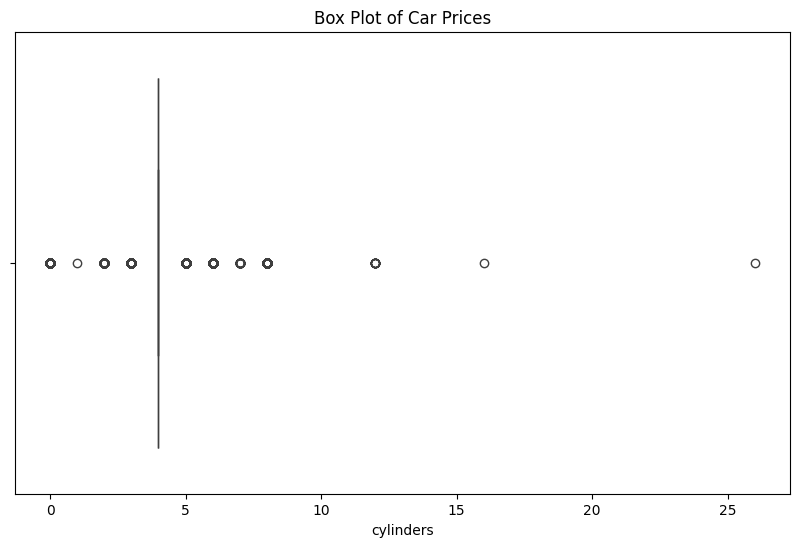

In [1251]:
plt.figure(figsize=(10, 6))
sns.boxplot(x=df['cylinders'])
plt.title('Box Plot of Car Prices')
plt.show()

In [1252]:
# Assuming outliers
indices_to_drop = (outliers_mileage.tolist() + outliers_mileage2.tolist() +  
                   outliers_mileage4.tolist() + outliers_mileage5.tolist() + outliers_mileage6.tolist() + 
                   outliers_mileage7.tolist() + outliers_mileage8.tolist() +
                   outliers_doors.tolist() )
indices_to_drop

[15361,
 9599,
 9599,
 12102,
 13843,
 16784,
 19554,
 19861,
 19993,
 20395,
 21469,
 22342,
 22811,
 23252,
 23666,
 24075,
 24551,
 24620,
 24862,
 25594,
 25691,
 25697,
 26406,
 26419,
 26466,
 26500,
 26684,
 26685,
 26735,
 26846,
 26846,
 16878,
 16883,
 26015,
 26735,
 26846,
 947,
 1002,
 1004,
 1127,
 1438,
 2145,
 2297,
 2381,
 2489,
 2613,
 2697,
 3,
 4,
 9,
 18,
 19,
 20,
 25,
 27,
 33,
 35,
 39,
 52,
 55,
 105,
 106,
 125,
 149,
 158,
 165,
 197,
 199,
 200,
 265,
 282,
 283,
 284,
 286,
 287,
 291,
 294,
 295,
 296,
 297,
 298,
 301,
 302,
 306,
 346,
 363,
 364,
 371,
 380,
 381,
 383,
 384,
 387,
 388,
 389,
 423,
 447,
 472,
 473,
 474,
 482,
 498,
 506,
 507,
 511,
 512,
 513,
 514,
 515,
 520,
 555,
 556,
 557,
 558,
 559,
 560,
 569,
 573,
 579,
 581,
 590,
 592,
 609,
 610,
 614,
 632,
 653,
 661,
 668,
 676,
 713,
 716,
 736,
 737,
 752,
 776,
 778,
 788,
 790,
 791,
 793,
 794,
 797,
 798,
 803,
 805,
 812,
 817,
 819,
 834,
 836,
 837,
 848,
 849,
 850,
 855,


In [1253]:
df.drop(index= indices_to_drop,inplace=True)

# Power kW

Check the boxplot to see extreme values

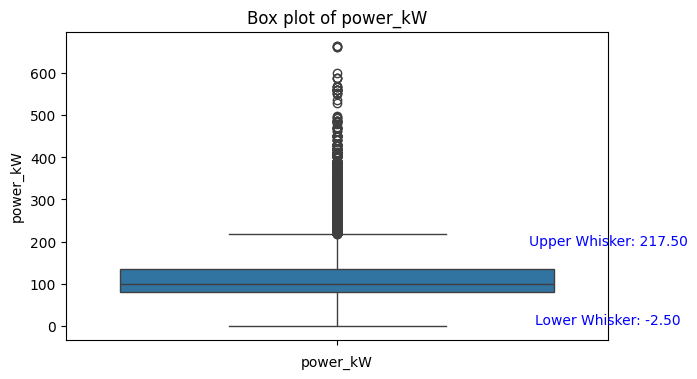

In [1254]:
box_plot_column(df,'power_kW')

In [1255]:
# Calculate the 25th and 75th percentiles (Q1 and Q3)
Q1 = df['power_kW'].quantile(0.25)
Q3 = df['power_kW'].quantile(0.75)

# Calculate the Interquartile Range (IQR)
IQR = Q3 - Q1
upper_whisker=Q3 + (1.5 * IQR)
lower_whisker=Q1 - (1.5 * IQR)
print(upper_whisker,lower_whisker)

217.5 -2.5


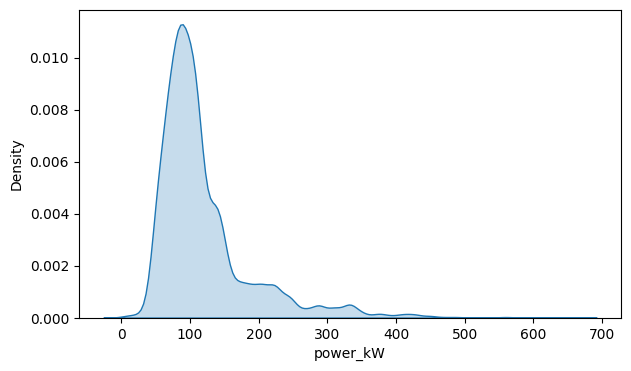

In [1256]:
kde_plot_column(df,'power_kW')

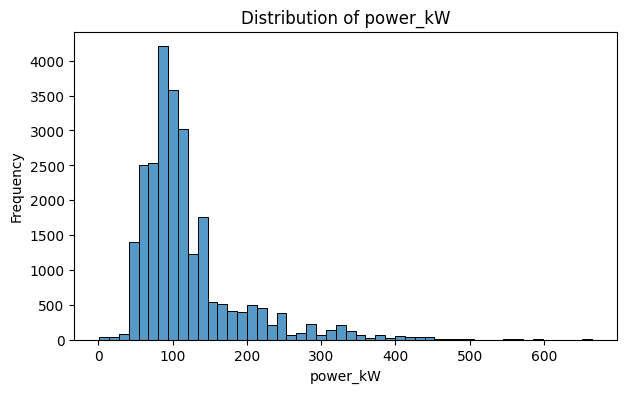

In [1257]:
hist_plot_column(df,'power_kW')

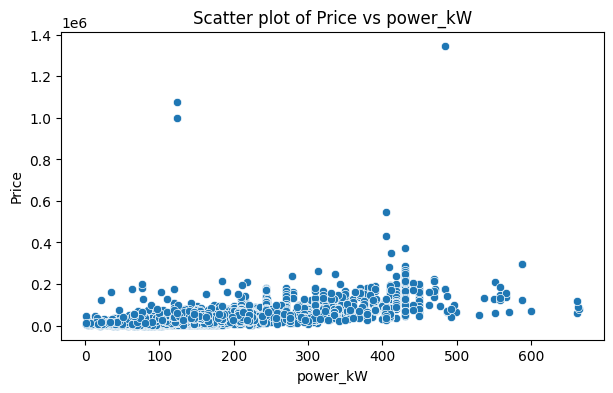

In [1258]:
scatter_plot_with_price(df,'power_kW')

In [1259]:
df.power_kW.describe()

count    25077.000000
mean       118.943354
std         68.454318
min          1.000000
25%         80.000000
50%        100.000000
75%        135.000000
max        665.000000
Name: power_kW, dtype: float64

In [1260]:
grouped_by_price(df,'power_kW')

price      power_kW  
490.0      70.000000     1
500.0      66.000000     2
590.0      66.000000     1
600.0      79.000000     2
699.0      79.000000     1
                        ..
430000.0   405.000000    1
549000.0   405.000000    1
998000.0   123.592744    1
1075900.0  123.592744    1
1346900.0  485.000000    1
Name: count, Length: 17338, dtype: int64

In [1261]:
grouped_by_column(df,'make_model', 'power_kW')

make_model    power_kW
Dacia         40.0         1
Dacia Dokker  75.0        10
              55.0        10
              70.0         9
              66.0         8
                          ..
Volvo XC90    188.0        1
              187.0        1
              184.0        1
              177.0        1
              300.0        1
Name: count, Length: 3658, dtype: int64

In [1262]:
grouped_average(df,'make_model', 'power_kW')

make_model
Dacia                       40.000000
Dacia Dokker                70.725490
Dacia Duster                84.849261
Dacia Duster Duster 1.5     79.333333
Dacia Jogger                80.200000
                              ...    
Volvo V90 Cross Country    159.363636
Volvo XC40                 133.067961
Volvo XC60                 187.841768
Volvo XC70                 144.466667
Volvo XC90                 194.271028
Name: power_kW, Length: 733, dtype: float64

In [1263]:
# Filter the DataFrame
greater_df = df[(df['power_kW'] > 450) ]
#Sort the filtered DataFrame by 'power_kW' in ascending order
sorted_greater_df = greater_df.sort_values(by='power_kW')

sorted_greater_df[['make_model','age','power_kW','fuel_type']]

,make_model,age,power_kW,fuel_type
17699,Mercedes-Benz S 65 AMG,6.0,463.0,Benzine
20753,Mercedes-Benz G 65 AMG,9.0,463.0,Benzine
1151,Mercedes-Benz,0.0,470.0,Electric
1172,Mercedes-Benz AMG GT,0.0,470.0,Electric
1175,Mercedes-Benz AMG GT,0.0,470.0,Electric
9298,Mercedes-Benz AMG GT,3.0,470.0,Benzine
9296,Mercedes-Benz AMG GT,3.0,470.0,Benzine
9291,Mercedes-Benz AMG GT,3.0,470.0,Benzine
6614,Mercedes-Benz AMG GT,2.0,471.0,Benzine
20790,Nissan GT-R,9.0,478.0,Benzine


In [1264]:
greater_df.shape

(46, 42)

In [1265]:
# Assuming greater_df is a DataFrame containing the indexes of rows with power_kW greater than a certain threshold
greater_indexes = greater_df['power_kW'].index

# Assign NaN to the 'power_kW' column for the specified rows
df.loc[greater_indexes, 'power_kW'] = np.nan

In [1266]:
df.isna().sum()

make_model                         0
price                              0
body_type                          0
type                               0
doors                              0
warranty                           0
mileage                            0
gearbox                            0
fuel_type                          0
colour                             0
paint                              0
seller                             0
seats                              0
engine_size                        0
gears                              0
co2_emissions                      0
drivetrain                         0
cylinders                          0
empty_weight                       0
service_history                    0
non_smoker                         0
emission_sticker                   0
upholstery_color                   0
upholstery                         0
available                          0
taxi_rental                        0
power_kW                          46
f

In [1267]:
# Filter the DataFrameElectric
less_df = df[ (df['power_kW'] < 4) & (df['fuel_type'] =='Electric')]
#Sort the filtered DataFrame by 'power_kW' in ascending order
sorted_less_df = less_df.sort_values(by='power_kW')



sorted_less_df[['make_model','age','power_kW','fuel_type']]

#sorted_filtered_df[['make_model','age','power_kW','fuel_type']]

,make_model,age,power_kW,fuel_type
13531,Renault,4.0,1.0,Electric
16531,Renault Twizy,5.0,1.0,Electric


In [1268]:
# Assuming greater_df is a DataFrame containing the indexes of rows with power_kW greater than a certain threshold
less_indexes = less_df['power_kW'].index

# Assign NaN to the 'power_kW' column for the specified rows
df.loc[less_indexes, 'power_kW'] = np.nan

In [1269]:
df.isna().sum()

make_model                         0
price                              0
body_type                          0
type                               0
doors                              0
warranty                           0
mileage                            0
gearbox                            0
fuel_type                          0
colour                             0
paint                              0
seller                             0
seats                              0
engine_size                        0
gears                              0
co2_emissions                      0
drivetrain                         0
cylinders                          0
empty_weight                       0
service_history                    0
non_smoker                         0
emission_sticker                   0
upholstery_color                   0
upholstery                         0
available                          0
taxi_rental                        0
power_kW                          48
f

In [1270]:
# Filter the DataFrameElectric
other_df = df[ (df['power_kW'] < 30) & (df['fuel_type'] !='Electric')]
#Sort the filtered DataFrame by 'power_kW' in ascending order
sorted_other_df = other_df.sort_values(by='power_kW')
# Combine these indices with the filtered DataFrame indices

sorted_other_df[['make_model','age','power_kW','fuel_type']]
#sorted_filtered_df[['make_model','age','power_kW','fuel_type']]

,make_model,age,power_kW,fuel_type
26853,Ford,94.0,1.0,Benzine
26532,Opel Kadett,46.0,1.0,Benzine
26186,Peugeot 205,30.0,1.0,Benzine
3501,Ford Kuga,1.0,3.0,Diesel
9077,Hyundai i20,3.0,6.0,Benzine
24365,Renault Megane,16.0,7.0,Benzine
26843,Peugeot 504,76.0,7.0,Benzine
23950,Renault Megane,15.0,8.0,Diesel
26652,Fiat 850,53.0,9.0,Benzine
26570,Fiat 500,49.0,10.0,Benzine


In [1271]:
# Assuming greater_df is a DataFrame containing the indexes of rows with power_kW greater than a certain threshold
other_indexes = other_df['power_kW'].index

# Assign NaN to the 'power_kW' column for the specified rows
df.loc[other_indexes, 'power_kW'] = np.nan

In [1272]:
df.isna().sum()

make_model                         0
price                              0
body_type                          0
type                               0
doors                              0
warranty                           0
mileage                            0
gearbox                            0
fuel_type                          0
colour                             0
paint                              0
seller                             0
seats                              0
engine_size                        0
gears                              0
co2_emissions                      0
drivetrain                         0
cylinders                          0
empty_weight                       0
service_history                    0
non_smoker                         0
emission_sticker                   0
upholstery_color                   0
upholstery                         0
available                          0
taxi_rental                        0
power_kW                          96
f

In [1273]:
 df[df['make_model'].isin(greater_df['make_model'])].groupby(['make_model', 'body_type']).agg(
    mean_power_kW=('power_kW', 'mean'),
    max_power_kW=('power_kW', 'max'),
    median_power_kW=('power_kW', 'median') 
).reset_index()

,make_model,body_type,mean_power_kW,max_power_kW,median_power_kW
0,Ford GT,Coupe,388.250000,412.0,405.000000
1,Ford Mustang,Compact,224.000000,224.0,224.000000
2,Ford Mustang,Convertible,249.857686,419.0,233.000000
3,Ford Mustang,Coupe,273.006701,410.0,263.783784
4,Ford Mustang,Off-Road/Pick-up,224.000000,258.0,224.000000
5,Ford Mustang V8,Convertible,302.379552,372.0,330.000000
6,Ford Mustang V8,Coupe,307.175676,405.0,331.000000
7,Mercedes-Benz,Compact,125.000000,125.0,125.000000
8,Mercedes-Benz,Convertible,254.000000,375.0,280.000000
9,Mercedes-Benz,Coupe,300.000000,300.0,300.000000


The Nissan GT-R, equipped with a V6 engine, typically has a power output ranging from 419 kW to 441 kW, depending on the model year and specific variant.
The Mercedes-Benz E 63 AMG typically has a power output ranging from 420 kW to 450 kW, depending on the model year and specific variant.
The power output of the Ford Mustang varies depending on the model year, trim level, and engine configuration. However, some of the higher-performance variants, such as the Shelby GT500, can have power outputs exceeding 500 horsepower (373 kW)

In [1274]:
df[df['make_model'] == 'Renault Megane' ].groupby('body_type')['power_kW'].mean()

body_type
 Compact          104.855072
 Convertible       95.446370
 Coupe            146.125128
 Sedan            127.362585
 Station wagon     92.731870
Name: power_kW, dtype: float64

In [1275]:
df[df['make_model'] == 'Renault Twizy' ].groupby('body_type')['power_kW'].mean()

body_type
 Compact             23.250000
 Convertible               NaN
 Coupe                8.163636
 Off-Road/Pick-up    33.500000
Name: power_kW, dtype: float64

In [1276]:
df[df['make_model'] == 'Opel Kadett'].groupby('body_type')['power_kW'].mean()


body_type
 Convertible    70.000000
 Coupe          64.444444
Name: power_kW, dtype: float64

In [1277]:
df[df['make_model'] == 'Ford'].groupby('body_type')['power_kW'].mean()

Series([], Name: power_kW, dtype: float64)

In [1278]:
df[df['make_model'] == 'Ford Kuga'].groupby('body_type')['power_kW'].mean()

body_type
 Compact             110.000000
 Off-Road/Pick-up    118.857143
 Sedan               110.000000
Name: power_kW, dtype: float64

In [1279]:
df[df['make_model'] == 'Hyundai i20'].groupby('body_type')['power_kW'].mean()

body_type
 Compact             74.000000
 Coupe               80.528846
 Off-Road/Pick-up    77.000000
 Sedan               73.564715
 Station wagon       74.000000
Name: power_kW, dtype: float64

In [1280]:
df[df['make_model'] == 'Peugeot 504'].groupby('body_type')['power_kW'].mean()

body_type
 Convertible    79.0
 Coupe          78.0
 Sedan          51.0
Name: power_kW, dtype: float64

In [1281]:
df[df['make_model'] == 'Fiat 850'].groupby('body_type')['power_kW'].mean()

body_type
 Compact        158.000000
 Convertible     37.000000
 Coupe           38.857143
Name: power_kW, dtype: float64

In [1282]:
df[df['make_model'] == 'Fiat 500'].groupby('body_type')['power_kW'].mean()

body_type
 Compact              56.367251
 Convertible          57.093023
 Coupe                56.339623
 Off-Road/Pick-up    106.500000
 Sedan                56.802198
 Station wagon        51.000000
Name: power_kW, dtype: float64

In [1283]:
df.isna().sum()

make_model                         0
price                              0
body_type                          0
type                               0
doors                              0
warranty                           0
mileage                            0
gearbox                            0
fuel_type                          0
colour                             0
paint                              0
seller                             0
seats                              0
engine_size                        0
gears                              0
co2_emissions                      0
drivetrain                         0
cylinders                          0
empty_weight                       0
service_history                    0
non_smoker                         0
emission_sticker                   0
upholstery_color                   0
upholstery                         0
available                          0
taxi_rental                        0
power_kW                          96
f

In [1284]:
without_twinzo_indices = df[df['make_model'] != 'Renault Twizy'].index
# Calculate mean power_kW for each make_model and body_type excluding electric cars
mean_power_kW_by_make_model_body_type = df.groupby(['make_model', 'body_type'])['power_kW'].mean()

# Calculate mean power_kW for each make_model excluding electric cars
mean_power_kW_by_make_model = df.groupby('make_model')['power_kW'].mean()

# Calculate mean power_kW for each body_type excluding electric cars
mean_power_kW_by_body_type = df.groupby('body_type')['power_kW'].mean()

# Calculate overall mean power_kW excluding electric cars
overall_mean_power_kW = df['power_kW'].mean()




In [1285]:
# Fill NaN values in power_kW with the mean based on make_model and body_type
df.loc[without_twinzo_indices, 'power_kW'] = df.apply(
    lambda row: mean_power_kW_by_make_model_body_type.loc[(row['make_model'], row['body_type'])] if pd.isna(row['power_kW']) else row['power_kW'],
    axis=1
)

In [1286]:
df['power_kW'].isna().sum()

24

In [1287]:
# Fill NaN values in power_kW with the mean based on make_model
df.loc[without_twinzo_indices, 'power_kW'] = df.apply(
    lambda row: mean_power_kW_by_make_model[row['make_model']] if pd.isna(row['power_kW']) else row['power_kW'],
    axis=1
)


In [1288]:
df['power_kW'].isna().sum()

14

In [1289]:
# Fill NaN values in power_kW with the mean based on body_type
df.loc[without_twinzo_indices, 'power_kW'] = df.apply(
    lambda row: mean_power_kW_by_body_type[row['body_type']] if pd.isna(row['power_kW']) else row['power_kW'],
    axis=1
)


In [1290]:
df['power_kW'].isna().sum()

1

In [1291]:
# Fill NaN values in power_kW with the overall mean
df.loc[without_twinzo_indices, 'power_kW'].fillna(overall_mean_power_kW, inplace=True)
# Display the DataFrame to verify the changes
print(df[['make_model', 'power_kW']])

          make_model    power_kW
5       Dacia Duster   85.000000
6       Dacia Duster   85.000000
7       Dacia Duster   96.000000
8       Dacia Duster  110.000000
10      Dacia Duster  110.000000
...              ...         ...
26851       Peugeot    42.750000
26852         Ford M  136.183273
26853          Ford   155.000000
26854    Ford Bronco  180.000000
26855  Hyundai IONIQ  103.000000

[25077 rows x 2 columns]


In [1292]:
df['power_kW'].isna().sum()

1

In [1293]:
nan_index = df.loc[df['power_kW'].isna()].index
df.loc[nan_index, 'power_kW'] = 4

In [1294]:
nan_rows = df[df.isna().any(axis=1)]
nan_rows

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make
5,Dacia Duster,21000.0,Off-Road/Pick-up,Pre-registered,5.0,Yes,1000.0,Manual,Diesel,Orange,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,-0.100024,-1.040897,-0.020221,Dacia
6,Dacia Duster,21000.0,Off-Road/Pick-up,Pre-registered,5.0,Yes,1000.0,Manual,Diesel,Orange,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,-0.100024,-1.040897,-0.020221,Dacia
7,Dacia Duster,21150.0,Off-Road/Pick-up,Demonstration,5.0,Yes,4500.0,Manual,Benzine,Black,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,-0.094110,-0.988756,-0.020221,Dacia
8,Dacia Duster,25190.0,Off-Road/Pick-up,Demonstration,5.0,No,4018.0,Manual,Benzine,Black,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,0.065179,-0.995937,-0.020221,Dacia
10,Dacia Duster,24222.0,Off-Road/Pick-up,Demonstration,5.0,No,8000.0,Automatic,Benzine,Black,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,0.027013,-0.936615,-0.020221,Dacia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26851,Peugeot,8950.0,Coupe,Used,2.0,No,1233.0,Manual,Benzine,White,...,Enhanced,Basic,Enhanced,3.0,NaN,-1.876651,-0.575131,-1.037426,-0.020221,Peugeot
26852,Ford M,20000.0,Convertible,Used,4.0,No,65515.0,Manual,Benzine,Green,...,Enhanced,Basic,Enhanced,3.0,NaN,0.101540,-0.139452,-0.079792,3.739751,Ford
26853,Ford,14490.0,Convertible,Used,2.0,No,5000.0,Automatic,Benzine,Red,...,Advanced,Advanced,Advanced,5.0,NaN,-1.217254,-0.356700,-0.981308,2.799758,Ford
26854,Ford Bronco,57480.0,Off-Road/Pick-up,Used,5.0,No,10.0,Automatic,Benzine,Silver,...,Advanced,Advanced,Advanced,3.0,NaN,1.420335,1.338309,-1.055646,-0.020221,Ford


In [1295]:
df[['make_model','power_kW']].sort_values(by='power_kW').head(20)
#df.drop(columns='z_score_power_kW',inplace=True)

,make_model,power_kW
21657,Renault Twizy,4.000000
16531,Renault Twizy,4.000000
7431,Renault Twizy,4.000000
21658,Renault Twizy,8.000000
20302,Renault Twizy,8.000000
19386,Renault Twizy,8.000000
2229,Renault Twizy,9.000000
21656,Renault Twizy,12.000000
4897,Renault Twizy,13.000000
10534,Renault Twizy,16.818182


In [1296]:
df.isna().sum()

make_model                         0
price                              0
body_type                          0
type                               0
doors                              0
warranty                           0
mileage                            0
gearbox                            0
fuel_type                          0
colour                             0
paint                              0
seller                             0
seats                              0
engine_size                        0
gears                              0
co2_emissions                      0
drivetrain                         0
cylinders                          0
empty_weight                       0
service_history                    0
non_smoker                         0
emission_sticker                   0
upholstery_color                   0
upholstery                         0
available                          0
taxi_rental                        0
power_kW                           0
f

Unrealistic power values: Several car models (Ford, Peugeot, Opel, Renault Megane) have very low power_kW values (around 1.0 or below). As discussed earlier, a typical gasoline car would have at least 10-20 kW, and electric vehicles might start around 6.5 kW.
Extreme variations within models: Some models like Renault Twizy and Fiat 500 have power_kW values ranging from very low (around 9) to seemingly normal (around 100). This inconsistency within a model is unusual.

Engine size and power: A 4474.0 cubic centimeter (cc) engine (likely a typo for 4.47 liters) is very large for a Ford convertible, especially a two-seater. This engine size would typically be found in a powerful muscle car or large SUV.
Power: With such a large engine, a mere 1.0 kW (1.34 horsepower) seems incredibly low. This wouldn't be enough power to move the car effectively.
Body style and performance: A convertible with a large engine and low power rating is a strange combination. Convertibles are often designed for performance or enjoyment, and a 1.0 kW engine wouldn't provide either.
Fuel Consumption: A 5.4 L/100km (combined) fuel consumption rating is surprisingly good for such a large engine, especially if the 1.0 kW power rating is accurate.

Make, model, body type, doors: These align with the Nissan GT-R, a high-performance coupe with two doors and four seats.
Price: The price (82500.0) might be on the lower end for a used GT-R depending on the year, mileage, and overall condition.
Engine size (3799.0 cc): This is a typical size for a high-performance engine like the one found in the GT-R.
Power (665.0 kW): This is within the expected range for a Nissan GT-R, known for its powerful engine.
Fuel consumption (12.4 L/100km): This is a high fuel consumption rating, but performance cars like the GT-R tend to be less fuel-efficient.

1. Opel Kadett 1.0
Testwagen
Hubraum / Verdichtung	993 cm³ / 7,8:1
Leistung	29 kW / 40 PS bei 5000 U/min
2. Ford Kuga 2.5 PHEV Vignale
Hubraum / Motor	2488 cm³ / 4-Zylinder
Leistung	112 kW / 152 PS bei 5500 U/min
3. Hyundai i20
 von 74 kW (100 PS) und 88 kW (120 PS) angeboten.
4. Peugeot 205 GTI
Testwagen
Hubraum / Verdichtung	1905 cm³ / 9,2:1
Leistung	88 kW / 120 PS bei 6000 U/min
5. Peugeot 504 
1,8–2,7 Liter (54–106 kW)

High Power Ratings: Many entries for the Ford Mustang show extremely high power outputs (e.g., 527 kW to 567 kW). This translates to around 707 to 760 horsepower, which is unusually high for standard production Mustangs. Most production models have significantly lower power outputs unless heavily modified.

Consistency in Models and Power: There are several instances where the same model has different power ratings. For example, the Ford Mustang appears with various power outputs (527 kW, 530 kW, 551 kW, etc.). This could indicate different trims or modifications, but it is worth verifying.

Age and Power Correlation: The age of the vehicles and their power ratings also seem inconsistent. For example, a 14-year-old Ford Mustang with 527 kW is unusual unless it has undergone significant modifications.

Unusual Power for Older Models: The Nissan Skyline and Toyota Supra are listed with extremely high power outputs (570 kW and 662 kW, respectively). For a 26-year-old Skyline and a 29-year-old Supra, these figures are highly unlikely unless the cars have been heavily tuned.

Duplication and Redundancy: There are multiple entries with the exact same specifications (e.g., Ford Mustang V8 with 559 kW power, 1-year age). This could indicate data duplication.

Potential Rows to Drop:
Duplicates:
Rows where all attributes match exactly can be dropped.
4016 and 4015 (Mercedes-Benz GLE 63 AMG GLE 63, 1.0 age, 588.0 kW)
3473, 3477, 3509, 3510, 3512 (Ford Mustang, 1.0 age, 559.0 kW)
Implausible Power Outputs:
Entries with power outputs that seem too high for standard production models.
19693 (Ford Mustang, 9.0 age, 662.0 kW) – Extremely high for a standard Mustang.
25121 (Toyota Supra, 29.0 age, 662.0 kW) – Unlikely for an old Supra unless heavily modified.
22009 (Nissan GT-R, 13.0 age, 664.0 kW) – High for a 13-year-old GT-R unless modified.
21567 (Nissan GT-R V6, 12.0 age, 665.0 kW) – Similar reasoning as above.
Inconsistent Power for Same Model and Age:
Entries where the same model and age have different power ratings without clear justification.
22331, 17909, 16918, 6120, 3514, 14677, 6121, 730, 668 (Ford Mustang) – The power ratings range from 527 kW to 567 kW. Verify if these represent different trims or modifications; otherwise, standardize or drop.

# fuel_consumption_comb

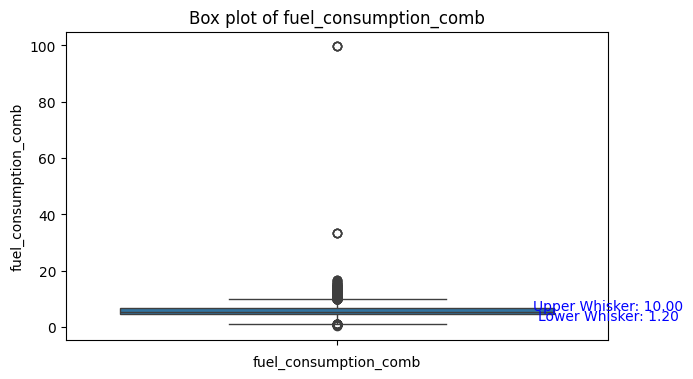

In [1297]:
box_plot_column(df,'fuel_consumption_comb')

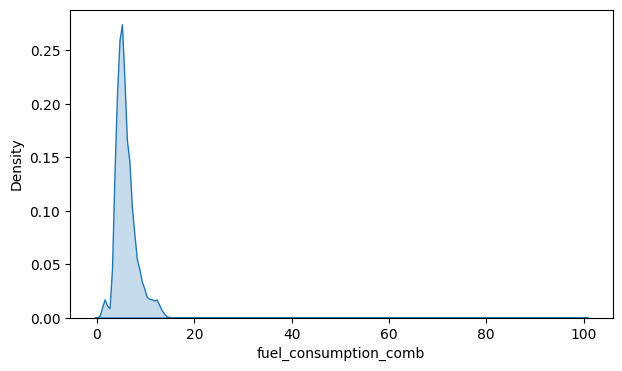

In [1298]:
kde_plot_column(df,'fuel_consumption_comb')

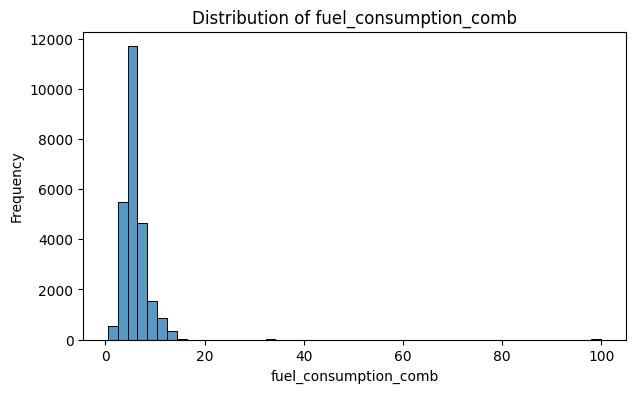

In [1299]:
hist_plot_column(df,'fuel_consumption_comb')

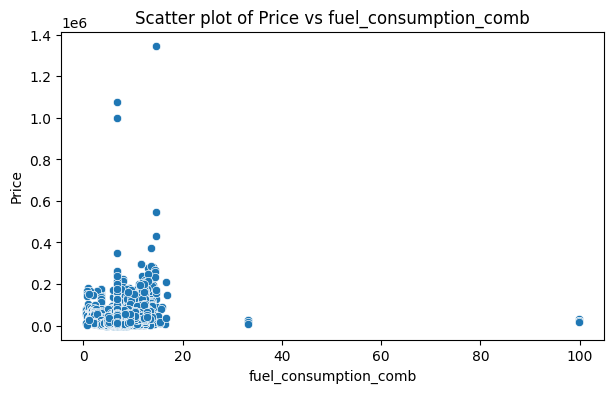

In [1300]:
scatter_plot_with_price(df,'fuel_consumption_comb')

In [1301]:
grouped_by_column(df,'make_model','fuel_consumption_comb')

make_model    fuel_consumption_comb
Dacia         5.600000                 1
Dacia Dokker  4.200000                 9
              4.314286                 7
              4.500000                 5
              5.700000                 5
                                      ..
Volvo XC90    9.650000                 1
              2.168421                 1
              1.500000                 1
              1.200000                 1
              12.900000                1
Name: count, Length: 5024, dtype: int64

In [1302]:
df.groupby('make_model')['fuel_consumption_comb'].mean()

make_model
Dacia                      5.600000
Dacia Dokker               5.241600
Dacia Duster               5.507656
Dacia Duster Duster 1.5    5.116667
Dacia Jogger               5.882497
                             ...   
Volvo V90 Cross Country    5.685909
Volvo XC40                 5.026443
Volvo XC60                 4.754515
Volvo XC70                 6.449371
Volvo XC90                 5.398924
Name: fuel_consumption_comb, Length: 733, dtype: float64

In [1303]:
df['fuel_consumption_comb'].describe()

count    25077.000000
mean         5.882098
std          2.454690
min          0.500000
25%          4.500000
50%          5.400000
75%          6.700000
max         99.900000
Name: fuel_consumption_comb, dtype: float64

In [1304]:
# Calculate the 25th and 75th percentiles (Q1 and Q3)
Q1 = df['fuel_consumption_comb'].quantile(0.25)
Q3 = df['fuel_consumption_comb'].quantile(0.75)

# Calculate the Interquartile Range (IQR)
IQR = Q3 - Q1
IQR
upper_whisker=Q3 + (1.5 * IQR)
lower_whisker=Q1 - (1.5 * IQR)
print(upper_whisker,lower_whisker)

10.0 1.1999999999999997


In [1305]:
# Filter the DataFrame for outliers in 'fuel_consumption_comb'
outliers = df[(df['fuel_consumption_comb'] < lower_whisker) | (df['fuel_consumption_comb'] > upper_whisker)]

# Sort the outliers by 'fuel_consumption_comb'
sorted_outliers = outliers.sort_values(by='fuel_consumption_comb')
sorted_outliers.tail(20)

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make
24131,Mercedes-Benz SL 65 AMG,48900.0,Convertible,Used,2.0,Yes,106000.0,Automatic,Benzine,Grey,...,Advanced,Advanced,Advanced,2.0,NaN,0.760938,1.000017,0.523330,1.859765,Mercedes-Benz
21288,Hyundai Genesis V6,19888.0,Coupe,Used,3.0,No,115000.0,Automatic,Benzine,Grey,...,Enhanced,Advanced,Advanced,2.0,NaN,1.420335,-0.143868,0.657406,1.859765,Hyundai
25481,Mercedes-Benz S 500,13980.0,Sedan,Used,4.0,No,76100.0,Automatic,Benzine,Black,...,Basic,Advanced,Advanced,4.0,NaN,0.760938,-0.376808,0.077897,2.799758,Mercedes-Benz
15785,Nissan 370Z,32900.0,Coupe,Used,3.0,No,17310.0,Automatic,Benzine,Red,...,Basic,Basic,Enhanced,2.0,NaN,0.101540,0.369169,-0.797921,1.859765,Nissan
26235,Nissan Terrano V6,15950.0,Off-Road/Pick-up,Used,5.0,No,271425.0,Manual,Benzine,Grey,...,Basic,Enhanced,Advanced,4.0,NaN,-0.557857,-0.299135,2.987732,1.859765,Nissan
23735,Mercedes-Benz SL 65 AMG Roadster,79999.0,Convertible,Used,2.0,Yes,120700.0,Automatic,Benzine,Silver,...,Advanced,Advanced,Advanced,16.0,NaN,0.760938,2.226188,0.742321,1.859765,Mercedes-Benz
22531,Mercedes-Benz G 55 AMG,89999.0,Off-Road/Pick-up,Used,4.0,Yes,136900.0,Automatic,Benzine,Black,...,Advanced,Advanced,Advanced,16.0,NaN,2.079732,2.620468,0.983659,-0.020221,Mercedes-Benz
16153,Opel Insignia V6,23080.0,Station wagon,Used,5.0,No,78000.0,Automatic,Benzine,Red,...,Advanced,Advanced,Advanced,3.0,NaN,0.101540,-0.018014,0.106202,1.859765,Opel
25151,Mercedes-Benz CLK 500,8800.0,Coupe,Used,2.0,Yes,148000.0,Automatic,Benzine,Blue,...,Basic,Advanced,Advanced,2.0,NaN,-0.557857,-0.581045,1.149020,3.739751,Mercedes-Benz
26690,Fiat,39000.0,Coupe,Used,2.0,No,50000.0,Manual,Benzine,Silver,...,Advanced,Advanced,Advanced,3.0,NaN,-1.217254,0.609680,-0.310925,0.919772,Fiat


o convert power_kW to energy_consumption_kWh_per_100mi, you need additional information such as the efficiency of the vehicle or typical driving conditions, which is not straightforwardly derivable from power_kW alone. However, for simplicity, if we assume you have an approximate conversion rate, you can use that to estimate the energy_consumption_kWh_per_100mi.

Let's assume an electric vehicle consumes about 0.2 kWh per km (20 kWh per 100 km) on average, and we will use that to create an estimate:

Example Conversion
We'll create a mock conversion factor for this example:

Approximate conversion rate: 0.2 kWh/km
Converted to miles: 0.2 kWh/km * 1.60934 km/mile = 0.32187 kWh/mile
For 100 miles, this becomes approximately:

kWh per 100 miles: 0.32187 kWh/mile * 100 miles = 32.187 kWh/100 miles

In [1306]:
elec_mean = df[df['fuel_type']=='Electric']['fuel_consumption_comb'].mean()
elec_mean

3.4174151635061327

In [1307]:
df_electric = df[(df['fuel_type'] == 'Electric') & (df['fuel_consumption_comb'] < elec_mean)]

# Assuming you want to get the value counts for a specific column, for example 'model'
df_electric[['make_model','fuel_consumption_comb']].value_counts()

make_model             fuel_consumption_comb
Toyota Yaris           2.800000                 26
Volvo V90              1.700000                 25
Mercedes-Benz A 250    1.400000                 22
Toyota Yaris           3.300000                 22
Volvo S90              3.066667                 22
Volvo XC60             2.878571                 19
Opel Grandland X       1.500000                 18
Volvo S60              1.500000                 18
Toyota Corolla         3.300000                 18
Volvo XC40             1.800000                 17
Ford Kuga              2.990000                 15
Volvo XC60             1.900000                 14
Peugeot 308            1.200000                 14
Ford Kuga              1.200000                 13
Peugeot 508            1.930769                 12
Volvo V60              1.600000                 12
Toyota RAV 4           1.200000                 11
Peugeot 508            1.400000                 11
Volvo S90              1.700000      

In [1308]:
df_electric = df[df['fuel_type'] == 'Electric']

# Assuming you want to get the value counts for a specific column, for example 'model'
df_electric['make_model'].value_counts()

make_model
Toyota Corolla                        138
Toyota Yaris                          115
Fiat 500                              100
Toyota Auris                           97
Renault ZOE                            87
Toyota C-HR                            87
Hyundai IONIQ                          86
Volvo XC60                             64
Nissan Leaf                            60
Ford Kuga                              55
Toyota RAV 4                           52
Peugeot 508                            50
Volvo S90                              43
Fiat 500C                              43
Fiat 500e                              43
Volvo V60                              42
Volvo V90                              40
Ford Fiesta                            35
Hyundai TUCSON                         34
Dacia Spring                           34
Volvo S60                              31
Mercedes-Benz A 250                    31
Mercedes-Benz EQS                      29
Opel Grandland X       

In [1309]:
df_electric['fuel_consumption_comb'].describe()

count    2154.000000
mean        3.417415
std         1.279926
min         0.600000
25%         2.800000
50%         3.447727
75%         4.100000
max         8.800000
Name: fuel_consumption_comb, dtype: float64

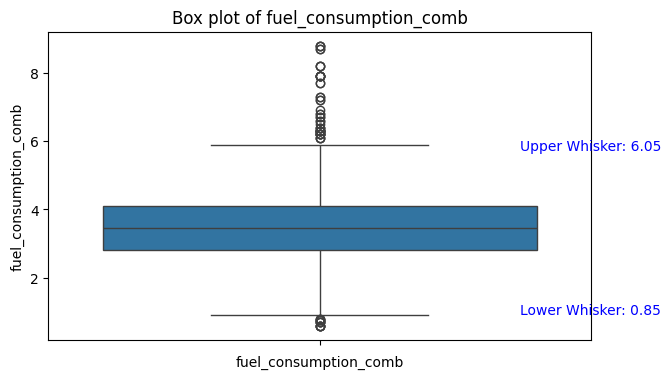

In [1310]:
box_plot_column(df_electric,'fuel_consumption_comb')

In [1311]:
upper_lower_whisker(df_electric,'fuel_consumption_comb')

(6.049999999999999, 0.8500000000000001)

In [1312]:
df_electric.sort_values(by='fuel_consumption_comb',ascending=False)

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make
4078,Mercedes-Benz E 53 AMG,117203.0,Sedan,Used,5.0,Yes,10500.0,Automatic,Electric,Black,...,Advanced,Advanced,Advanced,11.0,NaN,2.079732,3.693067,-0.899372,1.859765,Mercedes-Benz
4074,Mercedes-Benz E 53 AMG,95900.0,Convertible,Used,2.0,Yes,18143.0,Automatic,Electric,Silver,...,Enhanced,Advanced,Advanced,3.0,NaN,2.079732,2.853132,-0.785511,1.859765,Mercedes-Benz
4073,Mercedes-Benz E 53 AMG,98900.0,Convertible,Used,2.0,Yes,15632.0,Automatic,Electric,Silver,...,Enhanced,Advanced,Advanced,3.0,NaN,2.079732,2.971416,-0.822918,1.859765,Mercedes-Benz
6690,Mercedes-Benz CLS 53 AMG,82980.0,Coupe,Used,4.0,No,16000.0,Automatic,Electric,Silver,...,Advanced,Advanced,Advanced,9.0,NaN,2.079732,2.343723,-0.817436,1.859765,Mercedes-Benz
9455,Mercedes-Benz E 53 AMG,40999.0,Station wagon,Used,4.0,Yes,174717.0,Automatic,Electric,Black,...,Advanced,Advanced,Enhanced,13.0,NaN,2.079732,0.688496,1.547034,1.859765,Mercedes-Benz
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1204,Mercedes-Benz C 300,56790.0,Station wagon,Used,5.0,No,15.0,Automatic,Electric,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,1.311104,-1.055571,-0.020221,Mercedes-Benz
1214,Mercedes-Benz C 300,57885.0,Sedan,Demonstration,4.0,Yes,9900.0,Automatic,Electric,White,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,1.354277,-0.908310,-0.020221,Mercedes-Benz
1207,Mercedes-Benz C 300,74900.0,Station wagon,Demonstration,5.0,No,9900.0,Automatic,Electric,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,2.025144,-0.908310,-0.020221,Mercedes-Benz
1213,Mercedes-Benz C 300,56585.0,Sedan,Demonstration,4.0,Yes,9900.0,Automatic,Electric,White,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,1.303021,-0.908310,-0.020221,Mercedes-Benz


In [1313]:
df_electric['make_model'].unique()

array(['Dacia Spring', 'Fiat ', 'Fiat 500', 'Fiat 500C', 'Fiat 500X',
       'Fiat 500e', 'Fiat New Panda', 'Fiat Panda', 'Fiat Tipo',
       'Ford Fiesta', 'Ford Focus', 'Ford Kuga', 'Ford Mondeo',
       'Ford Mustang Mach-E', 'Ford Puma', 'Hyundai ', 'Hyundai IONIQ',
       'Hyundai IONIQ 5', 'Hyundai KONA',
       'Hyundai KONA Elektro Kona Electric', 'Hyundai SANTA FE',
       'Hyundai TUCSON', 'Hyundai i30', 'Mercedes-Benz ',
       'Mercedes-Benz  C 300', 'Mercedes-Benz  S 580e',
       'Mercedes-Benz A 250', 'Mercedes-Benz AMG GT',
       'Mercedes-Benz C 300', 'Mercedes-Benz CLA 250',
       'Mercedes-Benz E 300', 'Mercedes-Benz EQA',
       'Mercedes-Benz EQA 250', 'Mercedes-Benz EQB 300',
       'Mercedes-Benz EQB 350', 'Mercedes-Benz EQC 400',
       'Mercedes-Benz EQE 350', 'Mercedes-Benz EQE 43',
       'Mercedes-Benz EQE 500', 'Mercedes-Benz EQS',
       'Mercedes-Benz EQV 300', 'Mercedes-Benz GLC 300',
       'Mercedes-Benz GLE 350', 'Mercedes-Benz S 500',
       'Merce

In [1314]:
electric_models = ['Dacia Spring', 'Fiat 500e', 'Ford Mustang Mach-E', 'Nissan Leaf', 'Hyundai IONIQ', 'Hyundai IONIQ 5', 'Hyundai Kona Electric', 
                   'Mercedes-Benz EQA', 'Mercedes-Benz EQB', 'Mercedes-Benz EQC', 'Mercedes-Benz EQE', 'Mercedes-Benz EQS', 'Mercedes-Benz EQV', 
                   'Opel Corsa-e', 'Peugeot e-2008', 'Peugeot e-208', 'Renault Megane E-Tech', 'Renault Twingo Z.E.', 'Renault Twizy', 'Renault ZOE', 
                   'Skoda Enyaq', 'Skoda Citigo-e iV', 'Volvo C40', 'Volvo XC40 Recharge']

In [1315]:
# Replace non-electric models with NaN in the 'fuel_type' column
df.loc[~(df['make_model'].isin(electric_models) ) & (df['fuel_type']=='Electric'), 'fuel_type'] = np.nan

In [1316]:
df['fuel_type'].isna().sum()

1734

In [1317]:
df.T

,5,6,7,8,10,11,12,13,14,15,...,26845,26847,26848,26849,26850,26851,26852,26853,26854,26855
make_model,Dacia Duster,Dacia Duster,Dacia Duster,Dacia Duster,Dacia Duster,Dacia Duster,Dacia Duster,Dacia Duster,Dacia Duster,Dacia Duster,...,Ford,Ford V8,Ford V8,Ford V8,Ford Roadster,Peugeot,Ford M,Ford,Ford Bronco,Hyundai IONIQ
price,21000.0,21000.0,21150.0,25190.0,24222.0,21990.0,23556.0,21990.0,23480.0,23200.0,...,54000.0,40000.0,54990.0,49900.0,40000.0,8950.0,20000.0,14490.0,57480.0,26991.0
body_type,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,...,Convertible,Convertible,Convertible,Convertible,Convertible,Coupe,Convertible,Convertible,Off-Road/Pick-up,Sedan
type,Pre-registered,Pre-registered,Demonstration,Demonstration,Demonstration,Pre-registered,Pre-registered,Pre-registered,Used,Employee's car,...,Used,Used,Used,Used,Used,Used,Used,Used,Used,Used
doors,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,...,4.0,2.0,2.0,2.0,2.0,2.0,4.0,2.0,5.0,5.0
warranty,Yes,Yes,Yes,No,No,Yes,No,Yes,Yes,Yes,...,No,No,No,No,No,No,No,No,No,No
mileage,1000.0,1000.0,4500.0,4018.0,8000.0,7.0,10.0,7.0,12751.0,1360.0,...,28000.0,15000.0,25600.0,3500.0,60000.0,1233.0,65515.0,5000.0,10.0,29961.0
gearbox,Manual,Manual,Manual,Manual,Automatic,Manual,Manual,Manual,Manual,Manual,...,Automatic,Manual,Automatic,Automatic,Manual,Manual,Manual,Automatic,Automatic,Automatic
fuel_type,Diesel,Diesel,Benzine,Benzine,Benzine,Benzine,Diesel,Benzine,Benzine,Diesel,...,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Electric
colour,Orange,Orange,Black,Black,Black,White,Orange,Orange,Black,Grey,...,Beige,Black,Red,Black,Black,White,Green,Red,Silver,Grey


In [1318]:
# Find the mode of fuel_type for each make_model excluding "Electric"
mode_fuel_type_by_make_model = df[df['fuel_type'] != 'Electric'].groupby('body_type')['fuel_type'].apply(lambda x: x.mode().iloc[0] if not x.mode().empty else None)


In [1319]:

# Fill NaN values in fuel_type column with the mode based on make_model
df['fuel_type'] = df.apply(lambda row: mode_fuel_type_by_make_model[row['body_type']] if pd.isna(row['fuel_type']) else row['fuel_type'], axis=1)

In [1320]:
df.isna().sum()

make_model                         0
price                              0
body_type                          0
type                               0
doors                              0
warranty                           0
mileage                            0
gearbox                            0
fuel_type                          0
colour                             0
paint                              0
seller                             0
seats                              0
engine_size                        0
gears                              0
co2_emissions                      0
drivetrain                         0
cylinders                          0
empty_weight                       0
service_history                    0
non_smoker                         0
emission_sticker                   0
upholstery_color                   0
upholstery                         0
available                          0
taxi_rental                        0
power_kW                           0
f

In [1321]:
df.T

,5,6,7,8,10,11,12,13,14,15,...,26845,26847,26848,26849,26850,26851,26852,26853,26854,26855
make_model,Dacia Duster,Dacia Duster,Dacia Duster,Dacia Duster,Dacia Duster,Dacia Duster,Dacia Duster,Dacia Duster,Dacia Duster,Dacia Duster,...,Ford,Ford V8,Ford V8,Ford V8,Ford Roadster,Peugeot,Ford M,Ford,Ford Bronco,Hyundai IONIQ
price,21000.0,21000.0,21150.0,25190.0,24222.0,21990.0,23556.0,21990.0,23480.0,23200.0,...,54000.0,40000.0,54990.0,49900.0,40000.0,8950.0,20000.0,14490.0,57480.0,26991.0
body_type,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,Off-Road/Pick-up,...,Convertible,Convertible,Convertible,Convertible,Convertible,Coupe,Convertible,Convertible,Off-Road/Pick-up,Sedan
type,Pre-registered,Pre-registered,Demonstration,Demonstration,Demonstration,Pre-registered,Pre-registered,Pre-registered,Used,Employee's car,...,Used,Used,Used,Used,Used,Used,Used,Used,Used,Used
doors,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,5.0,...,4.0,2.0,2.0,2.0,2.0,2.0,4.0,2.0,5.0,5.0
warranty,Yes,Yes,Yes,No,No,Yes,No,Yes,Yes,Yes,...,No,No,No,No,No,No,No,No,No,No
mileage,1000.0,1000.0,4500.0,4018.0,8000.0,7.0,10.0,7.0,12751.0,1360.0,...,28000.0,15000.0,25600.0,3500.0,60000.0,1233.0,65515.0,5000.0,10.0,29961.0
gearbox,Manual,Manual,Manual,Manual,Automatic,Manual,Manual,Manual,Manual,Manual,...,Automatic,Manual,Automatic,Automatic,Manual,Manual,Manual,Automatic,Automatic,Automatic
fuel_type,Diesel,Diesel,Benzine,Benzine,Benzine,Benzine,Diesel,Benzine,Benzine,Diesel,...,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Benzine,Electric
colour,Orange,Orange,Black,Black,Black,White,Orange,Orange,Black,Grey,...,Beige,Black,Red,Black,Black,White,Green,Red,Silver,Grey


In [1322]:
df_electric= df[df['fuel_type']=='Electric']
df_electric

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make
280,Dacia Spring,18490.0,Off-Road/Pick-up,Used,5.0,No,5800.0,Automatic,Electric,Silver,...,Advanced,Advanced,Advanced,5.0,NaN,-3.195446,-0.198988,-0.969390,-2.840201,Dacia
281,Dacia Spring,22980.0,Off-Road/Pick-up,Demonstration,5.0,No,5000.0,Automatic,Electric,White,...,Enhanced,Enhanced,Advanced,5.0,NaN,-3.195446,-0.021957,-0.981308,-2.840201,Dacia
285,Dacia Spring,27044.0,Sedan,Used,5.0,No,4990.0,Manual,Electric,Silver,...,Enhanced,Advanced,Advanced,5.0,NaN,-3.195446,0.138279,-0.981457,-2.840201,Dacia
288,Dacia Spring,18400.0,Sedan,Used,5.0,Yes,1.0,Automatic,Electric,Grey,...,Enhanced,Advanced,Advanced,5.0,NaN,-3.195446,-0.202537,-1.055780,-2.840201,Dacia
468,Fiat 500e,32990.0,Compact,Pre-registered,3.0,No,10.0,Automatic,Electric,Gold,...,Advanced,Advanced,Advanced,5.0,NaN,-3.195446,0.372718,-1.055646,-2.840201,Fiat
469,Fiat 500e,32990.0,Compact,Pre-registered,3.0,No,35.0,Automatic,Electric,Green,...,Advanced,Advanced,Advanced,5.0,NaN,-3.195446,0.372718,-1.055273,-2.840201,Fiat
470,Fiat 500e,32990.0,Compact,Pre-registered,3.0,No,15.0,Automatic,Electric,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,-3.195446,0.372718,-1.055571,-2.840201,Fiat
471,Fiat 500e,32990.0,Compact,Pre-registered,3.0,No,10.0,Automatic,Electric,Blue,...,Advanced,Advanced,Advanced,5.0,NaN,-3.195446,0.372718,-1.055646,-2.840201,Fiat
475,Fiat 500e,28590.0,Compact,Used,3.0,No,8000.0,Automatic,Electric,Blue,...,Advanced,Advanced,Advanced,5.0,NaN,-3.195446,0.199234,-0.936615,-2.840201,Fiat
476,Fiat 500e,23700.0,Compact,Pre-registered,2.0,No,1.0,Automatic,Electric,Red,...,Advanced,Advanced,Enhanced,5.0,NaN,-3.195446,0.006432,-1.055780,-2.840201,Fiat


In [1323]:
df.shape

(25077, 42)

In [1324]:
# Step 1: Filter out electric cars
df_electric = df[df['fuel_type'] == 'Electric']

# Step 2: Calculate Z-scores for the relevant columns
df_electric['z_score_fuel_consumption_comb'] = stats.zscore(df_electric['fuel_consumption_comb'])

# Step 3: Filter out rows where the z-score is greater than 3 or less than -3
df_z_score = df_electric[df_electric['z_score_fuel_consumption_comb'].abs() <= 3]

# Step 4: Identify the rows in df_electric that are not in df_z_score
indexes_to_drop = df_electric.index.difference(df_z_score.index)

# Step 5: Drop these indexes from the original df
df.drop(indexes_to_drop, inplace=True)

In [1325]:
df.shape

(25061, 42)

In [1326]:
df_other= df[df['fuel_type']!='Electric']
df_other.sort_values(by='fuel_consumption_comb')

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make
12019,Fiat Tipo,12650.0,Station wagon,Used,5.0,Yes,58340.0,Manual,Benzine,Grey,...,Advanced,Advanced,Advanced,4.0,NaN,0.101540,-0.429248,-0.186680,-0.020221,Fiat
1214,Mercedes-Benz C 300,57885.0,Sedan,Demonstration,4.0,Yes,9900.0,Automatic,Benzine,White,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,1.354277,-0.908310,-0.020221,Mercedes-Benz
1207,Mercedes-Benz C 300,74900.0,Station wagon,Demonstration,5.0,No,9900.0,Automatic,Diesel,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,2.025144,-0.908310,-0.020221,Mercedes-Benz
1206,Mercedes-Benz C 300,77900.0,Station wagon,Demonstration,5.0,No,9900.0,Automatic,Diesel,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,2.143428,-0.908310,-0.020221,Mercedes-Benz
1204,Mercedes-Benz C 300,56790.0,Station wagon,Used,5.0,No,15.0,Automatic,Diesel,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,1.311104,-1.055571,-0.020221,Mercedes-Benz
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13007,Nissan Qashqai,19990.0,Compact,Used,5.0,No,27000.0,Manual,Benzine,Black,...,Advanced,Enhanced,Enhanced,3.0,NaN,0.101540,-0.139846,-0.653565,-0.020221,Nissan
9652,Nissan Qashqai,21995.0,Compact,Used,5.0,Yes,57706.0,Manual,Benzine,White,...,Advanced,Advanced,Advanced,3.0,NaN,0.101540,-0.060793,-0.196125,-0.020221,Nissan
6557,Mercedes-Benz A 180,32750.0,Compact,Used,5.0,Yes,49444.0,Automatic,Benzine,Silver,...,Advanced,Advanced,Advanced,5.0,NaN,0.760938,0.363255,-0.319208,-0.020221,Mercedes-Benz
8801,Ford Focus,21990.0,Sedan,Used,5.0,Yes,75353.0,Automatic,Diesel,Red,...,Advanced,Advanced,Advanced,3.0,NaN,0.101540,-0.060990,0.066769,-0.960214,Ford


In [1327]:
df_other['fuel_consumption_comb'].describe()

count    24657.000000
mean         5.923858
std          2.453629
min          0.500000
25%          4.500000
50%          5.400000
75%          6.700000
max         99.900000
Name: fuel_consumption_comb, dtype: float64

In [1328]:
df_other[df_other['fuel_consumption_comb']<3.9].sort_values(by='fuel_consumption_comb')

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make
12019,Fiat Tipo,12650.0,Station wagon,Used,5.0,Yes,58340.0,Manual,Benzine,Grey,...,Advanced,Advanced,Advanced,4.0,NaN,0.101540,-0.429248,-0.186680,-0.020221,Fiat
1214,Mercedes-Benz C 300,57885.0,Sedan,Demonstration,4.0,Yes,9900.0,Automatic,Benzine,White,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,1.354277,-0.908310,-0.020221,Mercedes-Benz
1213,Mercedes-Benz C 300,56585.0,Sedan,Demonstration,4.0,Yes,9900.0,Automatic,Benzine,White,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,1.303021,-0.908310,-0.020221,Mercedes-Benz
1207,Mercedes-Benz C 300,74900.0,Station wagon,Demonstration,5.0,No,9900.0,Automatic,Diesel,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,2.025144,-0.908310,-0.020221,Mercedes-Benz
1206,Mercedes-Benz C 300,77900.0,Station wagon,Demonstration,5.0,No,9900.0,Automatic,Diesel,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,2.143428,-0.908310,-0.020221,Mercedes-Benz
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11242,Toyota RAV 4,31845.0,Off-Road/Pick-up,Used,5.0,Yes,63143.0,Automatic,Benzine,White,...,Advanced,Advanced,Enhanced,2.0,NaN,-3.195446,0.327573,-0.115128,-0.020221,Toyota
11235,Toyota RAV 4,29990.0,Off-Road/Pick-up,Used,5.0,No,34052.0,Automatic,Benzine,Grey,...,Advanced,Advanced,Advanced,2.0,NaN,-3.195446,0.254434,-0.548508,-0.020221,Toyota
16895,Toyota RAV 4,20390.0,Off-Road/Pick-up,Used,5.0,Yes,101852.0,Automatic,Benzine,Red,...,Enhanced,Advanced,Advanced,2.0,NaN,-3.195446,-0.124075,0.461535,-0.020221,Toyota
16891,Toyota RAV 4,20390.0,Off-Road/Pick-up,Used,5.0,Yes,101852.0,Automatic,Benzine,Red,...,Enhanced,Advanced,Advanced,2.0,NaN,-3.195446,-0.124075,0.461535,-0.020221,Toyota


In [1329]:
df.loc[df_other[df_other['fuel_consumption_comb']<3.9].index,'fuel_consumption_comb']=np.nan

In [1330]:
df['fuel_consumption_comb'].isna().sum()

2559

In [1331]:
pd.set_option('display.max_rows',500)

In [1332]:
# Find the mode of fuel_type for each make_model excluding "Electric"
mode_fuel_type_by_make_model = df[df['fuel_type'] != 'Electric'].groupby('body_type')['fuel_consumption_comb'].mean()

In [1333]:
# Fill NaN values in fuel_type column with the mode based on make_model
df['fuel_consumption_comb'] = df.apply(lambda row: mode_fuel_type_by_make_model[row['body_type']] if pd.isna(row['fuel_consumption_comb']) else row['fuel_consumption_comb'], axis=1)

In [1334]:
df['fuel_consumption_comb'].isna().sum()

0

In [1335]:
df['fuel_consumption_comb'].describe()

count    25061.000000
mean         6.135217
std          2.271222
min          3.217647
25%          4.898256
50%          5.550000
75%          6.700000
max         99.900000
Name: fuel_consumption_comb, dtype: float64

In [1336]:
# Step 1: Filter out electric cars
df_other = df[df['fuel_type'] != 'Electric'].copy()

# Step 2: Calculate Z-scores for the relevant columns
df_other['z_score_fuel_consumption_comb'] = stats.zscore(df_other['fuel_consumption_comb'])

# Step 3: Filter out rows where the z-score is greater than 3 or less than -3
df_z_score = df_other[df_other['z_score_fuel_consumption_comb'].abs() <= 3]

# Step 4: Identify the rows in df_other that are not in df_z_score
indexes_to_change = df_other.index.difference(df_z_score.index)

# Step 5: Update the original DataFrame to set 'fuel_consumption_comb' to NaN for outliers
df.loc[indexes_to_change, 'fuel_consumption_comb'] = np.nan

# Optional: Drop the z_score_fuel_consumption_comb column from df_other if not needed
df_other.drop(columns=['z_score_fuel_consumption_comb'], inplace=True)

# Step 5: Drop these indexes from the original df
#df.drop(indexes_to_drop, inplace=True)

In [1337]:
df.loc[indexes_to_change].head()

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make
591,Ford Bronco,95750.0,Off-Road/Pick-up,Used,5.0,No,1500.0,Automatic,Benzine,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,2.847218,-1.033448,1.859765,Ford
608,Ford F 150,79990.0,Off-Road/Pick-up,Used,4.0,No,3500.0,Automatic,Benzine,Silver,...,Advanced,Advanced,Advanced,5.0,NaN,2.739129,2.225833,-1.003654,1.859765,Ford
741,Ford Mustang,61990.0,Convertible,Pre-registered,2.0,No,50.0,Automatic,Benzine,Black,...,Advanced,Advanced,Advanced,5.0,NaN,2.739129,1.516129,-1.055050,3.739751,Ford
742,Ford Mustang,66650.0,Convertible,Pre-registered,3.0,No,10.0,Automatic,Benzine,White,...,Advanced,Advanced,Advanced,5.0,NaN,2.739129,1.699864,-1.055646,3.739751,Ford
743,Ford Mustang,147750.0,Coupe,Used,3.0,No,1500.0,Automatic,Benzine,Black,...,Advanced,Advanced,Advanced,5.0,NaN,0.760938,4.897473,-1.033448,1.859765,Ford


In [1338]:
df.isna().sum()

make_model                         0
price                              0
body_type                          0
type                               0
doors                              0
warranty                           0
mileage                            0
gearbox                            0
fuel_type                          0
colour                             0
paint                              0
seller                             0
seats                              0
engine_size                        0
gears                              0
co2_emissions                      0
drivetrain                         0
cylinders                          0
empty_weight                       0
service_history                    0
non_smoker                         0
emission_sticker                   0
upholstery_color                   0
upholstery                         0
available                          0
taxi_rental                        0
power_kW                           0
f

In [1339]:
# Calculate mean fuel consumption for each make_model and body_type excluding electric cars
mean_fuel_consumption_comb_by_make_model_body_type = df[df['fuel_type'] != 'Electric'].groupby(['make_model', 'body_type'])['fuel_consumption_comb'].mean()

# Calculate mean fuel consumption for each make_model excluding electric cars
mean_fuel_consumption_comb_by_make_model = df[df['fuel_type'] != 'Electric'].groupby('make_model')['fuel_consumption_comb'].mean()

# Calculate mean fuel consumption for each body_type excluding electric cars
mean_fuel_consumption_comb_by_body_type = df[df['fuel_type'] != 'Electric'].groupby('body_type')['fuel_consumption_comb'].mean()

# Calculate overall mean fuel consumption excluding electric cars
overall_mean_fuel_consumption_comb = df[df['fuel_type'] != 'Electric']['fuel_consumption_comb'].mean()

# Fill NaN values in fuel_consumption_comb with the mean based on make_model and body_type
def fill_na_with_mean(row, mean_by_make_model_body_type, mean_by_make_model, mean_by_body_type, overall_mean):
    if pd.isna(row['fuel_consumption_comb']):
        if (row['make_model'], row['body_type']) in mean_by_make_model_body_type.index:
            return mean_by_make_model_body_type.loc[(row['make_model'], row['body_type'])]
        elif row['make_model'] in mean_by_make_model.index:
            return mean_by_make_model.loc[row['make_model']]
        elif row['body_type'] in mean_by_body_type.index:
            return mean_by_body_type.loc[row['body_type']]
        else:
            return overall_mean
    else:
        return row['fuel_consumption_comb']

df['fuel_consumption_comb'] = df.apply(
    lambda row: fill_na_with_mean(row, mean_fuel_consumption_comb_by_make_model_body_type, mean_fuel_consumption_comb_by_make_model, mean_fuel_consumption_comb_by_body_type, overall_mean_fuel_consumption_comb),
    axis=1
)

# Check if there are still NaN values
nan_rows = df[df['fuel_consumption_comb'].isna()]
nan_rows
# Display the DataFrame to verify the changes

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make
608,Ford F 150,79990.0,Off-Road/Pick-up,Used,4.0,No,3500.0,Automatic,Benzine,Silver,...,Advanced,Advanced,Advanced,5.0,NaN,2.739129,2.225833,-1.003654,1.859765,Ford
1355,Mercedes-Benz G 63 AMG,268900.0,Off-Road/Pick-up,Pre-registered,5.0,Yes,1800.0,Automatic,Benzine,Black,...,Basic,Advanced,Advanced,5.0,NaN,2.079732,9.674174,-1.028979,3.739751,Mercedes-Benz
1356,Mercedes-Benz G 63 AMG,248800.0,Off-Road/Pick-up,Used,4.0,Yes,8800.0,Automatic,Benzine,Black,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,8.881671,-0.924697,3.739751,Mercedes-Benz
1357,Mercedes-Benz G 63 AMG,259880.0,Off-Road/Pick-up,Demonstration,5.0,Yes,9900.0,Automatic,Benzine,Green,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,9.318533,-0.908310,3.739751,Mercedes-Benz
1358,Mercedes-Benz G 63 AMG,279063.0,Off-Road/Pick-up,Demonstration,5.0,No,9900.0,Automatic,Benzine,Black,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,10.074880,-0.908310,3.739751,Mercedes-Benz
1359,Mercedes-Benz G 63 AMG,284780.0,Off-Road/Pick-up,Demonstration,5.0,Yes,9900.0,Automatic,Benzine,White,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,10.300290,-0.908310,3.739751,Mercedes-Benz
1360,Mercedes-Benz G 63 AMG G 63,267810.0,Off-Road/Pick-up,Demonstration,5.0,No,3003.0,Automatic,Benzine,Black,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,9.631197,-1.011058,3.739751,Mercedes-Benz
1361,Mercedes-Benz G 63 AMG G 63,259000.0,Off-Road/Pick-up,Used,5.0,Yes,4003.0,Automatic,Benzine,Black,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,9.283837,-0.996160,3.739751,Mercedes-Benz
3491,Ford GT,1346900.0,Coupe,Pre-registered,2.0,No,3500.0,Automatic,Benzine,Blue,...,Enhanced,Advanced,Advanced,5.0,NaN,-1.217254,52.177543,-1.003654,3.739751,Ford
4100,Mercedes-Benz G 63 AMG,375900.0,Off-Road/Pick-up,Pre-registered,5.0,Yes,100.0,Automatic,Benzine,Black,...,Basic,Advanced,Advanced,2.0,NaN,2.079732,13.892968,-1.054305,3.739751,Mercedes-Benz


In [1340]:
df.isna().sum()

make_model                         0
price                              0
body_type                          0
type                               0
doors                              0
warranty                           0
mileage                            0
gearbox                            0
fuel_type                          0
colour                             0
paint                              0
seller                             0
seats                              0
engine_size                        0
gears                              0
co2_emissions                      0
drivetrain                         0
cylinders                          0
empty_weight                       0
service_history                    0
non_smoker                         0
emission_sticker                   0
upholstery_color                   0
upholstery                         0
available                          0
taxi_rental                        0
power_kW                           0
f

In [1341]:
mean_fuel_consumption_by_body_type = df.groupby('body_type')['fuel_consumption_comb'].mean()

# Fill NaN values in 'fuel_consumption_comb' with the average for each body type
df['fuel_consumption_comb'].fillna(df['body_type'].map(mean_fuel_consumption_by_body_type), inplace=True)

In [1342]:
df.isna().sum()

make_model                         0
price                              0
body_type                          0
type                               0
doors                              0
warranty                           0
mileage                            0
gearbox                            0
fuel_type                          0
colour                             0
paint                              0
seller                             0
seats                              0
engine_size                        0
gears                              0
co2_emissions                      0
drivetrain                         0
cylinders                          0
empty_weight                       0
service_history                    0
non_smoker                         0
emission_sticker                   0
upholstery_color                   0
upholstery                         0
available                          0
taxi_rental                        0
power_kW                           0
f

In [1343]:
 df.groupby(['make_model', 'body_type']).agg(
    mean_fuel_consumption=('fuel_consumption_comb', 'mean'),
    max_fuel_consumption=('fuel_consumption_comb', 'max')
).reset_index().head(20)

,make_model,body_type,mean_fuel_consumption,max_fuel_consumption
0,Dacia,Sedan,5.600000,5.600000
1,Dacia Dokker,Compact,4.200000,4.200000
2,Dacia Dokker,Off-Road/Pick-up,6.300000,6.300000
3,Dacia Dokker,Sedan,4.310476,4.310476
4,Dacia Dokker,Station wagon,5.238534,7.200000
5,Dacia Duster,Convertible,6.709176,6.709176
6,Dacia Duster,Off-Road/Pick-up,5.535401,10.400000
7,Dacia Duster,Sedan,5.477294,6.709176
8,Dacia Duster,Station wagon,5.054134,7.100000
9,Dacia Duster Duster 1.5,Off-Road/Pick-up,5.150000,5.150000


# AGE

In [1344]:
df.age.value_counts()

age
3.0      3266
4.0      2965
1.0      2588
0.0      2532
2.0      2228
5.0      2156
6.0      1333
7.0      1067
8.0       812
9.0       644
10.0      596
11.0      574
12.0      484
15.0      391
13.0      368
14.0      367
16.0      351
17.0      274
18.0      226
19.0      184
20.0      157
21.0      156
22.0      135
23.0      122
24.0       80
28.0       79
25.0       78
27.0       74
26.0       70
30.0       56
31.0       53
29.0       50
32.0       48
56.0       37
55.0       28
34.0       28
49.0       27
57.0       26
35.0       23
50.0       22
54.0       21
36.0       20
33.0       18
51.0       18
44.0       18
52.0       17
39.0       16
37.0       16
53.0       15
43.0       14
47.0       12
46.0       11
45.0       11
38.0        9
48.0        9
59.0        8
58.0        8
40.0        8
41.0        7
60.0        5
61.0        5
42.0        5
67.0        5
64.0        4
65.0        4
90.0        3
70.0        2
92.0        2
85.0        2
63.0        2
68.0        2
62

In [1345]:
df[df['age'] == 0][['make_model', 'price','age','mileage']]

,make_model,price,age,mileage
5,Dacia Duster,21000.0,0.0,1000.0
6,Dacia Duster,21000.0,0.0,1000.0
7,Dacia Duster,21150.0,0.0,4500.0
8,Dacia Duster,25190.0,0.0,4018.0
10,Dacia Duster,24222.0,0.0,8000.0
...,...,...,...,...
3028,Volvo XC90,93890.0,0.0,3500.0
3029,Volvo XC90,83900.0,0.0,1.0
3030,Volvo XC90,80900.0,0.0,15000.0
3031,Volvo XC90,82750.0,0.0,20000.0


In [1346]:
df[df['age'] == 0][['make_model', 'price','age','mileage']].value_counts()

make_model           price    age  mileage
SEAT Leon            29970.0  0.0  2.0        11
Dacia Jogger         26298.0  0.0  50.0       10
Dacia Sandero        18990.0  0.0  10.0        8
Hyundai i30          26950.0  0.0  9.0         8
Skoda Karoq          47777.0  0.0  10.0        7
                                              ..
Mercedes-Benz C 200  50900.0  0.0  8318.0      1
                                   5212.0      1
                                   5102.0      1
                                   3643.0      1
Volvo XC90           93890.0  0.0  3500.0      1
Name: count, Length: 2269, dtype: int64

In [1347]:
df[df['age'] == 1][['make_model', 'price','age','mileage']].value_counts()

make_model           price    age  mileage
Renault Talisman     34888.0  1.0  50.0       6
Nissan Micra         15727.0  1.0  3281.0     6
Toyota Yaris         16990.0  1.0  9136.0     6
Hyundai i30          19773.0  1.0  3962.0     6
Toyota Yaris         16990.0  1.0  19830.0    5
                                             ..
Mercedes-Benz C 200  50990.0  1.0  12584.0    1
                     52800.0  1.0  5100.0     1
                     52870.0  1.0  8000.0     1
                     57450.0  1.0  3740.0     1
Volvo XC90           97450.0  1.0  23657.0    1
Name: count, Length: 2476, dtype: int64

In [1348]:
df[df['age'] < 5][['make_model', 'price','age','mileage']]

,make_model,price,age,mileage
5,Dacia Duster,21000.0,0.0,1000.0
6,Dacia Duster,21000.0,0.0,1000.0
7,Dacia Duster,21150.0,0.0,4500.0
8,Dacia Duster,25190.0,0.0,4018.0
10,Dacia Duster,24222.0,0.0,8000.0
...,...,...,...,...
14773,Volvo XC90,39900.0,4.0,99186.0
14774,Volvo XC90,35490.0,4.0,167090.0
14775,Volvo XC90,42500.0,4.0,93616.0
14776,Volvo XC90,44400.0,4.0,44395.0


In [1349]:
df[df['age'] == 0].count()

make_model                     2532
price                          2532
body_type                      2532
type                           2532
doors                          2532
warranty                       2532
mileage                        2532
gearbox                        2532
fuel_type                      2532
colour                         2532
paint                          2532
seller                         2532
seats                          2532
engine_size                    2532
gears                          2532
co2_emissions                  2532
drivetrain                     2532
cylinders                      2532
empty_weight                   2532
service_history                2532
non_smoker                     2532
emission_sticker               2532
upholstery_color               2532
upholstery                     2532
available                      2532
taxi_rental                    2532
power_kW                       2532
fuel_consumption_comb       

In [1350]:
df[df['age'] > 60].count()

make_model                     40
price                          40
body_type                      40
type                           40
doors                          40
warranty                       40
mileage                        40
gearbox                        40
fuel_type                      40
colour                         40
paint                          40
seller                         40
seats                          40
engine_size                    40
gears                          40
co2_emissions                  40
drivetrain                     40
cylinders                      40
empty_weight                   40
service_history                40
non_smoker                     40
emission_sticker               40
upholstery_color               40
upholstery                     40
available                      40
taxi_rental                    40
power_kW                       40
fuel_consumption_comb          40
location_country               40
age           

In [1351]:
df[(df['age'] > 60) &  (df['mileage'] )][['mileage', 'make_model', 'price', 'age']].value_counts()

mileage   make_model           price     age  
28000.0   Ford                 54000.0   85.0     2
1.0       Ford Thunderbird     54000.0   67.0     1
50000.0   Volvo                17450.0   61.0     1
59055.0   Fiat                 160000.0  68.0     1
60000.0   Ford  Roadster       40000.0   92.0     1
          Ford Thunderbird     24800.0   67.0     1
64000.0   Mercedes-Benz 220    176000.0  70.0     1
64200.0   Renault Spider       22800.0   61.0     1
65515.0   Ford M               20000.0   93.0     1
66000.0   Renault              19000.0   70.0     1
78000.0   Opel Rekord          15990.0   65.0     1
84380.0   Peugeot              16500.0   64.0     1
98095.0   Peugeot              9440.0    62.0     1
99300.0   Volvo PV544          19900.0   68.0     1
99500.0   Ford Fairlane V8     49900.0   63.0     1
100000.0  Skoda Felicia        32000.0   61.0     1
102470.0  Ford Thunderbird     35870.0   61.0     1
124000.0  Ford Mercury         26750.0   65.0     1
180000.0  Peugeot

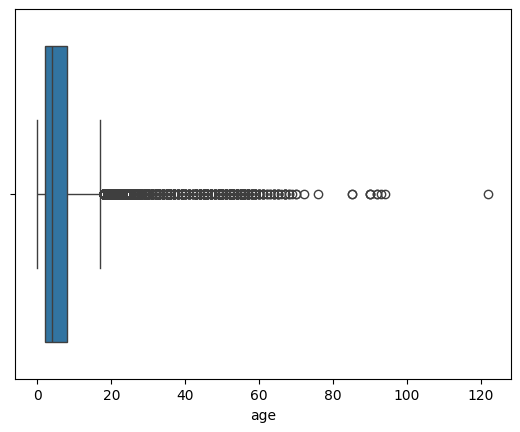

In [1352]:
sns.boxplot(data = df, x = 'age');

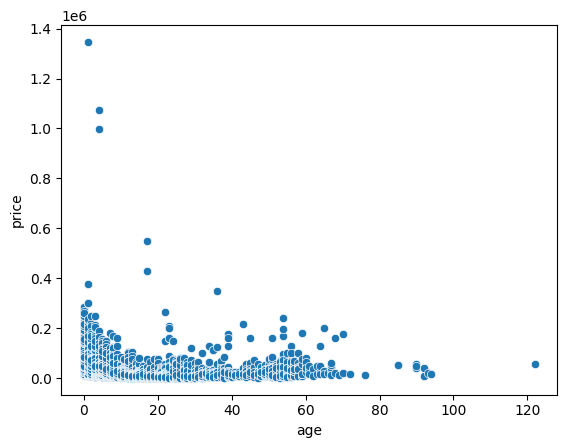

In [1353]:
sns.scatterplot(data = df, x = 'age', y = 'price');

In [1354]:
df.age.describe()

count    25061.000000
mean         6.846016
std          8.608165
min          0.000000
25%          2.000000
50%          4.000000
75%          8.000000
max        122.000000
Name: age, dtype: float64

In [1355]:
df[df['age'] > 65][['make_model','age', 'mileage']]

,make_model,age,mileage
26830,Peugeot,66.0,41170.0
26831,Ford Thunderbird,67.0,60000.0
26832,Ford Thunderbird,67.0,35000.0
26833,Ford Thunderbird,67.0,1.0
26834,Ford Thunderbird V8,67.0,23984.0
26835,Volvo,67.0,12100.0
26836,Fiat,68.0,59055.0
26838,Volvo PV544,68.0,99300.0
26839,Volvo,69.0,46000.0
26840,Mercedes-Benz 220,70.0,64000.0


In [1356]:
df[df['age'] > 65].index

Index([26830, 26831, 26832, 26833, 26834, 26835, 26836, 26838, 26839, 26840,
       26841, 26842, 26843, 26844, 26845, 26847, 26848, 26849, 26850, 26851,
       26852, 26853, 26854],
      dtype='int64')

In [1357]:
df.groupby(['age', 'mileage'])[['make_model', 'price']].value_counts()

age    mileage  make_model      price  
0.0    0.0      Dacia Lodgy     19500.0    1
                Toyota Mirai    75990.0    1
                Toyota Camry    45950.0    1
                Skoda Scala     33117.0    1
                Skoda Kamiq     22790.0    1
                                          ..
92.0   1233.0   Peugeot         8950.0     1
       60000.0  Ford  Roadster  40000.0    1
93.0   65515.0  Ford M          20000.0    1
94.0   5000.0   Ford            14490.0    1
122.0  10.0     Ford Bronco     57480.0    1
Name: count, Length: 23520, dtype: int64

In [1358]:
z_scores = stats.zscore(df['age'])
abs_z_scores = np.abs(z_scores)
outliers = df[abs_z_scores > 3]
outliers

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make
26320,Nissan 200 SX,25000.0,Coupe,Used,2.0,No,145750.0,Manual,Benzine,White,...,Basic,Enhanced,Advanced,6.0,NaN,-0.557857,0.057688,1.115501,-0.020221,Nissan
26321,Nissan 200 SX,22000.0,Coupe,Used,2.0,No,77000.0,Manual,Benzine,White,...,Enhanced,Basic,Advanced,5.0,NaN,-0.557857,-0.060596,0.091305,-0.020221,Nissan
26322,Nissan 200 SX,15000.0,Coupe,Used,3.0,No,128000.0,Manual,Benzine,Grey,...,Enhanced,Basic,Advanced,5.0,NaN,-0.557857,-0.336592,0.851072,-0.020221,Nissan
26323,Nissan Datsun,37890.0,Coupe,Used,3.0,No,2500.0,Manual,Benzine,Brown,...,Basic,Enhanced,Advanced,6.0,NaN,-0.557857,0.565915,-1.018551,-0.020221,Nissan
26324,Opel Manta,18990.0,Coupe,Used,3.0,No,37000.0,Manual,Benzine,White,...,Enhanced,Basic,Advanced,3.0,NaN,-0.557857,-0.179274,-0.504591,-0.020221,Opel
26326,Peugeot 205,14900.0,Compact,Used,2.0,No,144900.0,Manual,Benzine,Grey,...,Basic,Basic,Advanced,2.0,NaN,-0.557857,-0.340535,1.102838,-0.020221,Peugeot
26327,Peugeot 205,14950.0,Convertible,Used,2.0,No,144500.0,Manual,Benzine,Silver,...,Basic,Basic,Advanced,3.0,NaN,-0.557857,-0.338563,1.096879,-0.020221,Peugeot
26328,Peugeot 205,10995.0,Convertible,Used,2.0,No,182200.0,Manual,Benzine,Grey,...,Basic,Enhanced,Advanced,3.0,NaN,-0.557857,-0.494501,1.658511,-0.020221,Peugeot
26329,Peugeot 205,4900.0,Convertible,Used,2.0,Yes,110789.0,Manual,Benzine,Grey,...,Basic,Enhanced,Advanced,3.0,NaN,-0.557857,-0.734815,0.594673,-0.020221,Peugeot
26330,Peugeot 205,21900.0,Sedan,Used,3.0,No,111800.0,Manual,Benzine,Black,...,Enhanced,Basic,Advanced,3.0,NaN,-0.557857,-0.064539,0.609735,-0.020221,Peugeot


In [1359]:
Q1 = df['age'].quantile(0.25)
Q3 = df['age'].quantile(0.75)

# IQR hesaplama
IQR = Q3 - Q1

# Alt ve üst sınırlar
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 5 * IQR

# Uç değerleri tespit etme
outliers = df[df['age'] > upper_bound]

In [1360]:
outliers

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make
26444,Fiat 126,5900.0,Sedan,Used,2.0,No,54100.0,Manual,Benzine,Grey,...,Enhanced,Basic,Advanced,2.0,NaN,-1.217254,-0.695387,-0.249845,-1.900207,Fiat
26445,Fiat Ritmo,18600.0,Coupe,Used,2.0,No,144000.0,Manual,Benzine,Silver,...,Enhanced,Basic,Advanced,2.0,NaN,-0.557857,-0.194651,1.089431,-0.020221,Fiat
26446,Ford Capri,6900.0,Coupe,Used,2.0,No,99000.0,Manual,Benzine,Black,...,Enhanced,Basic,Advanced,2.0,NaN,0.101540,-0.655959,0.419048,3.739751,Ford
26447,Mercedes-Benz 230,128000.0,Convertible,Used,2.0,No,88000.0,Manual,Benzine,Silver,...,Enhanced,Basic,Advanced,2.0,NaN,2.079732,4.118771,0.255176,3.739751,Mercedes-Benz
26448,Mercedes-Benz 230,9990.0,Coupe,Used,2.0,No,262000.0,Manual,Benzine,Grey,...,Enhanced,Basic,Advanced,2.0,NaN,0.760938,-0.534126,2.847324,1.859765,Mercedes-Benz
26449,Mercedes-Benz 500,45000.0,Convertible,Used,2.0,No,69900.0,Automatic,Benzine,White,...,Enhanced,Basic,Advanced,2.0,NaN,-1.217254,0.846248,-0.014466,3.739751,Mercedes-Benz
26450,Mercedes-Benz SL 380,28490.0,Convertible,Used,2.0,No,99999.0,Automatic,Benzine,Silver,...,Basic,Basic,Advanced,2.0,NaN,0.101540,0.195292,0.433930,3.739751,Mercedes-Benz
26451,Nissan 280 ZX,17950.0,Coupe,Used,2.0,No,102177.0,Automatic,Benzine,Brown,...,Basic,Advanced,Advanced,2.0,NaN,-0.557857,-0.220279,0.466377,1.859765,Nissan
26452,Opel Monza,6500.0,Coupe,Used,3.0,No,2300.0,Manual,LPG,Red,...,Enhanced,Basic,Advanced,2.0,NaN,-0.557857,-0.671730,-1.021531,1.859765,Opel
26453,Peugeot 505,17500.0,Sedan,Used,4.0,No,160000.0,Manual,Benzine,Grey,...,Enhanced,Basic,Advanced,2.0,NaN,-0.557857,-0.238022,1.327789,-0.020221,Peugeot


In [1361]:
# drop

drop_age_index = df[df['age'] > 65].index
drop_age_index

Index([26830, 26831, 26832, 26833, 26834, 26835, 26836, 26838, 26839, 26840,
       26841, 26842, 26843, 26844, 26845, 26847, 26848, 26849, 26850, 26851,
       26852, 26853, 26854],
      dtype='int64')

In [1362]:
df.drop(index=drop_age_index ,inplace=True)

# MAKE_MODEL

In [1363]:
no_model_df = df[~df['make_model'].str.split('').str[0].isin(df.make_model)]
no_model_df 

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make
5,Dacia Duster,21000.0,Off-Road/Pick-up,Pre-registered,5.0,Yes,1000.0,Manual,Diesel,Orange,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,-0.100024,-1.040897,-0.020221,Dacia
6,Dacia Duster,21000.0,Off-Road/Pick-up,Pre-registered,5.0,Yes,1000.0,Manual,Diesel,Orange,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,-0.100024,-1.040897,-0.020221,Dacia
7,Dacia Duster,21150.0,Off-Road/Pick-up,Demonstration,5.0,Yes,4500.0,Manual,Benzine,Black,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,-0.094110,-0.988756,-0.020221,Dacia
8,Dacia Duster,25190.0,Off-Road/Pick-up,Demonstration,5.0,No,4018.0,Manual,Benzine,Black,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,0.065179,-0.995937,-0.020221,Dacia
10,Dacia Duster,24222.0,Off-Road/Pick-up,Demonstration,5.0,No,8000.0,Automatic,Benzine,Black,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,0.027013,-0.936615,-0.020221,Dacia
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26825,Peugeot,16500.0,Sedan,Used,4.0,No,84380.0,Manual,Benzine,Black,...,Basic,Advanced,Enhanced,3.0,NaN,-1.876651,-0.277450,0.201248,-0.020221,Peugeot
26826,Ford Mercury,26750.0,Coupe,Used,3.0,No,124000.0,Automatic,Benzine,White,...,Basic,Advanced,Advanced,2.0,NaN,-2.536049,0.126687,0.791483,3.739751,Ford
26827,Ford Thunderbird,28900.0,Convertible,Used,3.0,No,30000.0,Automatic,Benzine,Red,...,Basic,Enhanced,Advanced,4.0,NaN,-1.876651,0.211457,-0.608873,3.739751,Ford
26828,Mercedes-Benz 190,199999.0,Convertible,Used,2.0,No,5650.0,Manual,Benzine,Grey,...,Basic,Enhanced,Advanced,3.0,NaN,-1.217254,6.957546,-0.971624,-0.020221,Mercedes-Benz


In [1364]:
df[df['make_model'].str.split().str.len() == 1]

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make
289,Fiat,27975.0,Compact,Demonstration,3.0,Yes,6000.0,Automatic,Benzine,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,-3.195446,0.174986,-0.966410,0.919772,Fiat
847,Hyundai,22480.0,Compact,Demonstration,5.0,No,3000.0,Manual,Benzine,Green,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,-0.041671,-1.011102,-0.960214,Hyundai
851,Hyundai,21390.0,Station wagon,Pre-registered,4.0,No,10.0,Manual,Benzine,Grey,...,Advanced,Advanced,Enhanced,5.0,NaN,0.101540,-0.084647,-1.055646,-0.960214,Hyundai
852,Hyundai,40067.0,Sedan,Pre-registered,5.0,No,12.0,Manual,Benzine,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,0.651749,-1.055616,-0.020221,Hyundai
853,Hyundai,38769.0,Sedan,Pre-registered,5.0,No,12.0,Manual,Benzine,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,0.101540,0.600572,-1.055616,-0.020221,Hyundai
1147,Mercedes-Benz,159850.0,Convertible,Demonstration,2.0,Yes,2001.0,Automatic,Benzine,White,...,Advanced,Advanced,Advanced,5.0,NaN,0.760938,5.374552,-1.025985,-0.020221,Mercedes-Benz
1148,Mercedes-Benz,151099.0,Convertible,Demonstration,2.0,Yes,6000.0,Automatic,Benzine,Blue,...,Advanced,Advanced,Advanced,5.0,NaN,0.760938,5.029518,-0.966410,-0.020221,Mercedes-Benz
1149,Mercedes-Benz,132999.0,Convertible,Demonstration,2.0,Yes,10000.0,Automatic,Benzine,Blue,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,4.315871,-0.906821,1.859765,Mercedes-Benz
1150,Mercedes-Benz,132880.0,Convertible,Demonstration,3.0,Yes,5000.0,Automatic,Benzine,White,...,Advanced,Advanced,Advanced,5.0,NaN,0.760938,4.311179,-0.981308,-0.020221,Mercedes-Benz
1151,Mercedes-Benz,214885.0,Coupe,Demonstration,4.0,Yes,6900.0,Automatic,Benzine,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,0.760938,7.544471,-0.953002,3.739751,Mercedes-Benz


In [1365]:
df[df['make_model'].str.split().str.len() == 1].index

Index([  289,   847,   851,   852,   853,  1147,  1148,  1149,  1150,  1151,
       ...
       26722, 26723, 26724, 26788, 26797, 26798, 26799, 26815, 26818, 26825],
      dtype='int64', length=170)

In [1366]:
drop_make_model_index = df[df['make_model'].str.split().str.len() == 1].index
drop_make_model_index

Index([  289,   847,   851,   852,   853,  1147,  1148,  1149,  1150,  1151,
       ...
       26722, 26723, 26724, 26788, 26797, 26798, 26799, 26815, 26818, 26825],
      dtype='int64', length=170)

In [1367]:
df.drop(index=drop_make_model_index,inplace=True)

# PRICE

In [1368]:
df.price.describe()

count    2.486800e+04
mean     2.327586e+04
std      2.477915e+04
min      4.900000e+02
25%      1.190000e+04
50%      1.799000e+04
75%      2.790000e+04
max      1.346900e+06
Name: price, dtype: float64

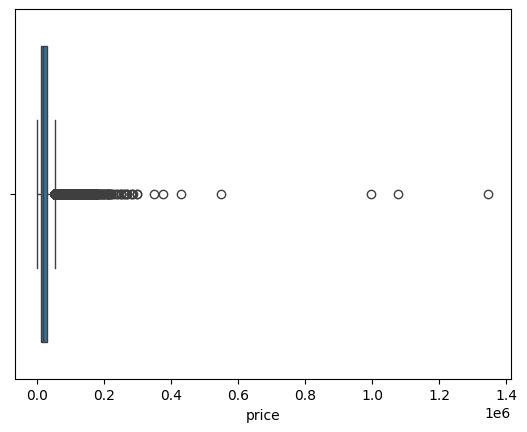

In [1369]:
sns.boxplot(data = df, x = 'price');

In [1370]:
df[df['price'] > 250000][['make_model', 'price', 'mileage', 'age', 'power_kW']]

,make_model,price,mileage,age,power_kW
1181,Mercedes-Benz AMG GT Roadster,283900.0,3569.0,0.0,409.000000
1355,Mercedes-Benz G 63 AMG,268900.0,1800.0,0.0,430.000000
1357,Mercedes-Benz G 63 AMG,259880.0,9900.0,0.0,430.000000
1358,Mercedes-Benz G 63 AMG,279063.0,9900.0,0.0,430.000000
1359,Mercedes-Benz G 63 AMG,284780.0,9900.0,0.0,430.000000
1360,Mercedes-Benz G 63 AMG G 63,267810.0,3003.0,0.0,430.000000
1361,Mercedes-Benz G 63 AMG G 63,259000.0,4003.0,0.0,430.000000
3491,Ford GT,1346900.0,3500.0,1.0,388.250000
4100,Mercedes-Benz G 63 AMG,375900.0,100.0,1.0,430.000000
4143,Mercedes-Benz GLE 63 AMG GLE 63,299000.0,8000.0,1.0,430.000000


In [1371]:
z_scores = stats.zscore(df['price'])
abs_z_scores = np.abs(z_scores)

# Z-skoru 3'ten büyük olan uç değerler
outliers_price = df[abs_z_scores > 3]
outliers_price

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make
743,Ford Mustang,147750.0,Coupe,Used,3.0,No,1500.0,Automatic,Benzine,Black,...,Advanced,Advanced,Advanced,5.0,NaN,0.760938,4.897473,-1.033448,1.859765,Ford
1157,Mercedes-Benz S 580e,178890.0,Sedan,Demonstration,4.0,Yes,9900.0,Automatic,Benzine,Black,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,6.125261,-0.908310,1.859765,Mercedes-Benz
1172,Mercedes-Benz AMG GT,224885.0,Coupe,Demonstration,4.0,Yes,9900.0,Automatic,Benzine,Green,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,7.938751,-0.908310,3.739751,Mercedes-Benz
1173,Mercedes-Benz AMG GT,171950.0,Coupe,Demonstration,3.0,Yes,3001.0,Automatic,Benzine,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,0.760938,5.851631,-1.011087,3.739751,Mercedes-Benz
1174,Mercedes-Benz AMG GT,137880.0,Coupe,Used,5.0,Yes,8183.0,Automatic,Benzine,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,4.508319,-0.933889,1.859765,Mercedes-Benz
1175,Mercedes-Benz AMG GT,215550.0,Coupe,Demonstration,5.0,Yes,3001.0,Automatic,Benzine,Grey,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,7.570691,-1.011087,3.739751,Mercedes-Benz
1176,Mercedes-Benz AMG GT,132880.0,Coupe,Used,5.0,Yes,5726.0,Automatic,Benzine,White,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,4.311179,-0.970492,1.859765,Mercedes-Benz
1177,Mercedes-Benz AMG GT,105980.0,Coupe,Used,5.0,Yes,4921.0,Automatic,Benzine,White,...,Advanced,Advanced,Advanced,5.0,NaN,2.079732,3.250566,-0.982484,1.859765,Mercedes-Benz
1179,Mercedes-Benz AMG GT Roadster,176855.0,Convertible,Employee's car,2.0,Yes,5135.0,Automatic,Benzine,White,...,Advanced,Advanced,Advanced,5.0,NaN,0.760938,6.045025,-0.979296,3.739751,Mercedes-Benz
1180,Mercedes-Benz AMG GT Roadster,189950.0,Convertible,Employee's car,2.0,Yes,8925.0,Automatic,Benzine,White,...,Advanced,Advanced,Advanced,5.0,NaN,0.760938,6.561334,-0.922835,3.739751,Mercedes-Benz


In [1372]:
outliers_price.sort_values(by='age', ascending = False).head(30)

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,safety_security_package,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make
26828,Mercedes-Benz 190,199999.0,Convertible,Used,2.0,No,5650.0,Manual,Benzine,Grey,...,Basic,Enhanced,Advanced,3.0,NaN,-1.217254,6.957546,-0.971624,-0.020221,Mercedes-Benz
26824,Mercedes-Benz 220,129000.0,Convertible,Used,2.0,No,35633.0,Manual,Benzine,Silver,...,Basic,Advanced,Enhanced,3.0,NaN,-1.217254,4.158199,-0.524956,1.859765,Mercedes-Benz
26804,Mercedes-Benz 190,180000.0,Convertible,Used,2.0,No,10.0,Manual,Benzine,Grey,...,Basic,Advanced,Advanced,3.0,NaN,-1.217254,6.169026,-1.055646,-0.020221,Mercedes-Benz
26794,Renault Alpine A110,98500.0,Coupe,Used,2.0,No,43236.0,Manual,Benzine,Blue,...,Advanced,Advanced,Advanced,6.0,NaN,-1.217254,2.955645,-0.411691,-0.020221,Renault
26754,Mercedes-Benz 280,99888.0,Convertible,Used,2.0,No,71198.0,Manual,Benzine,Silver,...,Basic,Enhanced,Advanced,2.0,NaN,-1.217254,3.010371,0.004870,1.859765,Mercedes-Benz
26730,Ford GT V8,129950.0,Coupe,Used,2.0,Yes,33809.0,Manual,Benzine,Blue,...,Basic,Basic,Advanced,2.0,NaN,-0.557857,4.195655,-0.552128,3.739751,Ford
26711,Ford Mustang V8,99500.0,Coupe,Used,2.0,No,94665.0,Manual,Benzine,Black,...,Enhanced,Advanced,Advanced,3.0,NaN,-1.217254,2.995073,0.354468,3.739751,Ford
26670,Ford INTERMECCANICA SPYDER,240000.0,Convertible,Used,2.0,No,1000.0,Manual,Benzine,Black,...,Enhanced,Basic,Advanced,4.0,NaN,-0.557857,8.534705,-1.040897,3.739751,Ford
26671,Ford GT,169950.0,Coupe,Used,2.0,Yes,202.0,Manual,Benzine,Black,...,Enhanced,Advanced,Advanced,3.0,NaN,-1.217254,5.772775,-1.052785,3.739751,Ford
26677,Ford Mustang,197400.0,Coupe,Used,2.0,No,45000.0,Manual,Benzine,Black,...,Enhanced,Basic,Advanced,4.0,NaN,0.101540,6.855073,-0.385412,1.859765,Ford


In [1373]:
# IQR hesaplama
Q1 = df['price'].quantile(0.25)
Q3 = df['price'].quantile(0.75)
IQR = Q3 - Q1

# Outlier sınırları
lower_bound = Q1 - 3 * IQR
upper_bound = Q3 + 3 * IQR

# Outliers tespiti
outliers_pri = df[(df['price'] < lower_bound) | (df['price'] > upper_bound)]
outliers_pri
print(Q1)
print(Q3)
print(IQR)
print(lower_bound)
print(upper_bound)

11900.0
27900.0
16000.0
-36100.0
75900.0


In [1374]:
df.price.min()

490.0

In [1375]:
# Z-skoru hesaplama
mean_price = df['price'].mean()
std_price = df['price'].std()
df['z_score'] = (df['price'] - mean_price) / std_price

# Aykırı değerlerin belirlenmesi (genellikle z-skoru > 3 veya z-skoru < -3 aykırı kabul edilir)
outliers_x = df[np.abs(df['z_score']) > 3]
outliers_x

,make_model,price,body_type,type,doors,warranty,mileage,gearbox,fuel_type,colour,...,comfort_convenience_package,ent_media_package,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,make,z_score
743,Ford Mustang,147750.0,Coupe,Used,3.0,No,1500.0,Automatic,Benzine,Black,...,Advanced,Advanced,5.0,NaN,0.760938,4.897473,-1.033448,1.859765,Ford,5.023342
1157,Mercedes-Benz S 580e,178890.0,Sedan,Demonstration,4.0,Yes,9900.0,Automatic,Benzine,Black,...,Advanced,Advanced,5.0,NaN,2.079732,6.125261,-0.908310,1.859765,Mercedes-Benz,6.280044
1172,Mercedes-Benz AMG GT,224885.0,Coupe,Demonstration,4.0,Yes,9900.0,Automatic,Benzine,Green,...,Advanced,Advanced,5.0,NaN,2.079732,7.938751,-0.908310,3.739751,Mercedes-Benz,8.136242
1173,Mercedes-Benz AMG GT,171950.0,Coupe,Demonstration,3.0,Yes,3001.0,Automatic,Benzine,Grey,...,Advanced,Advanced,5.0,NaN,0.760938,5.851631,-1.011087,3.739751,Mercedes-Benz,5.999970
1174,Mercedes-Benz AMG GT,137880.0,Coupe,Used,5.0,Yes,8183.0,Automatic,Benzine,Grey,...,Advanced,Advanced,5.0,NaN,2.079732,4.508319,-0.933889,1.859765,Mercedes-Benz,4.625023
1175,Mercedes-Benz AMG GT,215550.0,Coupe,Demonstration,5.0,Yes,3001.0,Automatic,Benzine,Grey,...,Advanced,Advanced,5.0,NaN,2.079732,7.570691,-1.011087,3.739751,Mercedes-Benz,7.759514
1176,Mercedes-Benz AMG GT,132880.0,Coupe,Used,5.0,Yes,5726.0,Automatic,Benzine,White,...,Advanced,Advanced,5.0,NaN,2.079732,4.311179,-0.970492,1.859765,Mercedes-Benz,4.423241
1177,Mercedes-Benz AMG GT,105980.0,Coupe,Used,5.0,Yes,4921.0,Automatic,Benzine,White,...,Advanced,Advanced,5.0,NaN,2.079732,3.250566,-0.982484,1.859765,Mercedes-Benz,3.337651
1179,Mercedes-Benz AMG GT Roadster,176855.0,Convertible,Employee's car,2.0,Yes,5135.0,Automatic,Benzine,White,...,Advanced,Advanced,5.0,NaN,0.760938,6.045025,-0.979296,3.739751,Mercedes-Benz,6.197919
1180,Mercedes-Benz AMG GT Roadster,189950.0,Convertible,Employee's car,2.0,Yes,8925.0,Automatic,Benzine,White,...,Advanced,Advanced,5.0,NaN,0.760938,6.561334,-0.922835,3.739751,Mercedes-Benz,6.726387


In [1376]:
outliers_x.describe()

,price,doors,mileage,seats,engine_size,gears,co2_emissions,cylinders,empty_weight,power_kW,fuel_consumption_comb,age,num_of_extras,index,z_score_gears,price_zscore,mileage_zscore,cylinders_zscore,z_score
count,3.390000e+02,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,339.000000,0.0,339.000000,339.000000,339.000000,339.000000,339.000000
mean,1.537420e+05,3.348083,23087.238938,4.185841,3496.112094,7.053097,210.091445,6.734513,2017.173304,339.435735,9.347321,5.241888,6.463127,NaN,0.795950,5.133726,-0.711855,2.550202,5.265159
std,1.077258e+05,1.283632,28959.343076,1.086893,1131.908716,2.365334,104.901985,1.391124,350.650213,87.182174,2.858273,11.733501,3.010971,NaN,1.559695,4.247412,0.431419,1.307647,4.347438
min,9.768500e+04,2.000000,10.000000,2.000000,1000.000000,1.000000,0.000000,4.000000,1050.000000,77.000000,3.447727,0.000000,2.000000,NaN,-3.195446,2.923511,-1.055646,-0.020221,3.002893
25%,1.108900e+05,2.000000,4900.000000,4.000000,2925.000000,6.000000,188.000000,6.000000,1746.000000,273.006701,6.800000,0.000000,5.000000,NaN,0.101540,3.444158,-0.982797,1.859765,3.535801
50%,1.299000e+05,3.000000,9900.000000,4.000000,3799.000000,7.000000,252.000000,6.000000,1992.000000,350.000000,10.400000,1.000000,5.000000,NaN,0.760938,4.193684,-0.908310,1.859765,4.302978
75%,1.629300e+05,5.000000,31942.500000,5.000000,3982.000000,9.000000,275.500000,8.000000,2324.000000,419.000000,11.800000,4.000000,9.000000,NaN,2.079732,5.495990,-0.579934,3.739751,5.635954
max,1.346900e+06,5.000000,188588.000000,7.000000,5980.000000,10.000000,420.000000,12.000000,2690.000000,450.000000,12.900000,65.000000,17.000000,NaN,2.739129,52.177543,1.753676,7.499723,53.416854


In [1377]:
outliers_x.index

Index([  743,  1157,  1172,  1173,  1174,  1175,  1176,  1177,  1179,  1180,
       ...
       26670, 26671, 26677, 26711, 26730, 26754, 26794, 26804, 26824, 26828],
      dtype='int64', length=339)

In [1378]:
drop_price_indexes = outliers_x.index
drop_price_indexes
df.drop(index=drop_price_indexes,inplace=True)

In [1379]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 24529 entries, 5 to 26829
Data columns (total 43 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   make_model                   24529 non-null  object 
 1   price                        24529 non-null  float64
 2   body_type                    24529 non-null  object 
 3   type                         24529 non-null  object 
 4   doors                        24529 non-null  float64
 5   warranty                     24529 non-null  object 
 6   mileage                      24529 non-null  float64
 7   gearbox                      24529 non-null  object 
 8   fuel_type                    24529 non-null  object 
 9   colour                       24529 non-null  object 
 10  paint                        24529 non-null  object 
 11  seller                       24529 non-null  object 
 12  seats                        24529 non-null  float64
 13  engine_size          

In [1382]:
df.drop(columns=['index','location_country', 'z_score_gears', 'price_zscore', 'mileage_zscore', 'cylinders_zscore', 'make', 'z_score', 'cylinders'], inplace=True)

KeyError: "['index', 'location_country', 'z_score_gears', 'price_zscore', 'mileage_zscore', 'cylinders_zscore', 'make', 'z_score', 'cylinders'] not found in axis"

In [1383]:
df.reset_index(drop=True, inplace=True)

In [1384]:
df.to_csv('final_scout_not_dummy.csv',index=False)

# Paint

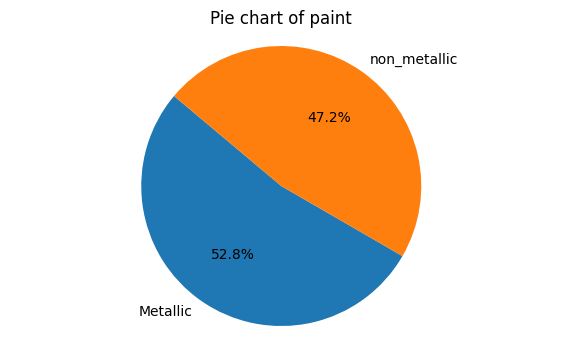

In [1387]:
pie_chart_column(df,'paint')

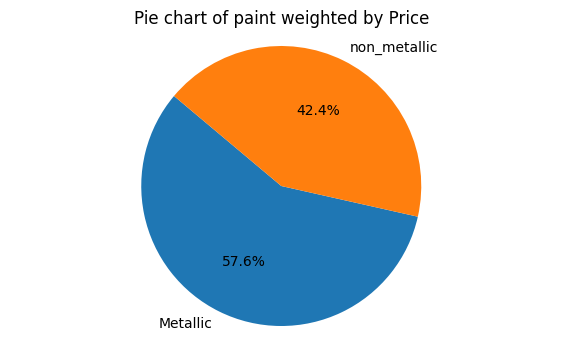

In [1388]:
pie_chart_with_price(df,'paint')

# 2.Color

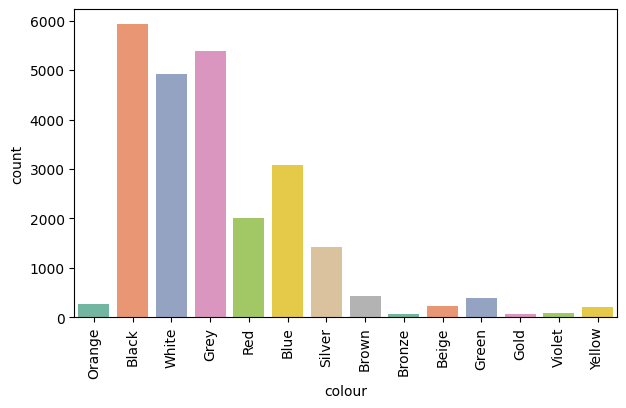

In [1504]:
count_plot_column(df,'colour')

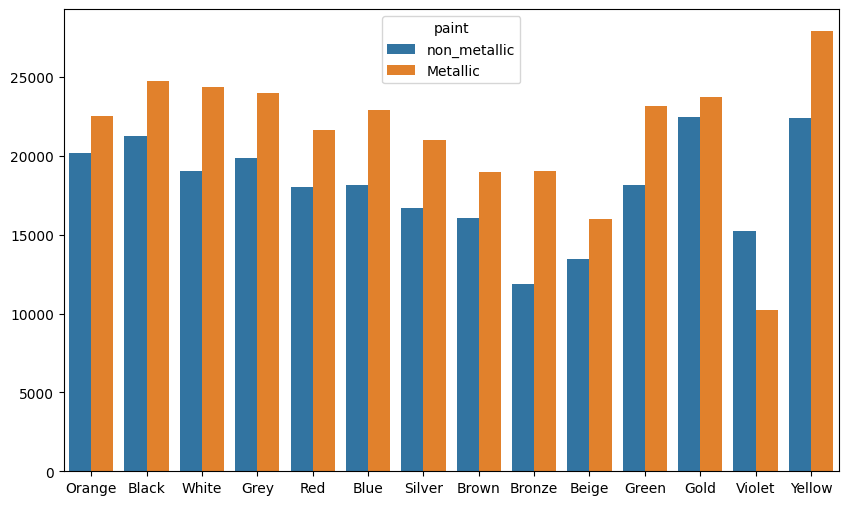

In [1395]:
barplot_column(df,'colour','price', hue_col ='paint')

# 3. Make Model

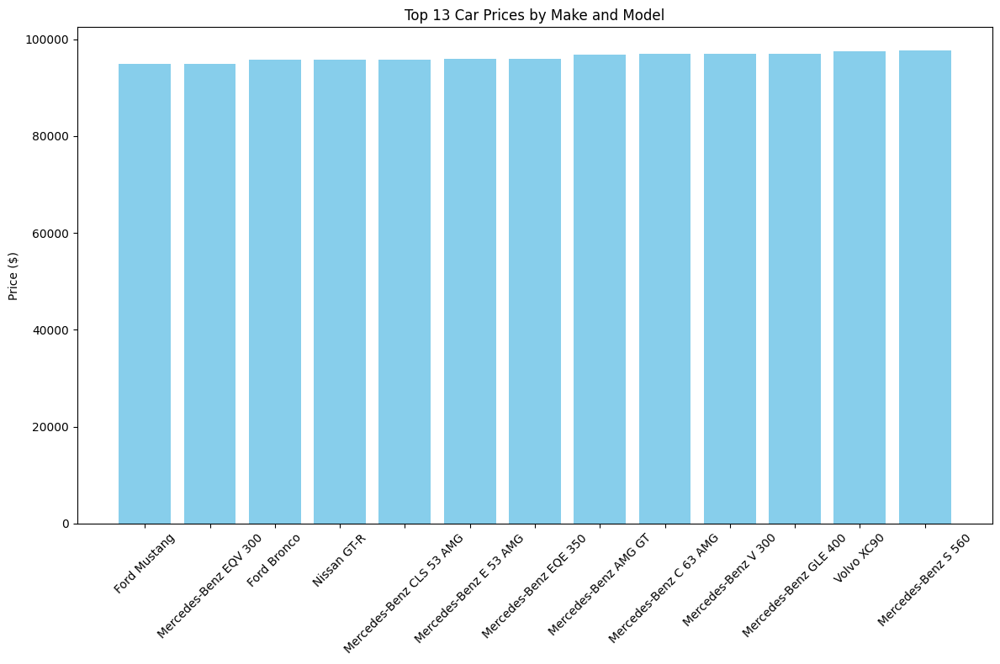

In [1429]:

# Group by 'make_model' and get the top 20 prices for each group
top_prices = df.groupby('make_model')['price'].nlargest(13).reset_index(level=0, drop=True)

# Since we want the top 13 prices overall, we need to reset the index and sort by price
top_prices_df = df.loc[top_prices.index].sort_values(by='price', ascending=False).head(20)

# Extracting the make/model names and prices for plotting
makes_models = top_prices_df['make_model']
prices = top_prices_df['price']

# Create the bar plot
plt.figure(figsize=(12, 8))
plt.bar(makes_models, prices, color='skyblue')
plt.ylabel('Price ($)')
plt.title('Top 13 Car Prices by Make and Model')
plt.xticks(rotation=45)  # Rotate x-axis labels for better readability
plt.gca().invert_xaxis()  # Invert x-axis to have the highest price on the right
plt.tight_layout()  # Adjust layout to prevent clipping of labels
plt.show()

# 4. Body Type

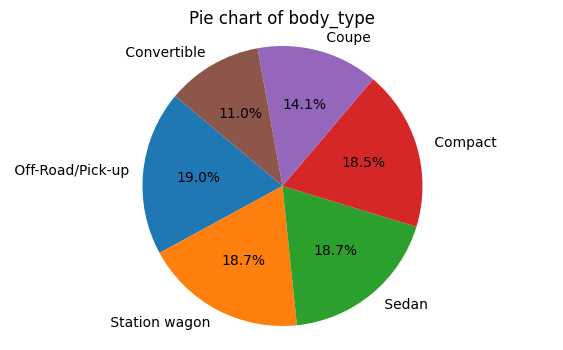

In [1430]:
pie_chart_column(df,'body_type')

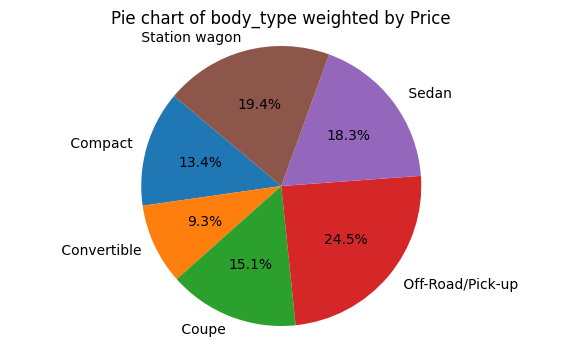

In [1431]:
pie_chart_with_price(df,'body_type')

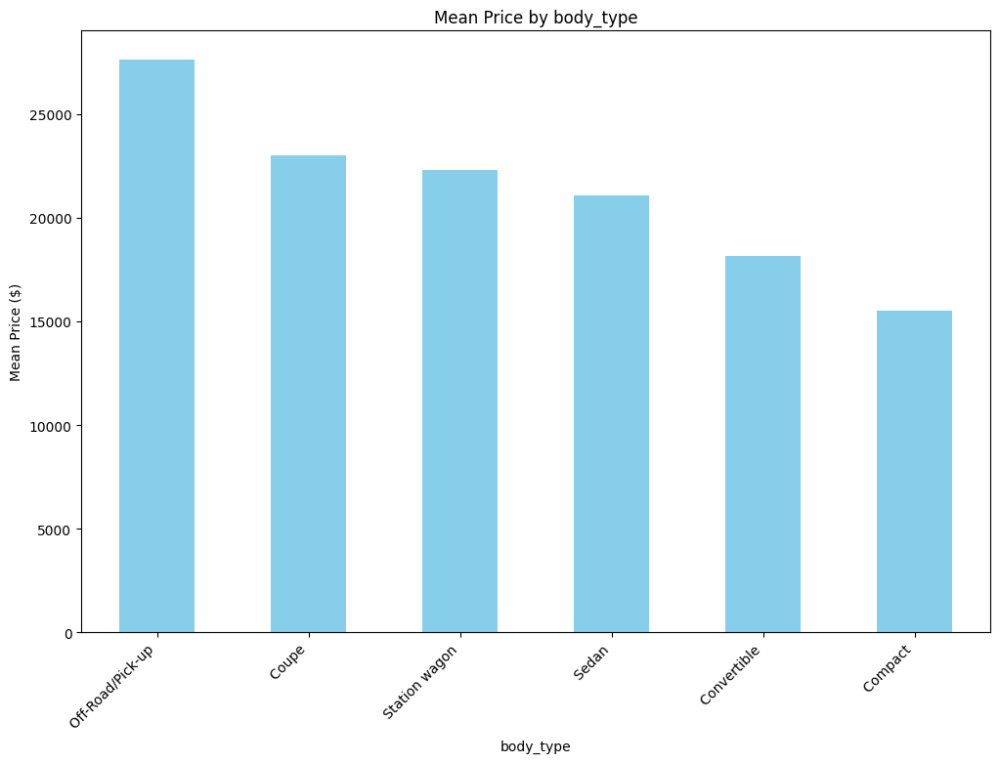

In [1436]:
barplot_column_by_price(df,'body_type')

# 5. Type

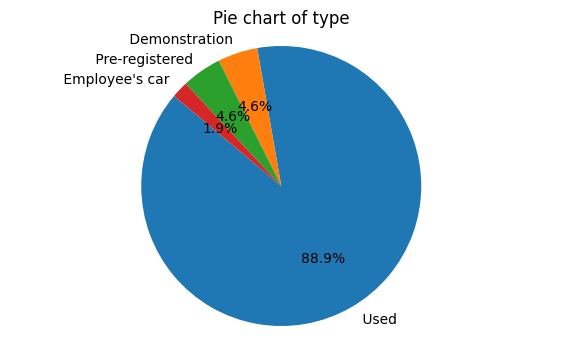

In [1437]:
pie_chart_column(df,'type')

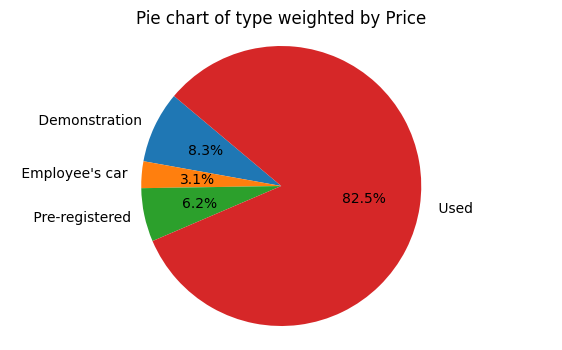

In [1438]:
pie_chart_with_price(df,'type')

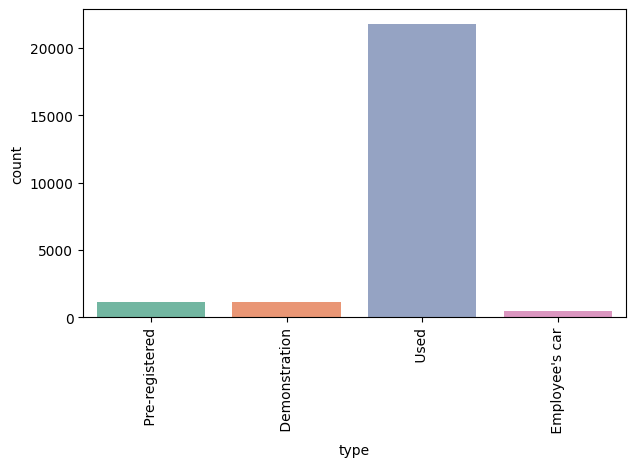

In [1439]:
count_plot_column(df,'type')

In [1470]:
def count_plot_with_price1(df_grouped, x):
    """
    Creates a count plot with the mean price represented by the height of the bars.

    Parameters:
    df_grouped (pd.Series): Grouped Series containing the mean price for each category
    x (str): The column name for the x-axis
    """
    # Convert the grouped Series to a DataFrame
    df_plot = df_grouped.reset_index()

    # Create the count plot
    plt.figure(figsize=(7, 4))
    ax = sns.countplot(data=df_plot, x=x, palette='viridis')
    
    # Add mean price as text on top of each bar
    for p in ax.patches:
        ax.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', fontsize=10, color='black', xytext=(0, 5),
                    textcoords='offset points')

    plt.xlabel(x.capitalize())
    plt.ylabel('Count')
    plt.title(f'Count Plot with Value Counts by {x.capitalize()}')
    plt.show()

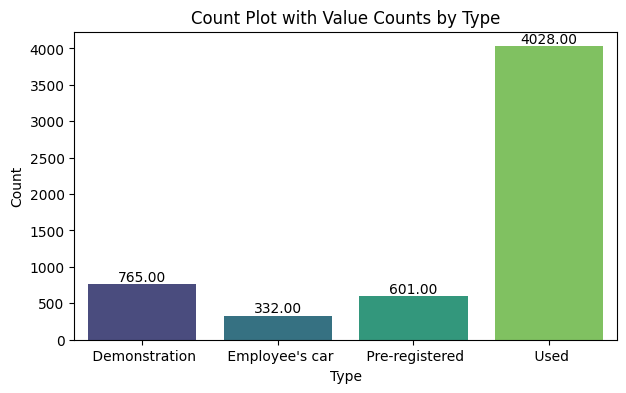

In [1471]:
    
 # Group by 'type' and calculate the mean price for each category
mean_prices_by_type = df.groupby('type')['price'].value_counts()

# Create the count plot with mean price
count_plot_with_price1(mean_prices_by_type, 'type')   

# 6. Warranty

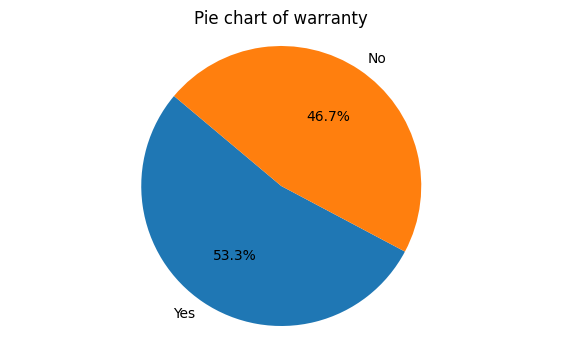

In [1472]:
pie_chart_column(df,'warranty')

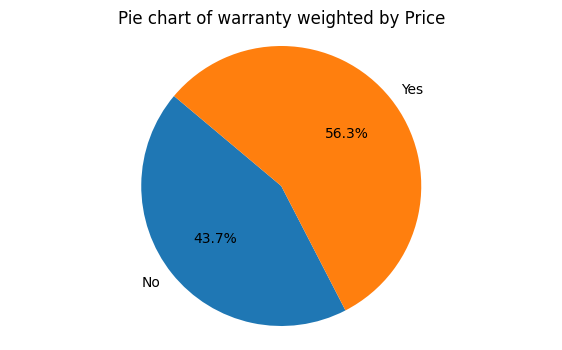

In [1473]:
pie_chart_with_price(df,'warranty')

# 7. Gearbox

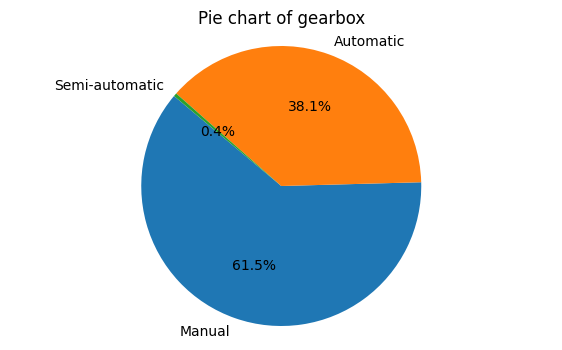

In [1474]:
pie_chart_column(df,'gearbox')

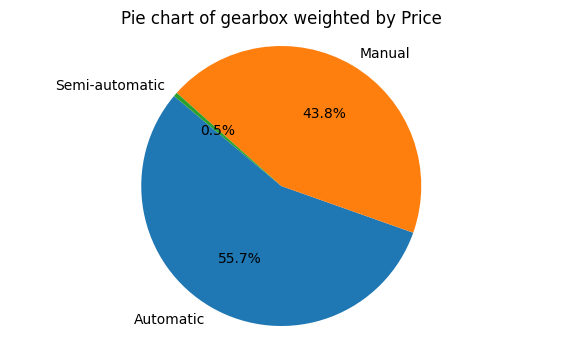

In [1476]:
pie_chart_with_price(df,'gearbox')

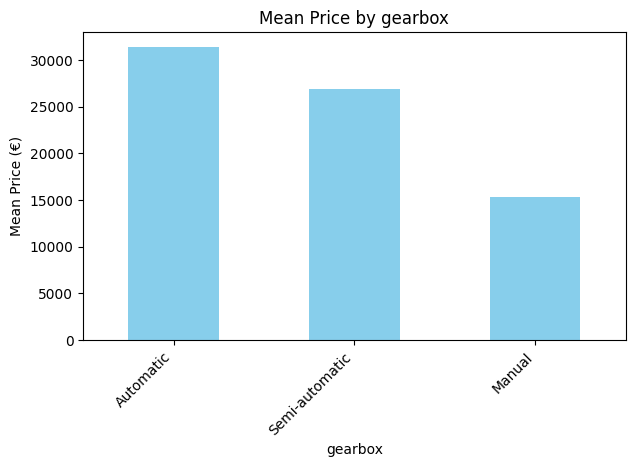

In [1505]:
plot_column_by_price(df,'gearbox')

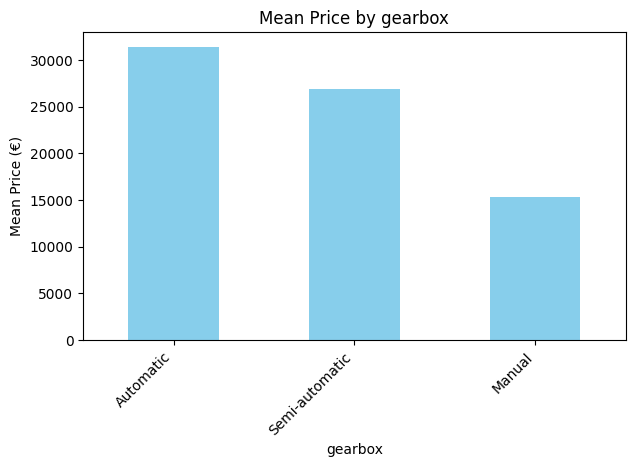

In [1480]:
plot_column_by_price(df,'gearbox')

# 8. Fuel Type

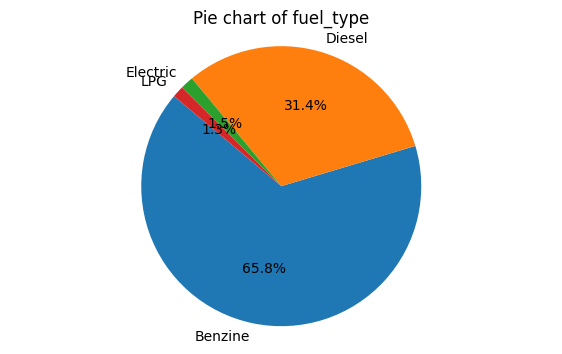

In [1481]:
pie_chart_column(df,'fuel_type')

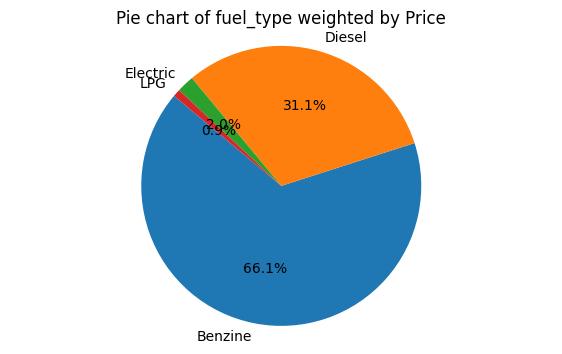

In [1482]:
pie_chart_with_price(df,'fuel_type')

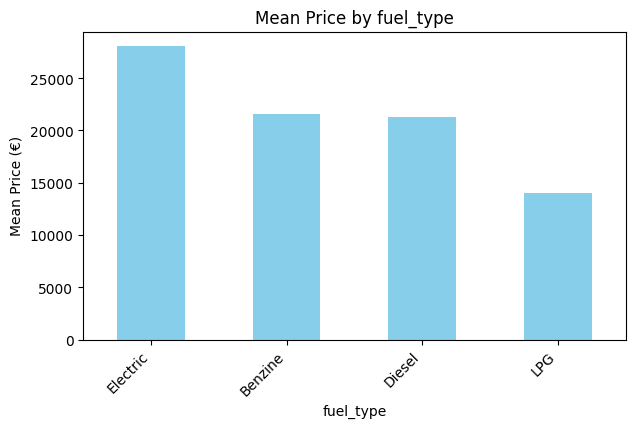

In [1506]:
plot_column_by_price(df,'fuel_type')

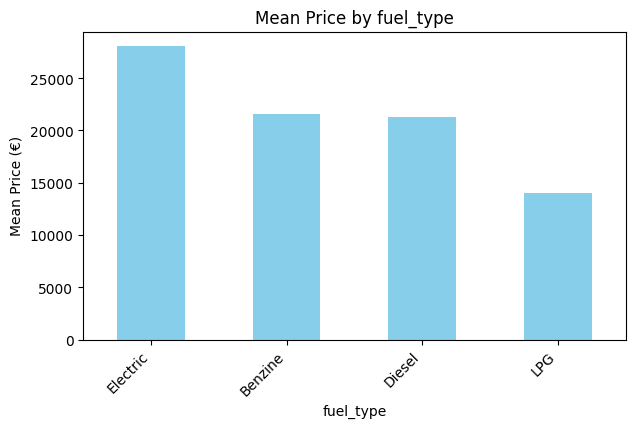

In [1484]:
plot_column_by_price(df,'fuel_type')

# 9. Seller

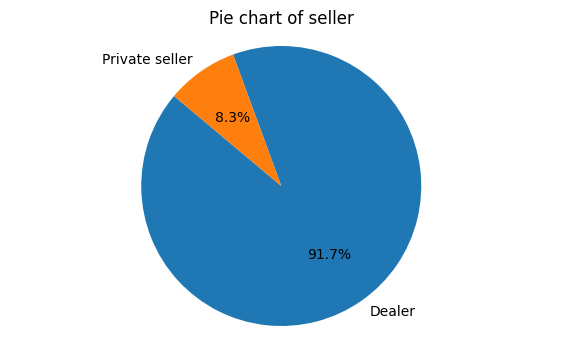

In [1485]:
pie_chart_column(df,'seller')

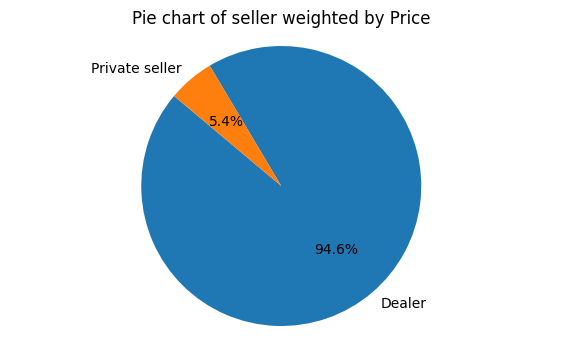

In [1486]:
pie_chart_with_price(df,'seller')

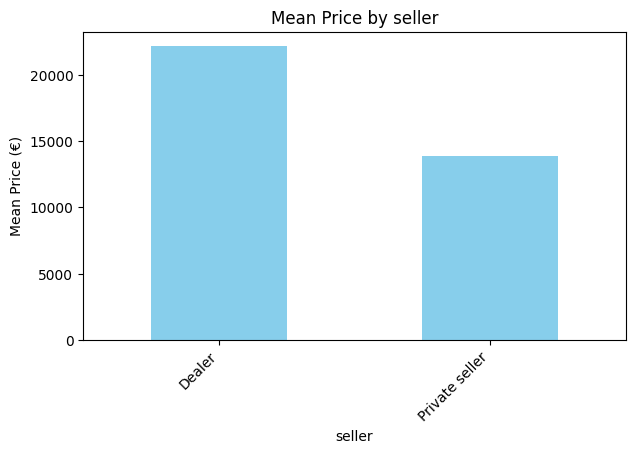

In [1487]:
plot_column_by_price(df,'seller')

# 10. Drive Train

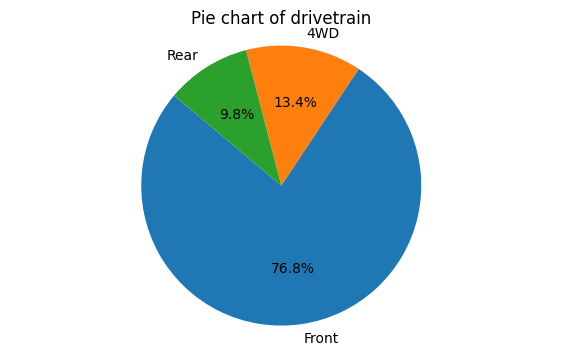

In [1489]:
pie_chart_column(df,'drivetrain')

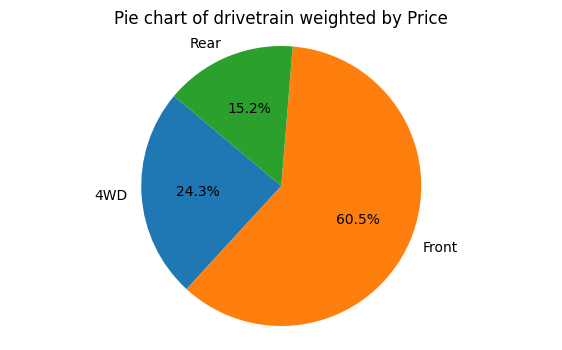

In [1490]:
pie_chart_with_price(df,'drivetrain')

# 11. Service History

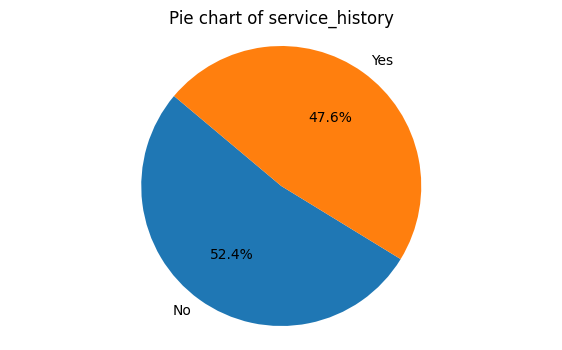

In [1491]:
pie_chart_column(df,'service_history')

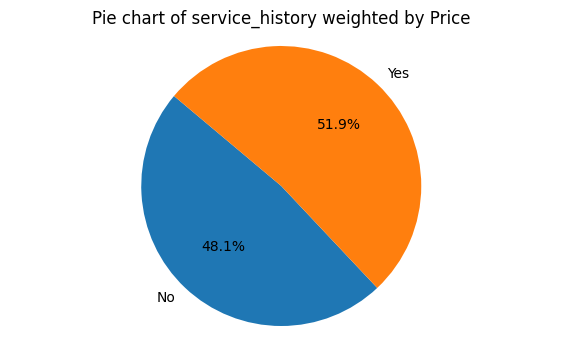

In [1492]:
pie_chart_with_price(df,'service_history')

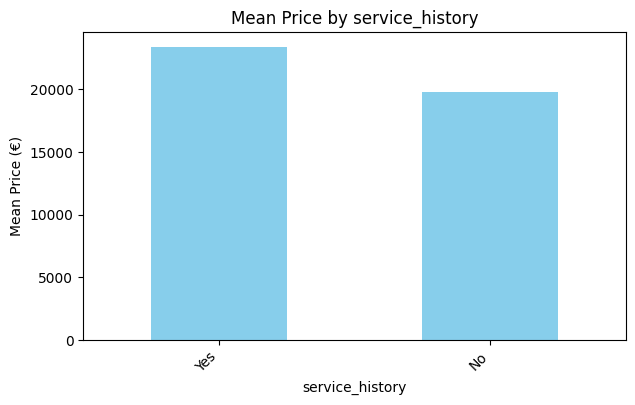

In [1493]:
plot_column_by_price(df,'service_history')

# 12. Non Smoker

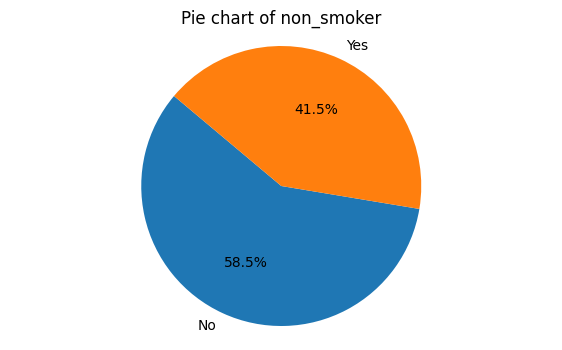

In [1494]:
pie_chart_column(df,'non_smoker')

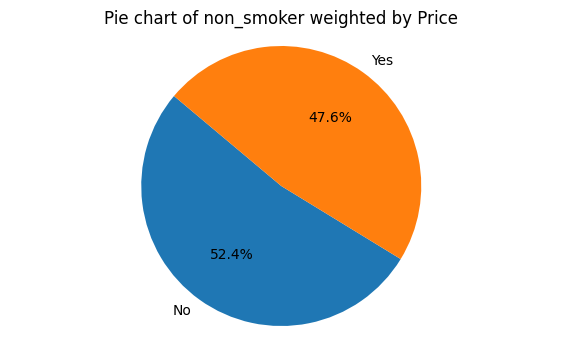

In [1495]:
pie_chart_with_price(df,'non_smoker')

# 13. Emission Sticker

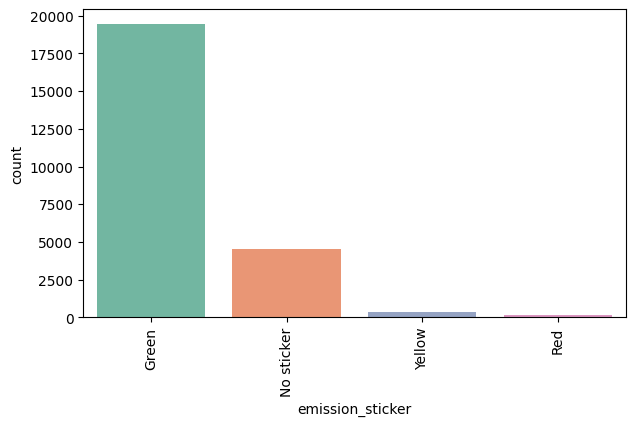

In [1510]:
count_plot_column(df,'emission_sticker')

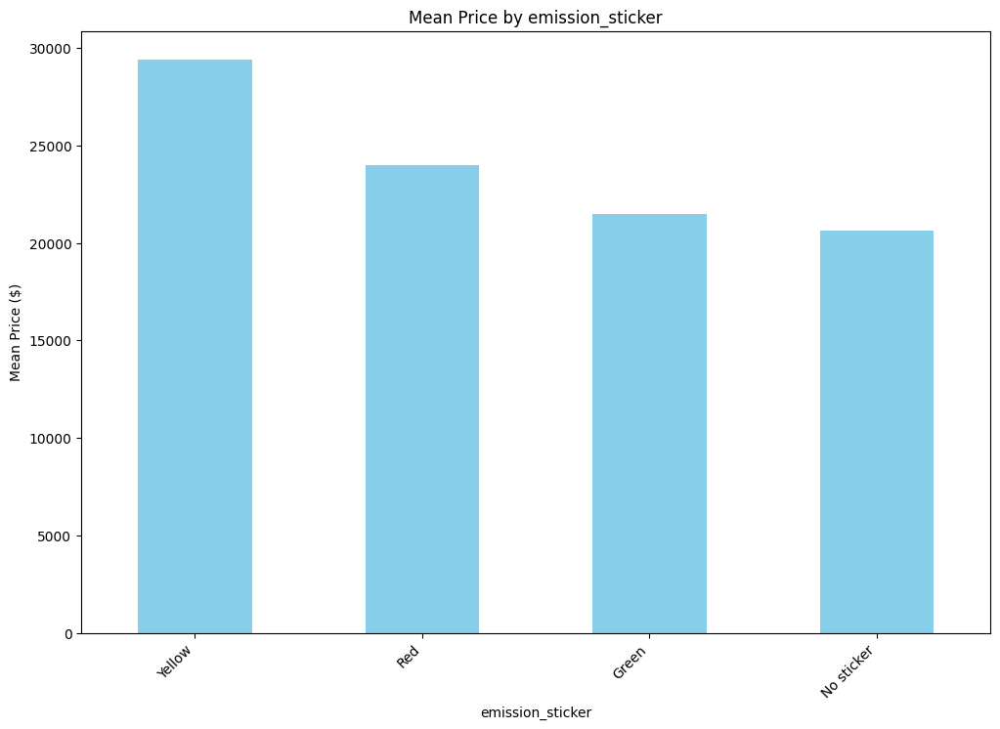

In [1512]:
ba(df,'emission_sticker')

# 14. Upholstery_color

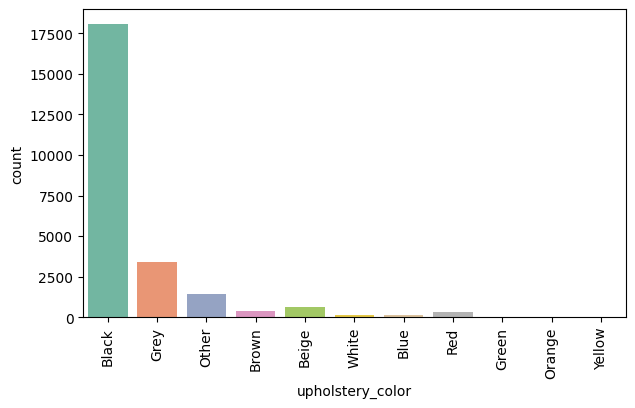

In [1507]:
count_plot_column(df,'upholstery_color')

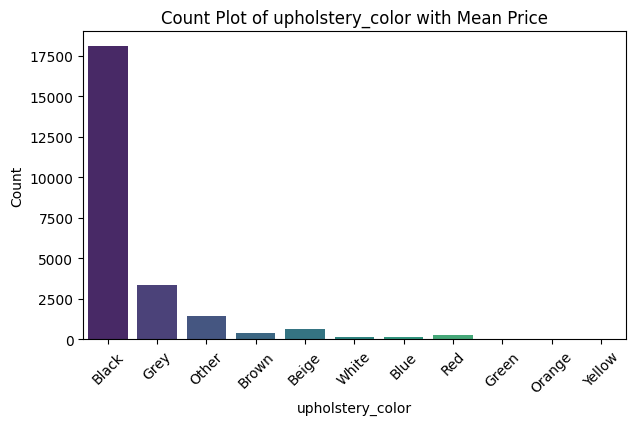

In [1536]:
count_plot_with_price(df,'upholstery_color')

# 15. Upholstery

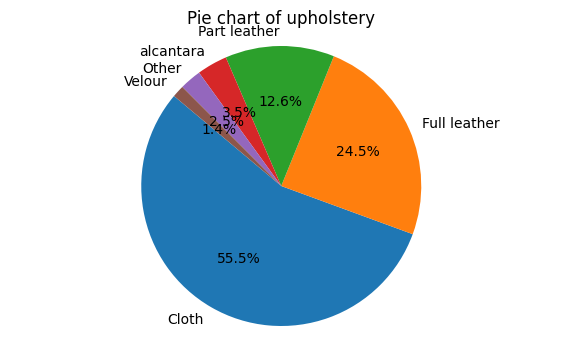

In [1537]:
pie_chart_column(df,'upholstery')

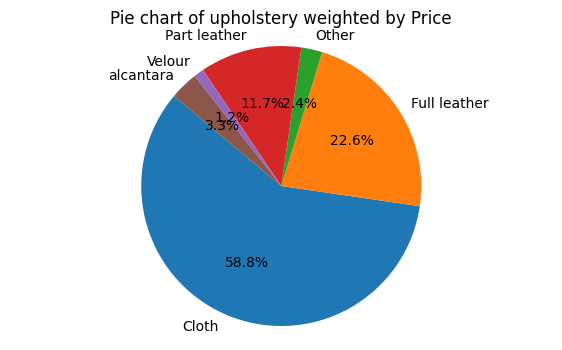

In [1538]:
pie_chart_with_price(df,'upholstery')

# 16. available

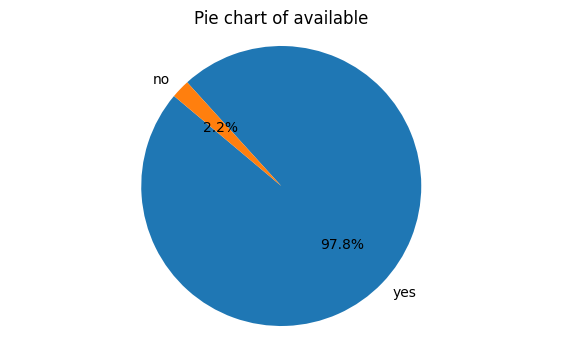

In [1540]:
pie_chart_column(df,'available')

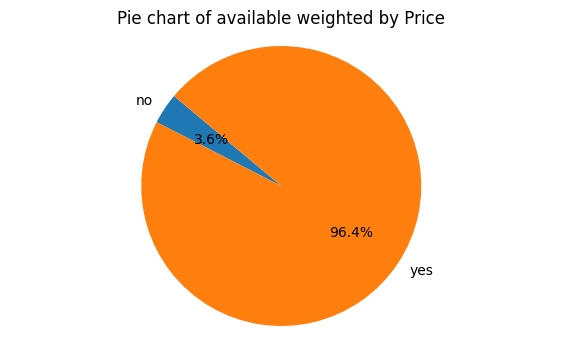

In [1541]:
pie_chart_with_price(df,'available')

# 17. taxi_rental

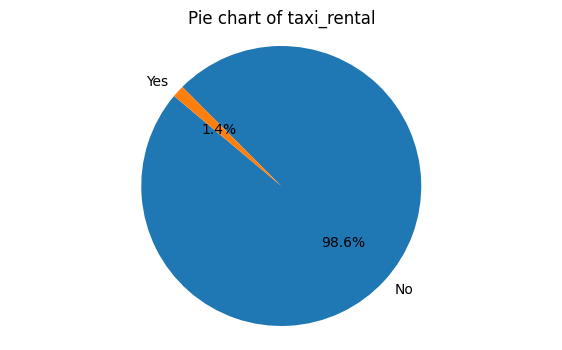

In [1542]:
pie_chart_column(df,'taxi_rental')

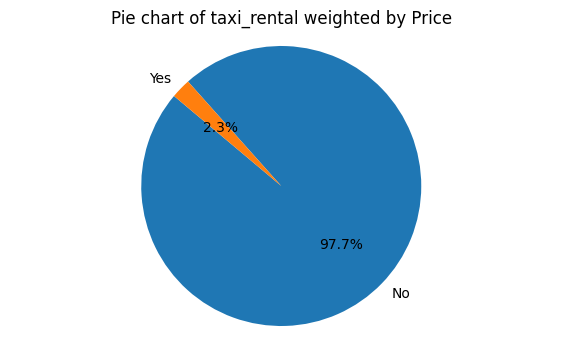

In [1543]:
pie_chart_with_price(df,'taxi_rental')

# 18. inspection_status

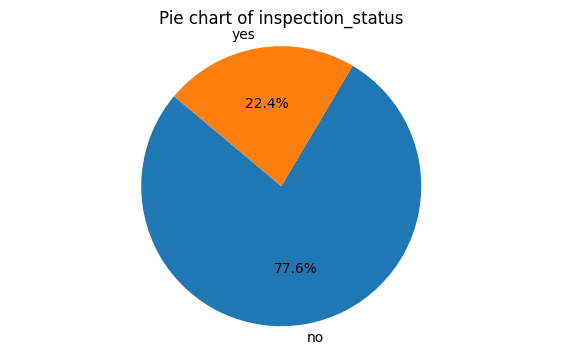

In [1544]:
pie_chart_column(df,'inspection_status')

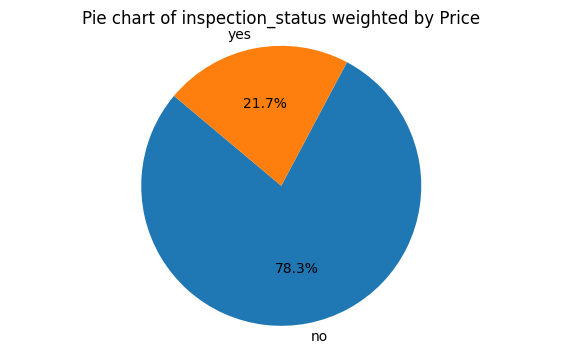

In [1545]:
pie_chart_with_price(df,'inspection_status')

# 19.  energy_efficiency_class

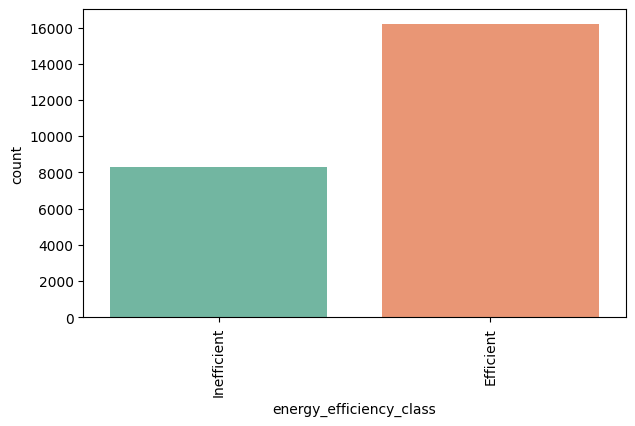

In [1546]:
count_plot_column(df,'energy_efficiency_class')

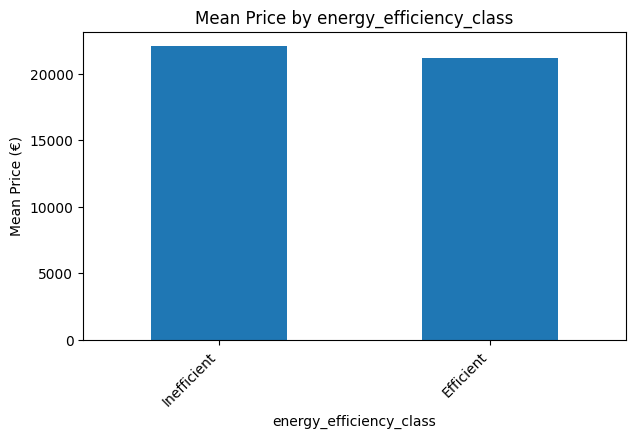

In [1550]:
barplot_column_by_price(df,'energy_efficiency_class')

# 20. safety_security_package

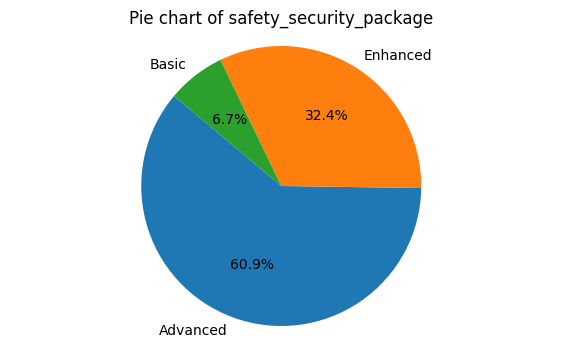

In [1551]:
pie_chart_column(df,'safety_security_package')

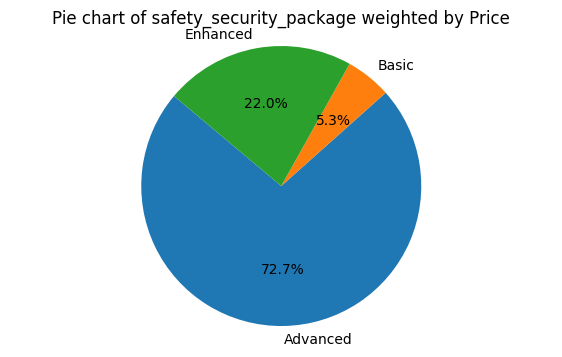

In [1552]:
pie_chart_with_price(df,'safety_security_package')

# 21. comfort_convenience_package

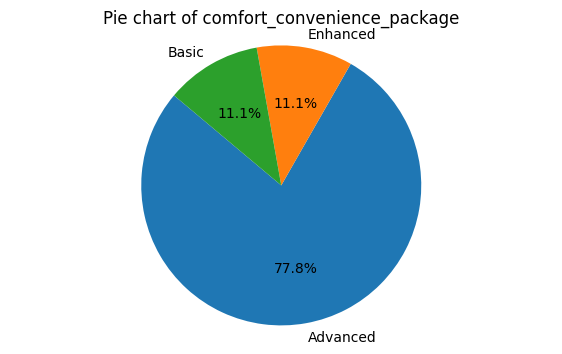

In [1553]:
pie_chart_column(df,'comfort_convenience_package')

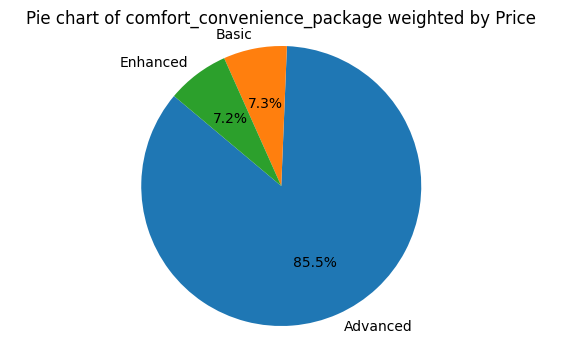

In [1554]:
pie_chart_with_price(df,'comfort_convenience_package')

# 22. ent_media_package

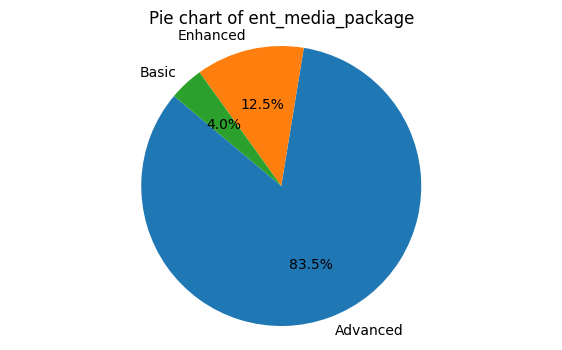

In [1555]:
pie_chart_column(df,'ent_media_package')

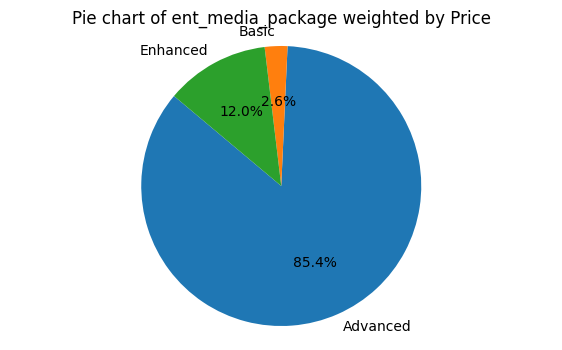

In [1556]:
pie_chart_with_price(df,'ent_media_package')

In [1568]:
df.select_dtypes(include=['object']).describe().T

,count,unique,top,freq
body_type,24529,6,Off-Road/Pick-up,4672
warranty,24529,2,Yes,13086
gearbox,24529,3,Manual,15095
fuel_type,24529,4,Benzine,16129
colour,24529,14,Black,5934
drivetrain,24529,3,Front,18835
non_smoker,24529,2,No,14347
emission_sticker,24529,4,Green,19453
upholstery,24529,6,Cloth,13619
safety_security_package,24529,3,Advanced,14933


In [1558]:
df.select_dtypes(include=['float']).describe().T

,count,mean,std,min,25%,50%,75%,max
price,24529.0,21472.768927,14969.043975,490.000000,11890.000000,17900.000000,27250.000000,97590.0
doors,24529.0,4.148070,1.199488,2.000000,3.000000,5.000000,5.000000,5.0
mileage,24529.0,71935.296243,63410.531156,0.000000,21500.000000,57100.000000,105990.000000,399900.0
seats,24529.0,4.710954,0.765220,1.000000,5.000000,5.000000,5.000000,9.0
engine_size,24529.0,1717.617066,734.311053,200.000000,1248.000000,1591.000000,1984.000000,6000.0
gears,24529.0,5.881283,1.421980,1.000000,5.000000,6.000000,6.000000,10.0
co2_emissions,24529.0,132.256676,129.224188,0.000000,106.000000,125.000000,156.000000,15168.0
empty_weight,24529.0,1399.360331,284.967171,347.000000,1198.000000,1370.000000,1570.000000,2900.0
power_kW,24529.0,115.594986,60.828968,4.000000,78.000000,99.000000,133.000000,450.0
fuel_consumption_comb,24529.0,6.040860,1.785706,3.217647,4.845736,5.542237,6.698559,12.9


In [1539]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24529 entries, 0 to 24528
Data columns (total 34 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   make_model                   24529 non-null  object 
 1   price                        24529 non-null  float64
 2   body_type                    24529 non-null  object 
 3   type                         24529 non-null  object 
 4   doors                        24529 non-null  float64
 5   warranty                     24529 non-null  object 
 6   mileage                      24529 non-null  float64
 7   gearbox                      24529 non-null  object 
 8   fuel_type                    24529 non-null  object 
 9   colour                       24529 non-null  object 
 10  paint                        24529 non-null  object 
 11  seller                       24529 non-null  object 
 12  seats                        24529 non-null  float64
 13  engine_size     

In [1559]:
df.drop(columns=['energy_efficiency_class', 'taxi_rental','available','inspection_status','paint',
                
                'type', 'seller','service_history','upholstery_color', 'doors', 'num_of_extras',
                'empty_weight'],inplace=True)

In [1560]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24529 entries, 0 to 24528
Data columns (total 22 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   make_model                   24529 non-null  object 
 1   price                        24529 non-null  float64
 2   body_type                    24529 non-null  object 
 3   warranty                     24529 non-null  object 
 4   mileage                      24529 non-null  float64
 5   gearbox                      24529 non-null  object 
 6   fuel_type                    24529 non-null  object 
 7   colour                       24529 non-null  object 
 8   seats                        24529 non-null  float64
 9   engine_size                  24529 non-null  float64
 10  gears                        24529 non-null  float64
 11  co2_emissions                24529 non-null  float64
 12  drivetrain                   24529 non-null  object 
 13  non_smoker      

In [1561]:
df.to_csv('final_scout_not_dummy.csv',index=False)

In [1562]:
df['make_model_factorized'], unique_make_models = pd.factorize(df['make_model'])
print(unique_make_models)

Index(['Dacia Duster', 'Dacia Jogger', 'Dacia Lodgy', 'Dacia Logan',
       'Dacia Sandero', 'Dacia Spring', 'Fiat 500', 'Fiat 500C', 'Fiat 500L',
       'Fiat 500X',
       ...
       'Opel Commodore', 'Volvo P1800', 'Mercedes-Benz 350',
       'Fiat Cinquecento', 'Ford Mercury', 'Volvo Amazon', 'Fiat 600',
       'Peugeot 404', 'Ford  T-Bird', 'Ford Fairlane V8'],
      dtype='object', length=695)


In [1563]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24529 entries, 0 to 24528
Data columns (total 23 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   make_model                   24529 non-null  object 
 1   price                        24529 non-null  float64
 2   body_type                    24529 non-null  object 
 3   warranty                     24529 non-null  object 
 4   mileage                      24529 non-null  float64
 5   gearbox                      24529 non-null  object 
 6   fuel_type                    24529 non-null  object 
 7   colour                       24529 non-null  object 
 8   seats                        24529 non-null  float64
 9   engine_size                  24529 non-null  float64
 10  gears                        24529 non-null  float64
 11  co2_emissions                24529 non-null  float64
 12  drivetrain                   24529 non-null  object 
 13  non_smoker      

In [1564]:
df.drop(columns='make_model',inplace=True)

In [1565]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24529 entries, 0 to 24528
Data columns (total 22 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   price                        24529 non-null  float64
 1   body_type                    24529 non-null  object 
 2   warranty                     24529 non-null  object 
 3   mileage                      24529 non-null  float64
 4   gearbox                      24529 non-null  object 
 5   fuel_type                    24529 non-null  object 
 6   colour                       24529 non-null  object 
 7   seats                        24529 non-null  float64
 8   engine_size                  24529 non-null  float64
 9   gears                        24529 non-null  float64
 10  co2_emissions                24529 non-null  float64
 11  drivetrain                   24529 non-null  object 
 12  non_smoker                   24529 non-null  object 
 13  emission_sticker

In [1566]:
df['make_model_factorized']

0          0
1          0
2          0
3          0
4          0
        ... 
24524    694
24525    547
24526    689
24527    547
24528    673
Name: make_model_factorized, Length: 24529, dtype: int64

In [1571]:
categoric= df.select_dtypes(include=['object']).columns
categoric


Index(['body_type', 'warranty', 'gearbox', 'fuel_type', 'colour', 'drivetrain',
       'non_smoker', 'emission_sticker', 'upholstery',
       'safety_security_package', 'comfort_convenience_package',
       'ent_media_package'],
      dtype='object')

In [1575]:
df_numeric = pd.get_dummies(df, drop_first=True)
df_numeric = df_numeric.astype(int)
df_numeric.T

,0,1,2,3,4,5,6,7,8,9,...,24519,24520,24521,24522,24523,24524,24525,24526,24527,24528
price,21000,21000,21150,25190,24222,21990,23556,21990,23480,23200,...,32000,48500,35900,49900,16500,24549,49890,26750,28900,15990
mileage,1000,1000,4500,4018,8000,7,10,7,12751,1360,...,100000,200000,18620,99500,21707,42736,24000,124000,30000,78000
seats,5,5,5,5,5,5,5,5,5,5,...,4,4,4,6,4,5,4,6,2,4
engine_size,1461,1461,1332,1332,1332,1332,1461,1332,1332,1461,...,1221,1800,500,5689,1089,5768,5766,6000,3950,1488
gears,6,6,6,6,6,6,6,6,6,6,...,4,5,5,6,4,10,3,2,3,3
co2_emissions,106,106,131,153,121,131,112,131,128,143,...,132,582,100,0,132,0,271,148,271,178
power_kW,85,85,96,110,110,96,85,96,110,85,...,36,66,56,221,40,221,221,218,132,33
fuel_consumption_comb,4,4,5,6,5,5,4,5,6,4,...,6,10,5,6,6,6,9,6,9,6
age,0,0,0,0,0,0,0,0,0,0,...,61,61,62,63,63,64,64,65,65,65
make_model_factorized,0,0,0,0,0,0,0,0,0,0,...,598,686,6,694,598,694,547,689,547,673


In [1577]:
df_numeric.to_csv("final_scout_dummy.csv", index=False)

In [1459]:
from sklearn.linear_model import LinearRegression
import pandas as pd

# List of numeric columns
numeric_columns = ['price','doors',  'mileage', 'seats',  'gears',
       'co2_emissions', 'empty_weight', 'power_kW', 'fuel_consumption_comb','age', 'num_of_extras'
       ]

# Create a DataFrame with only the numeric columns
numeric_df = df[numeric_columns]

# Split into features (X) and target variable (y)
X = numeric_df.drop(columns=['price'])  # Features
y = df['price']  # Target variable

# Instantiate LinearRegression
reg = LinearRegression().fit(X, y)
predictions = reg.predict(X)

# R² value
r_squared = reg.score(X, y)
print(f"R² value: {r_squared}")

# Regression coefficients and intercept
print(f"Regression coefficients: {reg.coef_}")
print(f"Intercept: {reg.intercept_}")

R² value: 0.7477042652793955
Regression coefficients: [ 1.71718706e+02 -9.89358027e-02 -3.80635568e+02  6.03233063e+02
 -2.12594805e+00  1.44120202e+01  1.41931523e+02 -1.44119993e+03
  7.41452894e+01  9.78793825e-01]
Intercept: -1968.3470458546362
